<a href="https://colab.research.google.com/github/pr-shukla/MS-Thesis/blob/main/multi_pursuer_evader.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import math
from tensorflow.keras.models import load_model

In [ ]:
#Dimension of State Space for single agent
dim_agent_state = 4

#hidden_nodes = 3

#Time Difference Between 2 Steps
dt = 1.0

#Number of Episodes
num_episodes = 1000

#Number of Steps

num_steps = 100

#buffer_range = 60

#Minimum turing radius of Pursuer
rho = 0.3

#velocity of pursuer
v = 1.0


#Velocity of Evader during training
ve = 0.1

#angle between initial velocity and reference
te = 3*np.pi/4

num_agents = 2

#Dimension of State Space
dim_state = dim_agent_state*num_agents

In [ ]:
class OUActionNoise:
    def __init__(self, mean, std_deviation, theta=0.15, dt=0.4, x_initial=None):
        self.theta = theta
        self.mean = mean
        self.std_dev = std_deviation
        self.dt = dt
        self.x_initial = x_initial
        self.reset()

    def __call__(self):
        # Formula taken from https://www.wikipedia.org/wiki/Ornstein-Uhlenbeck_process.
        x = (
            self.x_prev
            + self.theta * (self.mean - self.x_prev) * self.dt
            + self.std_dev * np.sqrt(self.dt) * np.random.normal(size=self.mean.shape)
        )
        # Store x into x_prev
        # Makes next noise dependent on current one
        self.x_prev = x
        return x

    def reset(self):
        if self.x_initial is not None:
            self.x_prev = self.x_initial
        else:
            self.x_prev = np.zeros_like(self.mean)

In [ ]:
class Buffer:
    def __init__(self, buffer_capacity=10000, batch_size=64):

        # Number of "experiences" to store at max
        self.buffer_capacity = buffer_capacity
        # Num of tuples to train on.
        self.batch_size = batch_size

        # Its tells us num of times record() was called.
        self.buffer_counter = 0

        # Instead of list of tuples as the exp.replay concept go
        # We use different np.arrays for each tuple element
        self.state_buffer = np.zeros((self.buffer_capacity, dim_state))
        self.action_buffer = np.zeros((self.buffer_capacity, num_agents))
        self.reward_buffer = np.zeros((self.buffer_capacity, num_agents))
        self.next_state_buffer = np.zeros((self.buffer_capacity, dim_state))

    # Takes (s,a,r,s') obervation tuple as input
    def record(self, obs_tuple):
        # Set index to zero if buffer_capacity is exceeded,
        # replacing old records
        index = self.buffer_counter % self.buffer_capacity

        self.state_buffer[index] = obs_tuple[0]
        self.action_buffer[index] = obs_tuple[1]
        self.reward_buffer[index] = obs_tuple[2]
        self.next_state_buffer[index] = obs_tuple[3]

        self.buffer_counter += 1

    # We compute the loss and update parameters
    def learn(self, ac_models, cr_models, target_ac, target_cr):
      for i in range(num_agents):
        # Get sampling range
        record_range = min(self.buffer_counter, self.buffer_capacity)
        # Randomly sample indices
        batch_indices = np.random.choice(record_range, self.batch_size)

        # Convert to tensors
        state_batch = tf.convert_to_tensor(self.state_buffer[batch_indices])
        action_batch = tf.convert_to_tensor(self.action_buffer[batch_indices])
        reward_batch = tf.convert_to_tensor(self.reward_buffer[batch_indices])
        reward_batch = tf.cast(reward_batch, dtype=tf.float32)
        next_state_batch = tf.convert_to_tensor(self.next_state_buffer[batch_indices])

        # Training and updating Actor & Critic networks.
        # See Pseudo Code.

        target_actions = np.zeros((self.batch_size, num_agents))
        for j in range(num_agents):
          target_actions[:,j] = tf.reshape(
              target_ac[j](next_state_batch[:,4*j:4*(j+1)]), [self.batch_size]
              )

        target_action_batch1 = target_actions[:,0]
        target_action_batch2 = target_actions[:,1]
        action_batch1 = action_batch[:,0]
        action_batch2 = action_batch[:,1]
    
        with tf.GradientTape() as tape:
            y = reward_batch[:,i] + gamma * target_cr[i]([
                                                          next_state_batch, target_action_batch1, target_action_batch2
                                                          ])
            
            critic_value = cr_models[i]([
                                         state_batch, action_batch1, action_batch2
                                         ])
            
            critic_loss = tf.math.reduce_mean(tf.math.square(y - critic_value))

        critic_grad = tape.gradient(critic_loss, cr_models[i].trainable_variables)
        #print(np.shape(critic_grad[0]),np.shape(critic_grad[1]))
        critic_optimizer.apply_gradients(
            zip(critic_grad, cr_models[i].trainable_variables)
        )

        actions = np.zeros((self.batch_size, num_agents))
        for j in range(num_agents):
          a = ac_models[j](state_batch[:,4*j:4*(j+1)])
          actions[:,j] = tf.reshape(a, [self.batch_size])

        #actions = tf.Variable(actions)

        '''
        with tf.GradientTape() as tape:
          critic_value = cr_models[i]([state_batch, actions])
        critic_grad_ac = tape.gradient(critic_value, actions)
        
        with tf.GradientTape() as tape:
          action = ac_models[i](state_batch)
        ac_gradient = tape.gradient(action, ac_models[i].trainable_variables)
        print(np.shape(ac_gradient), len(ac_gradient), np.shape(critic_grad_ac), len(critic_grad_ac))

        for j in range(len(critic_grad_ac)):
          critic_grad_ac[j] += critic_grad_ac[j]*float(ac_gradient[j]) 
        critic_grad_ac /= self.batch_size
        
        actor_optimizer.apply_gradients(
            zip(ac_gradient, ac_models[i].trainable_variables)
        )
        print(11,np.shape(critic_grad_ac))
        '''
        


        #print(np.shape(ac_gradient[0]),np.shape(ac_gradient[1]))

        if i == 0:
          with tf.GradientTape() as tape:
              #print(actions[:,i].shape, tf.squeeze(ac_models[i](state_batch)).shape)
              action_ = ac_models[i](state_batch[:,4*i:4*(i+1)])
              #actions[:,i] = tf.squeeze(action_)
              #actions[:,1] = tf.reshape(ac_models[1](state_batch), [self.batch_size])
              #actions = ac_models[i](state_batch)
              critic_value = cr_models[i]([state_batch, action_, actions[:,1]])
              # Used `-value` as we want to maximize the value given
              # by the critic for our actions
              actor_loss = -tf.math.reduce_mean(critic_value)
        else:
          with tf.GradientTape() as tape:
              #print(actions[:,i].shape, tf.squeeze(ac_models[i](state_batch)).shape)
              action_ = ac_models[i](state_batch[:,4*i:4*(i+1)])
              #actions[:,i] = tf.squeeze(action_)
              #actions[:,1] = tf.reshape(ac_models[1](state_batch), [self.batch_size])
              #actions = ac_models[i](state_batch)
              critic_value = cr_models[i]([state_batch, actions[:,0], action_])
              # Used `-value` as we want to maximize the value given
              # by the critic for our actions
              actor_loss = -tf.math.reduce_mean(critic_value)
          
        #print(ac_models[i].trainable_variables, actor_loss)
        actor_grad = tape.gradient(actor_loss, ac_models[i].trainable_variables)
        #print(actor_grad)
        actor_optimizer.apply_gradients(
            zip(actor_grad, ac_models[i].trainable_variables)
        )
        


# This update target parameters slowly
# Based on rate `tau`, which is much less than one.
def update_target(tau, ac_models, cr_models, target_ac, target_cr):
  for i in range(num_agents):
    new_weights = []
    target_variables = target_cr[i].weights
    for j, variable in enumerate(cr_models[i].weights):
        new_weights.append(variable * tau + target_variables[j] * (1 - tau))

    target_cr[i].set_weights(new_weights)

    new_weights = []
    target_variables = target_ac[i].weights
    for j, variable in enumerate(ac_models[i].weights):
        new_weights.append(variable * tau + target_variables[j] * (1 - tau))

    target_ac[i].set_weights(new_weights)

In [ ]:
class Buffer:
    def __init__(self, buffer_capacity=10000, batch_size=64):

        # Number of "experiences" to store at max
        self.buffer_capacity = buffer_capacity
        # Num of tuples to train on.
        self.batch_size = batch_size

        # Its tells us num of times record() was called.
        self.buffer_counter = 0

        # Instead of list of tuples as the exp.replay concept go
        # We use different np.arrays for each tuple element
        self.state_buffer = np.zeros((self.buffer_capacity, dim_state))
        self.action_buffer = np.zeros((self.buffer_capacity, num_agents))
        self.reward_buffer = np.zeros((self.buffer_capacity, num_agents))
        self.next_state_buffer = np.zeros((self.buffer_capacity, dim_state))

    # Takes (s,a,r,s') obervation tuple as input
    def record(self, obs_tuple):
        # Set index to zero if buffer_capacity is exceeded,
        # replacing old records
        index = self.buffer_counter % self.buffer_capacity

        self.state_buffer[index] = obs_tuple[0]
        self.action_buffer[index] = obs_tuple[1]
        self.reward_buffer[index] = obs_tuple[2]
        self.next_state_buffer[index] = obs_tuple[3]

        self.buffer_counter += 1

    # We compute the loss and update parameters
    def learn(self, ac_models, cr_models, target_ac, target_cr):
      for i in range(num_agents):
        # Get sampling range
        record_range = min(self.buffer_counter, self.buffer_capacity)
        # Randomly sample indices
        batch_indices = np.random.choice(record_range, self.batch_size)

        # Convert to tensors
        state_batch = tf.convert_to_tensor(self.state_buffer[batch_indices])
        action_batch = tf.convert_to_tensor(self.action_buffer[batch_indices])
        reward_batch = tf.convert_to_tensor(self.reward_buffer[batch_indices])
        reward_batch = tf.cast(reward_batch, dtype=tf.float32)
        next_state_batch = tf.convert_to_tensor(self.next_state_buffer[batch_indices])

        # Training and updating Actor & Critic networks.
        # See Pseudo Code.

        target_actions = np.zeros((self.batch_size, num_agents))
        for j in range(num_agents):
          target_actions[:,j] = tf.reshape(
              target_ac[j](next_state_batch[:,4*j:4*(j+1)]), [self.batch_size]
              )

        target_action_batch1 = target_actions[:,0]
        target_action_batch2 = target_actions[:,1]
        action_batch1 = action_batch[:,0]
        action_batch2 = action_batch[:,1]
    
        with tf.GradientTape() as tape:
            y = reward_batch[:,i] + gamma * target_cr[i]([
                                                          next_state_batch, target_action_batch1, target_action_batch2
                                                          ])
            
            critic_value = cr_models[i]([
                                         state_batch, action_batch1, action_batch2
                                         ])
            
            critic_loss = tf.math.reduce_mean(tf.math.square(y - critic_value))

        critic_grad = tape.gradient(critic_loss, cr_models[i].trainable_variables)
        #print(np.shape(critic_grad[0]),np.shape(critic_grad[1]))
        critic_optimizer.apply_gradients(
            zip(critic_grad, cr_models[i].trainable_variables)
        )

        actions = np.zeros((self.batch_size, num_agents))
        for j in range(num_agents):
          a = ac_models[j](state_batch[:,4*j:4*(j+1)])
          actions[:,j] = tf.reshape(a, [self.batch_size])

  

        #print(np.shape(ac_gradient[0]),np.shape(ac_gradient[1]))

        if i == 0:
          
          with tf.GradientTape(persistent=True) as tape:
              
              action_ = ac_models[i](np.array([state_batch[:,4*i:4*(i+1)][0]]))
              
              critic_value = cr_models[i]([np.array([state_batch[0]]), action_, np.array([actions[:,1][0]])])

          critic_grad = tape.gradient(critic_value, action_)
          actor_grad = tape.gradient(action_, ac_models[i].trainable_variables)

          
          new_actor_grad = [critic_grad[0][0]*element for element in actor_grad]

          for k in range(1,self.batch_size):
              with tf.GradientTape(persistent=True) as tape:
                  
                  action_ = ac_models[i](np.array([state_batch[:,4*i:4*(i+1)][k]]))
                  
                  critic_value = cr_models[i]([np.array([state_batch[k]]), action_, np.array([actions[:,1][k]])])

              critic_grad = tape.gradient(critic_value, action_)
              actor_grad = tape.gradient(action_, ac_models[i].trainable_variables)

              for l in range(len(new_actor_grad)):
                new_actor_grad[l] = new_actor_grad[l] + critic_grad[0][0]*actor_grad[l]


          new_actor_grad = [-1*element/self.batch_size for element in new_actor_grad]
          actor_optimizer.apply_gradients(zip(new_actor_grad, ac_models[i].trainable_variables))
          
          
          

        else:
          with tf.GradientTape(persistent=True) as tape:
              
              action_ = ac_models[i](np.array([state_batch[:,4*i:4*(i+1)][0]]))
              
              critic_value = cr_models[i]([np.array([state_batch[0]]), np.array([actions[:,0][0]]),action_])

          critic_grad = tape.gradient(critic_value, action_)
          actor_grad = tape.gradient(action_, ac_models[i].trainable_variables)

          
          new_actor_grad = [critic_grad[0][0]*element for element in actor_grad]

          for k in range(1,self.batch_size):
              with tf.GradientTape(persistent=True) as tape:
                  
                  action_ = ac_models[i](np.array([state_batch[:,4*i:4*(i+1)][k]]))
                  
                  critic_value = cr_models[i]([np.array([state_batch[k]]), np.array([actions[:,0][k]]),action_])

              critic_grad = tape.gradient(critic_value, action_)
              actor_grad = tape.gradient(action_, ac_models[i].trainable_variables)

              for l in range(len(new_actor_grad)):
                new_actor_grad[l] = new_actor_grad[l] + critic_grad[0][0]*actor_grad[l]


          new_actor_grad = [-1*element/self.batch_size for element in new_actor_grad]
          actor_optimizer.apply_gradients(zip(new_actor_grad, ac_models[i].trainable_variables))

          
        
        


# This update target parameters slowly
# Based on rate `tau`, which is much less than one.
def update_target(tau, ac_models, cr_models, target_ac, target_cr):
  for i in range(num_agents):
    new_weights = []
    target_variables = target_cr[i].weights
    for j, variable in enumerate(cr_models[i].weights):
        new_weights.append(variable * tau + target_variables[j] * (1 - tau))

    target_cr[i].set_weights(new_weights)

    new_weights = []
    target_variables = target_ac[i].weights
    for j, variable in enumerate(ac_models[i].weights):
        new_weights.append(variable * tau + target_variables[j] * (1 - tau))

    target_ac[i].set_weights(new_weights)

In [ ]:

def get_actor():
    # Initialize weights between -3e-3 and 3-e3
    last_init = tf.random_uniform_initializer(minval=-0.00003, maxval=0.00003)

    inputs = layers.Input(shape=(4,))
    out = layers.Dense(256, activation="selu", kernel_initializer="lecun_normal")(inputs)
    out = layers.Dropout(rate=0.5)(out)
    out = layers.BatchNormalization()(out)
    out = layers.Dense(256, activation="selu", kernel_initializer="lecun_normal")(out)
    out = layers.Dropout(rate=0.5)(out)
    out = layers.BatchNormalization()(out)
    
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    # Our upper bound is 2.0 for Pendulum.
    outputs = outputs 
    model = tf.keras.Model(inputs, outputs)
    return model
'''

def get_actor():
    last_init = tf.random_uniform_initializer(minval=-0.0003, maxval=0.0003)
    base_model = load_model('actor_model.h5')#(include_top=False)
    #base_model.summary()
    #out = layers.Dense(256, activation="selu", kernel_initializer='lecun_normal')(base_model.layers[6].output)
    #out = layers.Dropout(rate=0.5)(out)
    #out = layers.BatchNormalization()(out)

    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)((base_model.layers[6].output)/1000)
    outputs = outputs

    model = tf.keras.Model(inputs = base_model.input, outputs = outputs)

    #i = 0

    for layer in base_model.layers:
        #i += 1
        #print(i)

        layer.trainable = False

    return model
'''




def get_critic():
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)
    
    # State as input
    state_input = layers.Input(shape=(dim_state))
    state_out = layers.Dense(16, activation="selu", kernel_initializer="lecun_normal")(state_input)
    state_out = layers.BatchNormalization()(state_out)
    state_out = layers.Dense(32, activation="selu", kernel_initializer="lecun_normal")(state_out)
    state_out = layers.BatchNormalization()(state_out)

    # Action as input
    action_input1 = layers.Input(shape=(1))
    action_input2 = layers.Input(shape=(1))
    action_input = layers.Concatenate()([action_input1, action_input2])
    action_out = layers.Dense(32, activation="selu", kernel_initializer="lecun_normal")(action_input)
    action_out = layers.BatchNormalization()(action_out)

    # Both are passed through seperate layer before concatenating
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(512, activation="selu", kernel_initializer="lecun_normal")(concat)
    out = layers.Dropout(rate=0.5)(out)
    out = layers.BatchNormalization()(out)
    out = layers.Dense(512, activation="selu", kernel_initializer="lecun_normal")(out)
    out = layers.Dropout(rate=0.5)(out)
    out = layers.BatchNormalization()(out)
    
    outputs = layers.Dense(1)(out)


    # Outputs single value for give state-action
    model = tf.keras.Model([state_input, action_input1, action_input2], outputs)

    return model

In [ ]:
def policy(state, noise_object, model):
    
    sampled_actions = tf.squeeze(model(state))
    noise = noise_object()

    # Adding noise to action
    sampled_actions = sampled_actions.numpy() + noise

    # We make sure action is within bounds
    legal_action = np.clip(sampled_actions, -1.0, 1.0)

    return [np.squeeze(legal_action)]



In [ ]:
std_dev = 0.2
ou_noise = OUActionNoise(mean=np.zeros(1), std_deviation=float(std_dev) * np.ones(1))

ac_models = []
cr_models = []
target_ac = []
target_cr = []

for i in range(num_agents):
  ac_models.append(get_actor()) 
  cr_models.append(get_critic())

  target_ac.append(get_actor())
  target_cr.append(get_critic())

  # Making the weights equal initially
  target_ac[i].set_weights(ac_models[i].get_weights())
  target_cr[i].set_weights(cr_models[i].get_weights())


# Learning rate for actor-critic models
#critic_lr = 1e-3
#actor_lr = 5e-4
critic_lr = 5e-5
actor_lr = 2.5e-5


critic_optimizer = tf.keras.optimizers.Adam(critic_lr)
actor_optimizer = tf.keras.optimizers.Adam(actor_lr)

# Discount factor for future rewards
gamma = 0.95
# Used to update target networks
tau = 0.005

buffer = Buffer(10000, 1)

In [ ]:
#Function for generating sigmoid output of Input Function
def sigmoid(x):
    val = 1/(1+np.exp(-x))
    return val

#Calculating Distance between Pursuer and Evader
def L(rx1, ry1, rx2, ry2):
    d = np.sqrt((rx2-rx1)**2 + (ry2-ry1)**2)
    return d
'''
def L(state):
    L = np.sqrt((state[4] - state[0])**2 + (state[5]-state[1])**2)
    return L
'''

'''
#Magnitude of Velocity Calculator
def V(state):
    v = np.sqrt(state[2]**2+state[3]**2)
    return v
'''

#Calculating angle between velocity and reference axis
def thetap(state):
    v = 1.0
    angle = math.acos(state[2]/v)*((state[3]+0.001)/abs(state[3]+0.001))-np.pi*((state[3]+0.0001)/(abs(state[3])+0.0001)-1)
    return angle

def alph(state):
    l = L(state)
    angle = math.acos((state[4]-state[0])/l)*(state[5]-state[1]+0.0001)/abs(state[5]-state[1]+0.0001)-(np.pi)*(((state[5]-state[1]+0.0001)/abs(0.0001+state[5]-state[1]))-1)
    return angle

#Reward Calculator
def reward(state):
  rewards = []
  for i in range(num_agents):
    '''
    ag_state = []
    for j in state[i*4:(i+1)*4]:
      ag_state.append(j)
    for j in ev_state:
      ag_state.append(j)
    '''

    r1 = 10*np.exp(-3*state[0+i*4])
    r2 = 10*np.exp(-1*state[1+i*4])
    r3 = 5*np.arctan(1*state[2+i*4])
    r4 = 10*np.exp(-3*state[3+i*4])
    r5 = 10*np.exp(-1*state[0+i*4]*state[2+i*4])
    r =  r1  + r2 #+ r4#+ r4 #+ r2  #+ r3 
    
    rewards.append(r)

  return rewards

#Calculator of Angle between velocity and line joining Evader and Pursuer
def phi(rx1, ry1, vx1, vy1, rx2, ry2):
    d = L(rx1, ry1, rx2, ry2)
    rx2_rx1 = rx2 - rx1
    ry2_ry1 = ry2 - ry1
    angle = math.acos(round((rx2_rx1*vx1+ ry2_ry1*vy1)/d, 4))
    return angle
'''
def phi(state):
    x_pursuer = state[0]
    y_pursuer = state[1]
    x_evader = state[4]
    y_evader = state[5]
    
    x_velocity_pursuer = state[2]
    y_velocity_pursuer = state[3]
    
    x_evader_pursuer = x_evader - x_pursuer
    y_evader_pursuer = y_evader - y_pursuer
    
    d = L(state)
    
    angle = math.acos(round((x_evader_pursuer*x_velocity_pursuer+ y_evader_pursuer*y_velocity_pursuer)/d, 4))
    
    return angle
'''
'''
# Transition from Current State to New State
def transition(pursuer_state, state, actions, ev_state):

    p_state = []
    complete_state = []
    
    for i in range(num_agents):
      
      ag_state = []
      for j in state[i*4:(i+1)*4]:
        ag_state.append(j)
      for j in ev_state:
        ag_state.append(j)

      #angle between velocity and reference axis
      theta_velocity_p = thetap(ag_state)

      old_phi = phi(ag_state)

      #Change in x and y position of Pursuer
      del_xp = ag_state[2]*dt
      del_yp = ag_state[3]*dt
      
      del_xe = ve*np.cos(te)*dt
      del_ye = ve*np.sin(te)*dt

      #Change in Angle between velocity and reference axis
      del_theta_velocity_p = (v/rho)*actions[i]*dt
      theta_velocity_p = theta_velocity_p + del_theta_velocity_p

      #New x and y position of Pursuer
      ag_state[0] = ag_state[0] + del_xp
      ag_state[1] = ag_state[1] + del_yp

      ag_state[4] = ag_state[4] + del_xe
      ag_state[5] = ag_state[5] + del_ye
    
      #New x and y velocity of Pursuer
      ag_state[2] = 1.0*np.cos(theta_velocity_p)
      ag_state[3] = 1.0*np.sin(theta_velocity_p)
    
      new_phi = phi(ag_state)

      pur_state = [0,0,0]
    
      #New phi and phi(dot)
      pur_state[1] = phi(ag_state)/np.pi
      pur_state[0] = L(ag_state)/30.0
      pur_state[2] = (new_phi-old_phi)/(dt)
      
      for j in pur_state:
        p_state.append(j)
      for j in ag_state[:4]:
        complete_state.append(j)
    ev_state[0] = ag_state[4]
    ev_state[1] = ag_state[5]

    return p_state, complete_state, ev_state
'''

'\n# Transition from Current State to New State\ndef transition(pursuer_state, state, actions, ev_state):\n\n    p_state = []\n    complete_state = []\n    \n    for i in range(num_agents):\n      \n      ag_state = []\n      for j in state[i*4:(i+1)*4]:\n        ag_state.append(j)\n      for j in ev_state:\n        ag_state.append(j)\n\n      #angle between velocity and reference axis\n      theta_velocity_p = thetap(ag_state)\n\n      old_phi = phi(ag_state)\n\n      #Change in x and y position of Pursuer\n      del_xp = ag_state[2]*dt\n      del_yp = ag_state[3]*dt\n      \n      del_xe = ve*np.cos(te)*dt\n      del_ye = ve*np.sin(te)*dt\n\n      #Change in Angle between velocity and reference axis\n      del_theta_velocity_p = (v/rho)*actions[i]*dt\n      theta_velocity_p = theta_velocity_p + del_theta_velocity_p\n\n      #New x and y position of Pursuer\n      ag_state[0] = ag_state[0] + del_xp\n      ag_state[1] = ag_state[1] + del_yp\n\n      ag_state[4] = ag_state[4] + del_xe\n

In [ ]:
import random
class environment:
  def __init__(self):
    self.p1_rx = random.uniform(0.0, -1.0)
    self.p1_ry = random.uniform(0.0, -1.0)
    self.p2_rx = random.uniform(10.0, 11.0)
    self.p2_ry = random.uniform(10.0, 11.0)
    self.p1_vx = 1.0
    self.p1_vy = 0.0
    self.p2_vx = 1.0
    self.p2_vy = 0.0
    self.e_rx = 5.0
    self.e_ry = 5.0
    self.e_vx = ve*np.cos(te)
    self.e_vy = ve*np.sin(te)
    '''
    self.state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_ry, self.e_rx,
                  self.e_ry]
    self.state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_ry, self.e_rx,
                  self.e_ry]
    self.state_p1_p2 = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_ry, self.p2_rx,
                   self.p1_ry]
    self.state_p2_p1 = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_ry, self.p1_rx,
                   self.p1_ry]
    '''

  def initial_state(self):
    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]
    state_p1_p2 = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                   self.p1_ry]
    state_p2_p1 = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                   self.p1_ry]
    return state_p1_e, state_p2_e
    

  def initial_obs(self):
    #state_p1_e, state_p2_e = self.initial_state()

    d_p1_e = L(self.p1_rx, self.p1_ry, self.e_rx, self.e_ry)
    d_p2_e = L(self.p2_rx, self.p2_ry, self.e_rx, self.e_ry)
    d_p1_p2 = L(self.p1_rx, self.p1_ry, self.p2_rx, self.p2_ry)
    d_p2_p1 = L(self.p2_rx, self.p2_ry, self.p1_rx, self.p1_ry)
    
    phi_p1_e  = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    phi_p1_p2 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                  self.p2_ry)
    phi_p2_e  = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    phi_p2_p1 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p1  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p2  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p2_rx,
                  self.p2_ry)
    
    obs = [d_p1_e/30.0, phi_p1_e/np.pi, d_p1_p2/30.0, phi_p1_p2/np.pi,
           d_p2_e/30.0, phi_p2_e/np.pi, d_p2_p1/30.0, phi_p2_p1/np.pi]
           #d_e_p1/30.0, phi_e_p1/np.pi, d_e_p2/30.0,  phi_e_p2/np.pi]

    return obs

  def state_step(self, actions):
    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]
    theta_v_p1 = thetap(state_p1_e)
    theta_v_p2 = thetap(state_p2_e)

    

    del_rx_p1 = self.p1_vx * dt
    del_ry_p1 = self.p1_vy * dt
    del_rx_p2 = self.p2_vx * dt
    del_ry_p2 = self.p2_vy * dt
    del_rx_e  = self.e_vx  * dt
    del_ry_e  = self.e_vy  * dt

    del_theta_v_p1 = (1.0/rho)*actions[0]*dt
    del_theta_v_p2 = (1.0/rho)*actions[1]*dt

    theta_v_p1 = theta_v_p1 + del_theta_v_p1
    theta_v_p2 = theta_v_p2 + del_theta_v_p2

    self.p1_rx = self.p1_rx + del_rx_p1
    self.p1_ry = self.p1_ry + del_ry_p1
    self.p1_vx = 1.0 * np.cos(theta_v_p1)
    self.p1_vy = 1.0 * np.sin(theta_v_p1)

    self.p2_rx = self.p2_rx + del_rx_p2
    self.p2_ry = self.p2_ry + del_ry_p2
    self.p2_vx = 1.0 * np.cos(theta_v_p2)
    self.p2_vy = 1.0 * np.sin(theta_v_p2)

    self.e_rx = self.e_rx + del_rx_e
    self.e_ry = self.e_ry + del_ry_e

    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]

    return state_p1_e, state_p2_e

  def step(self, actions):

    old_phi_p1 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    old_phi_p2 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    
    state_p1_e, state_p2_e = self.state_step(actions)

    '''
    obs_p1 = [d_p1_e/30.0, phi_p1_e/np.pi, (new_phi_p1-old_phi_p1)/(dt)]
    obs_p2 = [d_p2_e/30.0, phi_p2_e/np.pi, (new_phi_p2-old_phi_p2)/(dt)]

    obs = [d_p1_e/30.0, phi_p1_e/np.pi, (new_phi_p1-old_phi_p1)/(dt),
           d_p2_e/30.0, phi_p2_e/np.pi, (new_phi_p2-old_phi_p2)/(dt)]
    '''
    d_p1_e = L(self.p1_rx, self.p1_ry, self.e_rx, self.e_ry)
    d_p2_e = L(self.p2_rx, self.p2_ry, self.e_rx, self.e_ry)
    d_p1_p2 = L(self.p1_rx, self.p1_ry, self.p2_rx, self.p2_ry)
    d_p2_p1 = L(self.p2_rx, self.p2_ry, self.p1_rx, self.p1_ry)
    
    phi_p1_e  = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    phi_p1_p2 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                  self.p2_ry)
    phi_p2_e  = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    phi_p2_p1 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p1  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p2  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p2_rx,
                  self.p2_ry)
    
    obs = [d_p1_e/30.0, phi_p1_e/np.pi, d_p1_p2/30.0, phi_p1_p2/np.pi,
           d_p2_e/30.0, phi_p2_e/np.pi, d_p2_p1/30.0, phi_p2_p1/np.pi]
           #d_e_p1/30.0, phi_e_p1/np.pi, d_e_p2/30.0,  phi_e_p2/np.pi]

    return obs
  

Episode * 1 * Avg Reward is ==> 1983.716582307987 : Ag1 Reward ==> 942.4616071047353 : Ag2 Reward ==> 1041.2549752032512 


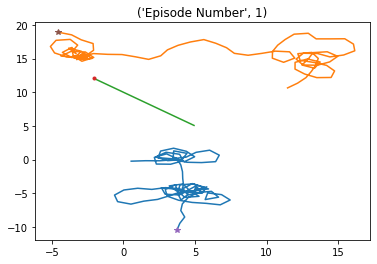

Episode * 2 * Avg Reward is ==> 2090.261781146505 : Ag1 Reward ==> 1236.7051584048108 : Ag2 Reward ==> 960.1018215802125 


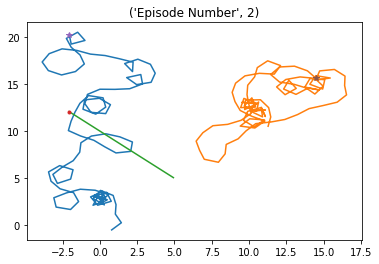

Episode * 3 * Avg Reward is ==> 2038.2964897000122 : Ag1 Reward ==> 1012.9811768677208 : Ag2 Reward ==> 921.3847299393063 


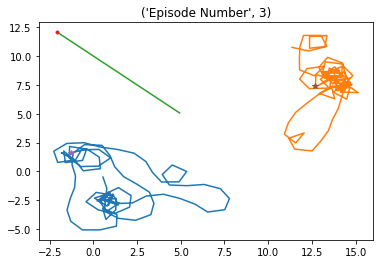

Episode * 4 * Avg Reward is ==> 2111.9291046416356 : Ag1 Reward ==> 1165.6596864508267 : Ag2 Reward ==> 1167.1672630156786 


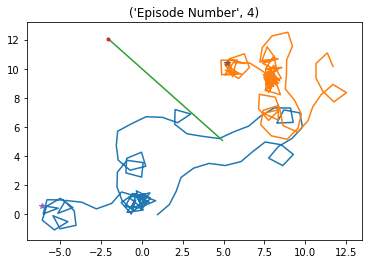

Episode * 5 * Avg Reward is ==> 2134.8560415355723 : Ag1 Reward ==> 1194.2375644645747 : Ag2 Reward ==> 1032.3262246467452 


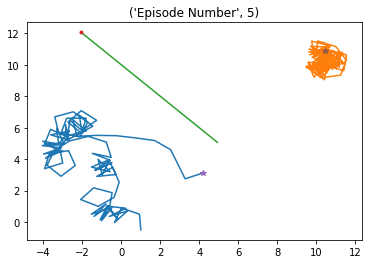

Episode * 6 * Avg Reward is ==> 2161.373724016862 : Ag1 Reward ==> 1286.3823993047658 : Ag2 Reward ==> 1007.579737118544 


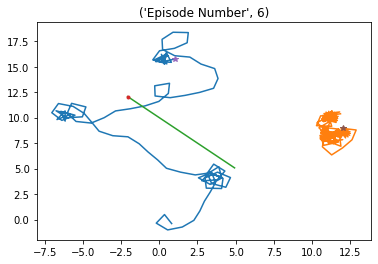

Episode * 7 * Avg Reward is ==> 2109.813866539938 : Ag1 Reward ==> 785.3431758458377 : Ag2 Reward ==> 1015.1115458325563 


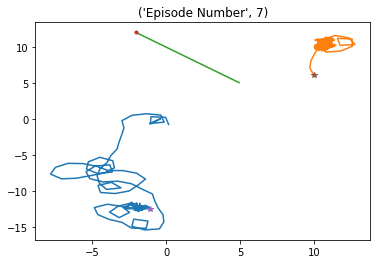

Episode * 8 * Avg Reward is ==> 2088.530912399837 : Ag1 Reward ==> 963.6862429207716 : Ag2 Reward ==> 975.8639904983559 


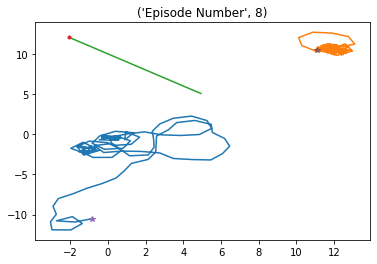

Episode * 9 * Avg Reward is ==> 2105.391941721732 : Ag1 Reward ==> 1259.5337091457052 : Ag2 Reward ==> 980.7464671511901 


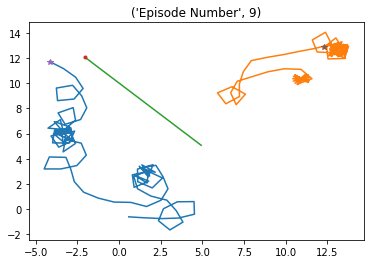

Episode * 10 * Avg Reward is ==> 2106.260455976581 : Ag1 Reward ==> 1129.405743491002 : Ag2 Reward ==> 984.6713407792154 


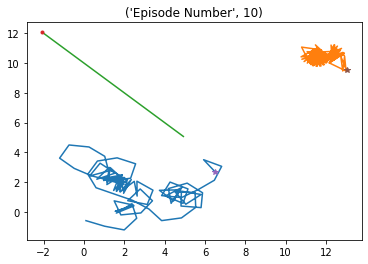

Episode * 11 * Avg Reward is ==> 2107.718204938829 : Ag1 Reward ==> 1124.4745457260233 : Ag2 Reward ==> 997.8211488352895 


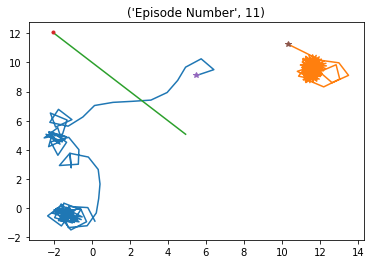

Episode * 12 * Avg Reward is ==> 2137.2872129962793 : Ag1 Reward ==> 1447.3115150335777 : Ag2 Reward ==> 1015.2347865946541 


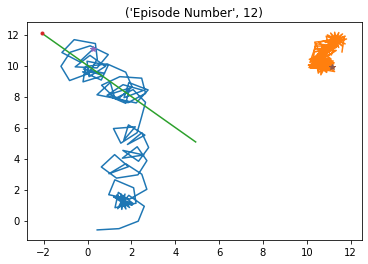

Episode * 13 * Avg Reward is ==> 2136.9143849945353 : Ag1 Reward ==> 1110.6606846618722 : Ag2 Reward ==> 1021.7797643117337 


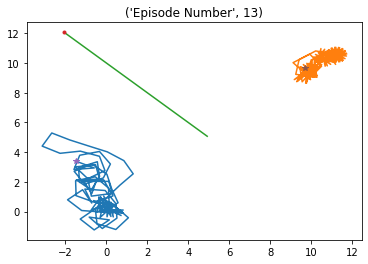

Episode * 14 * Avg Reward is ==> 2138.566765693647 : Ag1 Reward ==> 1164.2538224785865 : Ag2 Reward ==> 995.7938923035122 


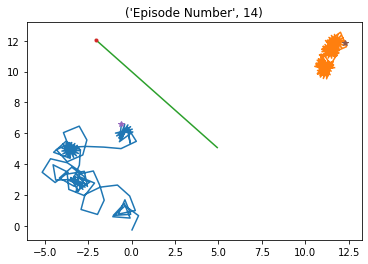

Episode * 15 * Avg Reward is ==> 2135.650932905423 : Ag1 Reward ==> 1041.4251506728901 : Ag2 Reward ==> 1053.4041231973897 


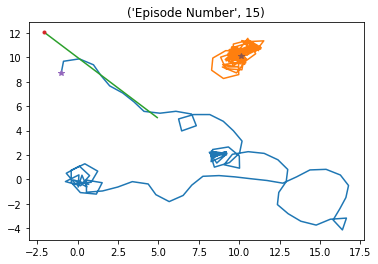

Episode * 16 * Avg Reward is ==> 2146.8383883162032 : Ag1 Reward ==> 1330.0812401107103 : Ag2 Reward ==> 984.5689793672033 


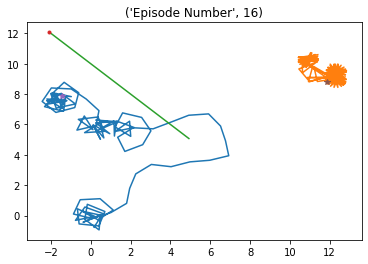

Episode * 17 * Avg Reward is ==> 2142.348268964101 : Ag1 Reward ==> 1053.6837737853466 : Ag2 Reward ==> 1016.8225855451223 


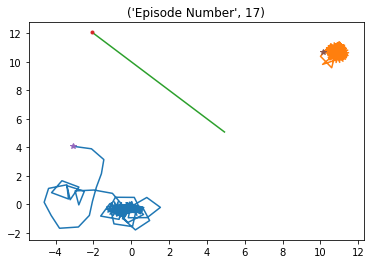

Episode * 18 * Avg Reward is ==> 2149.645168895007 : Ag1 Reward ==> 1259.7315918370266 : Ag2 Reward ==> 1013.9608758833833 


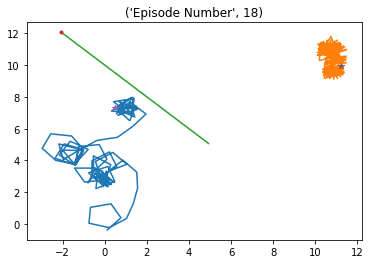

Episode * 19 * Avg Reward is ==> 2152.4499306630923 : Ag1 Reward ==> 1094.3790706740929 : Ag2 Reward ==> 1108.5565718145378 


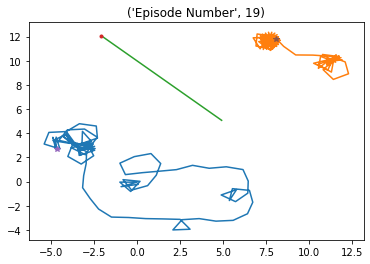

Episode * 20 * Avg Reward is ==> 2148.6148729661527 : Ag1 Reward ==> 1093.6527886586969 : Ag2 Reward ==> 982.0959880656019 


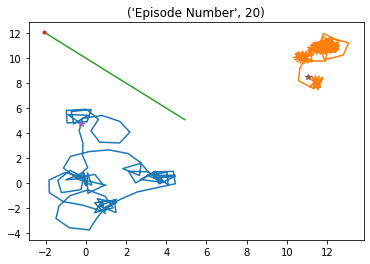

Episode * 21 * Avg Reward is ==> 2150.2920706157943 : Ag1 Reward ==> 1166.0061243314158 : Ag2 Reward ==> 1017.8298992772092 


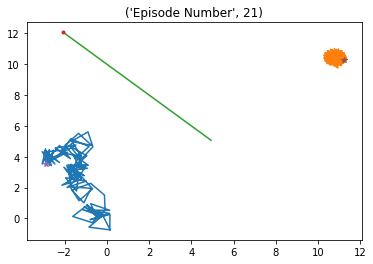

Episode * 22 * Avg Reward is ==> 2159.290740471543 : Ag1 Reward ==> 1321.6864855057172 : Ag2 Reward ==> 1026.5763219365535 


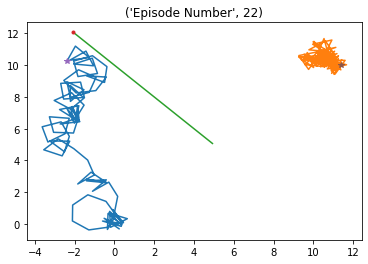

Episode * 23 * Avg Reward is ==> 2172.0856116568293 : Ag1 Reward ==> 1438.0916166314105 : Ag2 Reward ==> 1015.4811611017178 


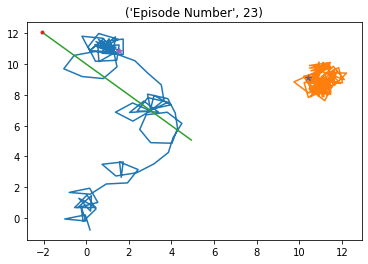

Episode * 24 * Avg Reward is ==> 2183.412949759778 : Ag1 Reward ==> 1409.5034968731768 : Ag2 Reward ==> 1034.4382292544105 


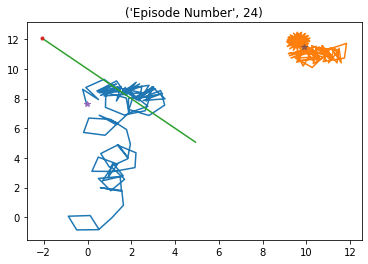

Episode * 25 * Avg Reward is ==> 2179.416213897605 : Ag1 Reward ==> 1059.0383581761635 : Ag2 Reward ==> 1024.4561950292925 


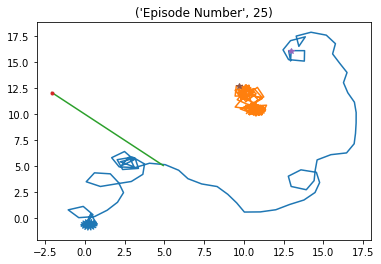

Episode * 26 * Avg Reward is ==> 2186.527383594591 : Ag1 Reward ==> 1362.938927388042 : Ag2 Reward ==> 1001.3676986312023 


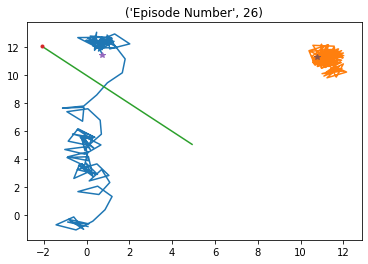

Episode * 27 * Avg Reward is ==> 2178.748757057336 : Ag1 Reward ==> 1025.0156462224588 : Ag2 Reward ==> 951.4888208662534 


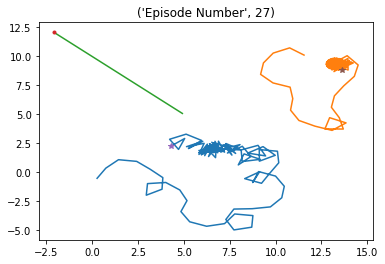

Episode * 28 * Avg Reward is ==> 2170.1530777436683 : Ag1 Reward ==> 1001.5667733312546 : Ag2 Reward ==> 936.5029629433769 


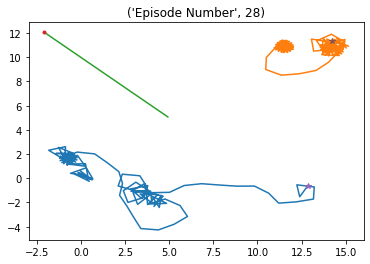

Episode * 29 * Avg Reward is ==> 2170.290719945562 : Ag1 Reward ==> 1084.2766561346632 : Ag2 Reward ==> 1089.8680454639311 


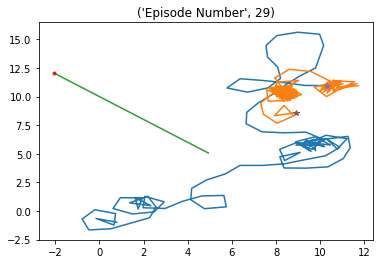

Episode * 30 * Avg Reward is ==> 2169.2158869967543 : Ag1 Reward ==> 982.7268638312821 : Ag2 Reward ==> 1155.3188676500333 


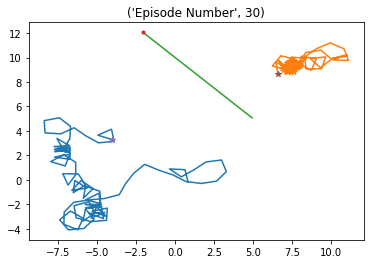

Episode * 31 * Avg Reward is ==> 2175.1484124540625 : Ag1 Reward ==> 1360.143102863556 : Ag2 Reward ==> 992.9810733097638 


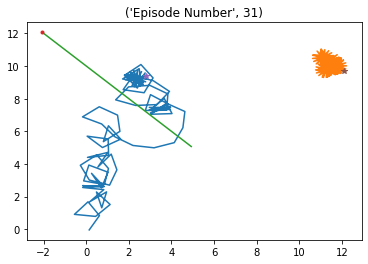

Episode * 32 * Avg Reward is ==> 2176.8024225478207 : Ag1 Reward ==> 1214.7275689270728 : Ag2 Reward ==> 1013.3491665272409 


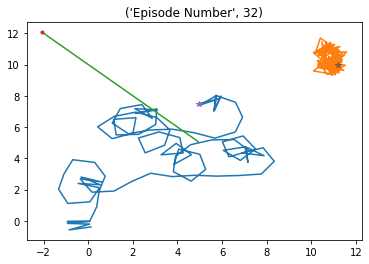

Episode * 33 * Avg Reward is ==> 2170.997618928735 : Ag1 Reward ==> 1023.4731801525744 : Ag2 Reward ==> 961.770722965428 


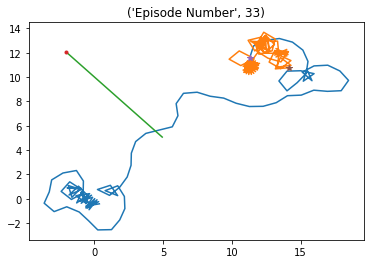

Episode * 34 * Avg Reward is ==> 2174.928807189133 : Ag1 Reward ==> 1257.141520048395 : Ag2 Reward ==> 1047.5164997338677 


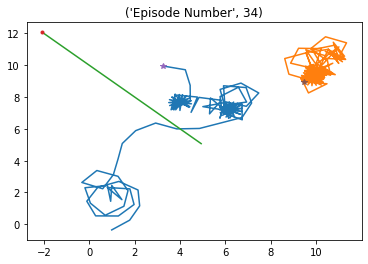

Episode * 35 * Avg Reward is ==> 2184.4040079750143 : Ag1 Reward ==> 1503.6451748801446 : Ag2 Reward ==> 1002.9156598148392 


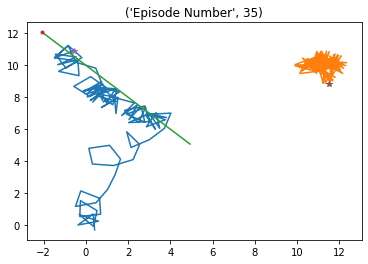

Episode * 36 * Avg Reward is ==> 2190.9592501488023 : Ag1 Reward ==> 1365.3722836586098 : Ag2 Reward ==> 1055.0204425727525 


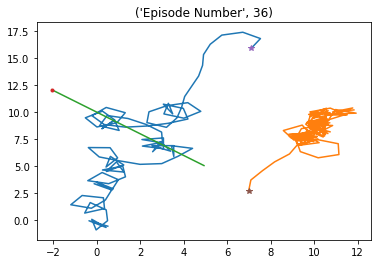

Episode * 37 * Avg Reward is ==> 2194.440364244049 : Ag1 Reward ==> 1408.4361426488435 : Ag2 Reward ==> 911.3243290240886 


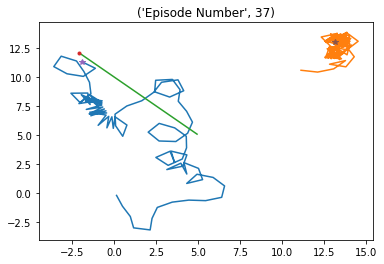

Episode * 38 * Avg Reward is ==> 2197.366608457367 : Ag1 Reward ==> 1291.143102307987 : Ag2 Reward ==> 1014.4945420421456 


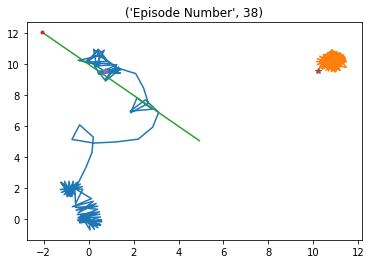

Episode * 39 * Avg Reward is ==> 2199.4336830671623 : Ag1 Reward ==> 1285.0448620337604 : Ag2 Reward ==> 992.9376562056353 


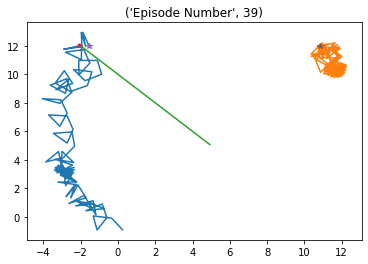

Episode * 40 * Avg Reward is ==> 2200.9534721845107 : Ag1 Reward ==> 1248.5102461163635 : Ag2 Reward ==> 1011.7150016447335 


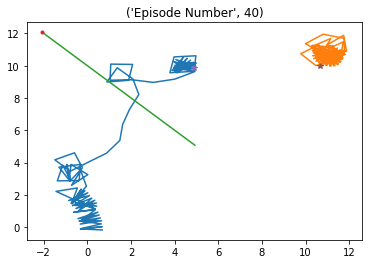

Episode * 41 * Avg Reward is ==> 2206.0730033833934 : Ag1 Reward ==> 1162.6143785025367 : Ag2 Reward ==> 1025.8834517607677 


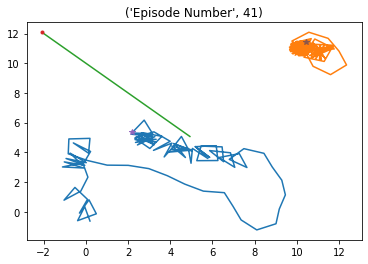

Episode * 42 * Avg Reward is ==> 2206.893094820445 : Ag1 Reward ==> 1209.9349072422922 : Ag2 Reward ==> 1019.6757302247946 


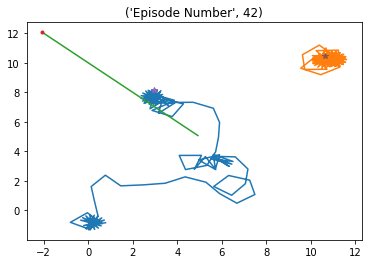

Episode * 43 * Avg Reward is ==> 2220.749514452646 : Ag1 Reward ==> 1235.0198072723633 : Ag2 Reward ==> 1253.6028848226902 


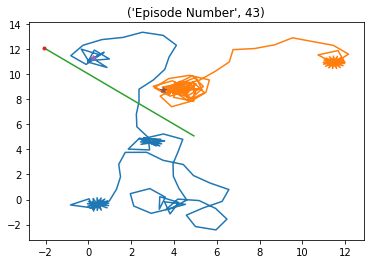

Episode * 44 * Avg Reward is ==> 2218.538913517737 : Ag1 Reward ==> 1226.1836966975618 : Ag2 Reward ==> 1018.2192153726038 


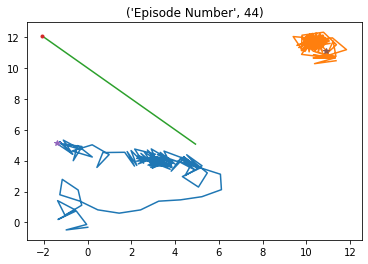

Episode * 45 * Avg Reward is ==> 2223.262036070483 : Ag1 Reward ==> 1418.8114796957675 : Ag2 Reward ==> 996.6772115253787 


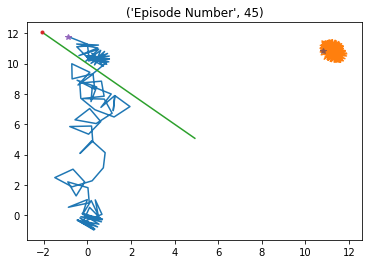

Episode * 46 * Avg Reward is ==> 2226.4873622839978 : Ag1 Reward ==> 1448.2185182124397 : Ag2 Reward ==> 974.7566667514775 


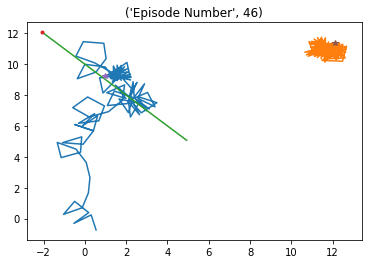

Episode * 47 * Avg Reward is ==> 2234.474497813599 : Ag1 Reward ==> 1114.5969219404726 : Ag2 Reward ==> 1005.3432209219508 


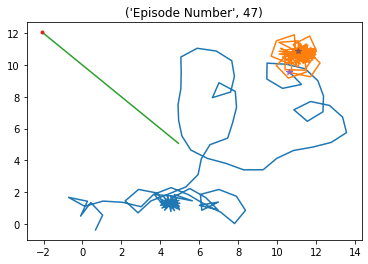

Episode * 48 * Avg Reward is ==> 2241.9343696996852 : Ag1 Reward ==> 1254.6869588386696 : Ag2 Reward ==> 983.2581500239202 


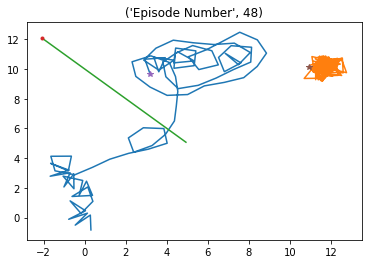

Episode * 49 * Avg Reward is ==> 2238.178766032258 : Ag1 Reward ==> 1106.595608637043 : Ag2 Reward ==> 983.4604209627677 


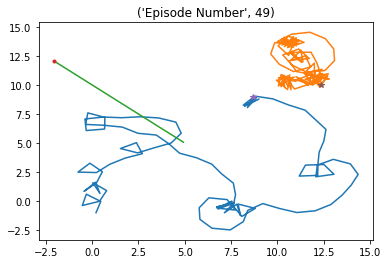

Episode * 50 * Avg Reward is ==> 2243.7746829139055 : Ag1 Reward ==> 1356.603548031356 : Ag2 Reward ==> 981.3102115047385 


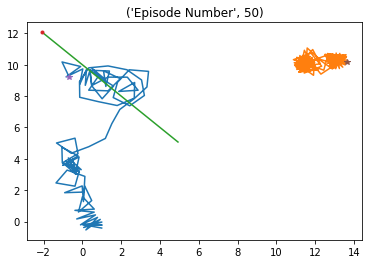

Episode * 51 * Avg Reward is ==> 2250.777149577751 : Ag1 Reward ==> 1404.990388470931 : Ag2 Reward ==> 997.4039726441976 


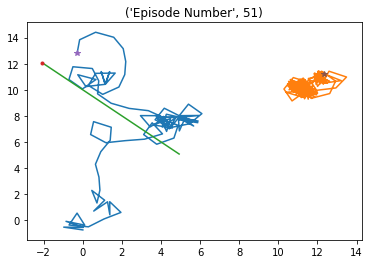

Episode * 52 * Avg Reward is ==> 2250.132254243786 : Ag1 Reward ==> 1421.526179309126 : Ag2 Reward ==> 1015.2243089605358 


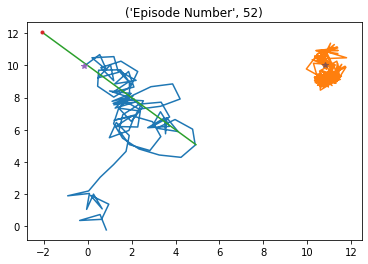

Episode * 53 * Avg Reward is ==> 2248.9439200080333 : Ag1 Reward ==> 1096.5386904729169 : Ag2 Reward ==> 988.3683890705807 


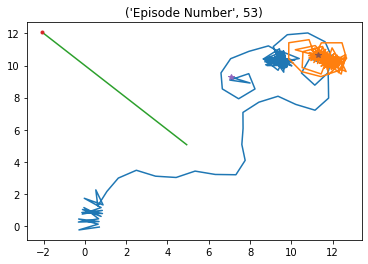

Episode * 54 * Avg Reward is ==> 2257.750509535911 : Ag1 Reward ==> 1502.9987641922496 : Ag2 Reward ==> 1009.3125317049476 


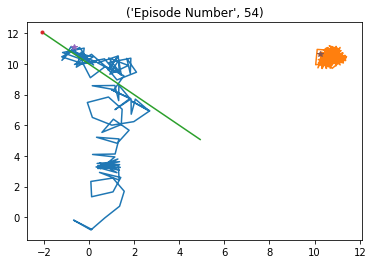

Episode * 55 * Avg Reward is ==> 2265.4351156644593 : Ag1 Reward ==> 1395.8891414456846 : Ag2 Reward ==> 1006.3243775665144 


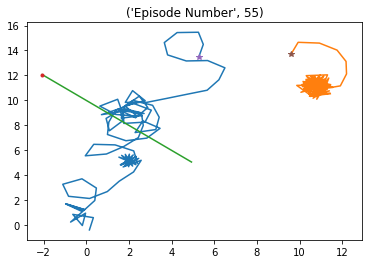

Episode * 56 * Avg Reward is ==> 2264.244037475285 : Ag1 Reward ==> 1223.4190608372182 : Ag2 Reward ==> 1043.5880310737134 


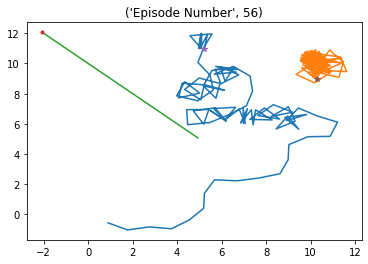

Episode * 57 * Avg Reward is ==> 2265.1403366839886 : Ag1 Reward ==> 1066.5669967206359 : Ag2 Reward ==> 1039.7913309579974 


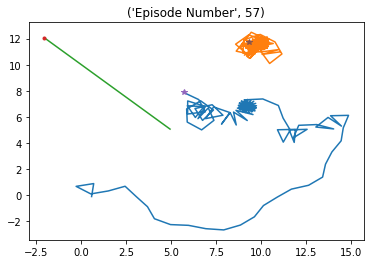

Episode * 58 * Avg Reward is ==> 2266.036154093061 : Ag1 Reward ==> 1329.9204110491976 : Ag2 Reward ==> 979.6047530341051 


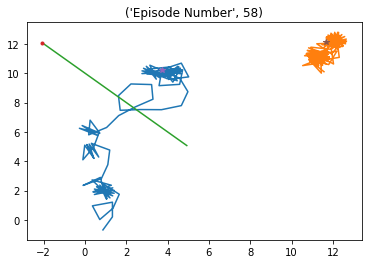

Episode * 59 * Avg Reward is ==> 2269.2962229062346 : Ag1 Reward ==> 1337.2035931610328 : Ag2 Reward ==> 996.1348018545316 


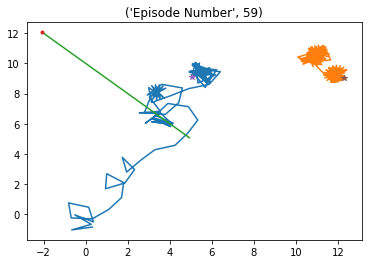

Episode * 60 * Avg Reward is ==> 2276.0263742347524 : Ag1 Reward ==> 1373.7065668677308 : Ag2 Reward ==> 971.2482629972855 


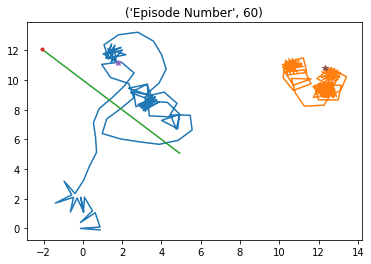

Episode * 61 * Avg Reward is ==> 2283.4694981817265 : Ag1 Reward ==> 1439.3954664618852 : Ag2 Reward ==> 1042.1655150256977 


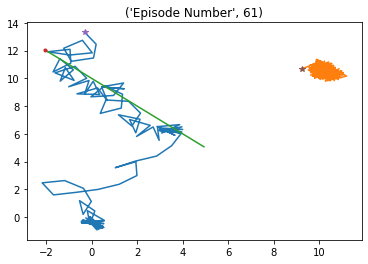

Episode * 62 * Avg Reward is ==> 2286.391154830697 : Ag1 Reward ==> 1453.3297450460134 : Ag2 Reward ==> 1011.7993283550846 


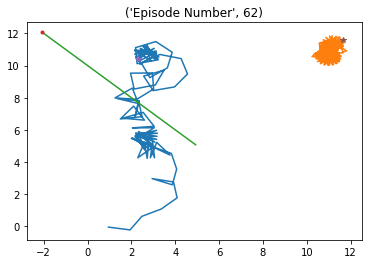

Episode * 63 * Avg Reward is ==> 2276.4145937756593 : Ag1 Reward ==> 1067.4707552221175 : Ag2 Reward ==> 987.0395803095105 


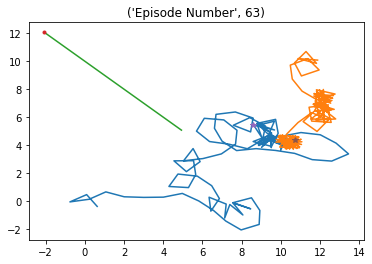

Episode * 64 * Avg Reward is ==> 2271.7166493577715 : Ag1 Reward ==> 1187.748276250669 : Ag2 Reward ==> 1068.275673161405 


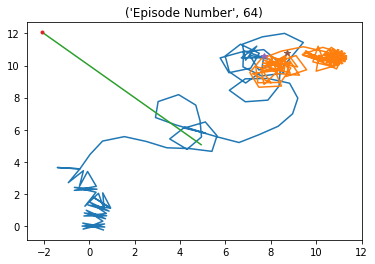

Episode * 65 * Avg Reward is ==> 2281.6039738571912 : Ag1 Reward ==> 1508.4072419380084 : Ag2 Reward ==> 970.5802912442274 


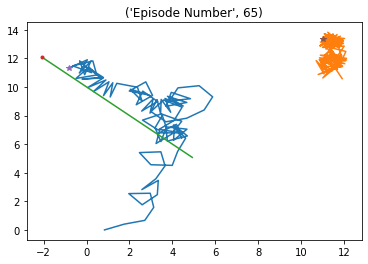

Episode * 66 * Avg Reward is ==> 2280.3855776602722 : Ag1 Reward ==> 1320.7406340795246 : Ag2 Reward ==> 994.8301440629737 


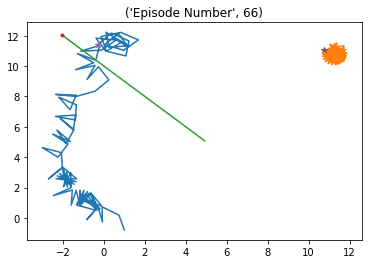

Episode * 67 * Avg Reward is ==> 2280.580424448749 : Ag1 Reward ==> 986.057524647614 : Ag2 Reward ==> 998.2408139801646 


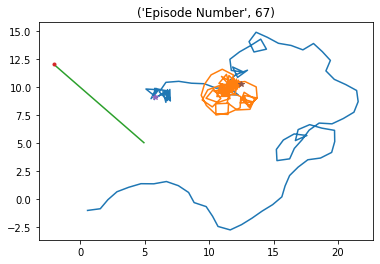

Episode * 68 * Avg Reward is ==> 2292.175399178262 : Ag1 Reward ==> 1406.3856985211369 : Ag2 Reward ==> 995.483026934021 


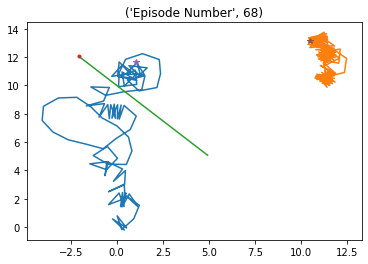

Episode * 69 * Avg Reward is ==> 2296.2034856012365 : Ag1 Reward ==> 1369.2381739643527 : Ag2 Reward ==> 966.0299845532032 


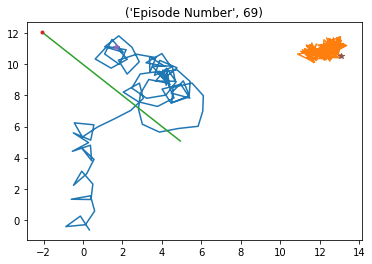

Episode * 70 * Avg Reward is ==> 2303.3893254429227 : Ag1 Reward ==> 1422.2261337167624 : Ag2 Reward ==> 1003.2531914320086 


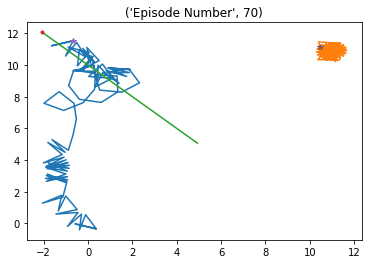

Episode * 71 * Avg Reward is ==> 2305.1960341748127 : Ag1 Reward ==> 1413.9810170050519 : Ag2 Reward ==> 1011.4115084438647 


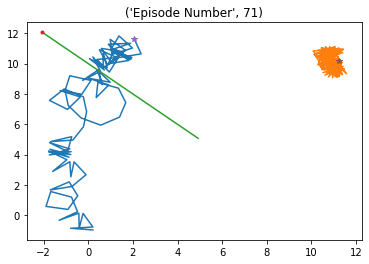

Episode * 72 * Avg Reward is ==> 2305.9775965066924 : Ag1 Reward ==> 1260.3218459809646 : Ag2 Reward ==> 999.0173827485339 


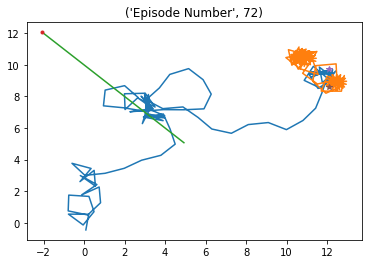

Episode * 73 * Avg Reward is ==> 2315.847916369189 : Ag1 Reward ==> 1349.6697344488339 : Ag2 Reward ==> 1030.3869631690363 


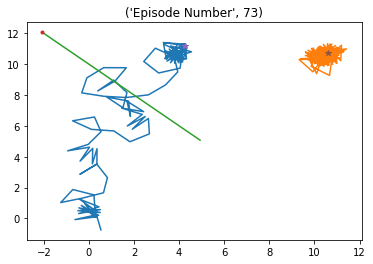

Episode * 74 * Avg Reward is ==> 2311.968117500106 : Ag1 Reward ==> 1207.7650098057738 : Ag2 Reward ==> 941.7010552131724 


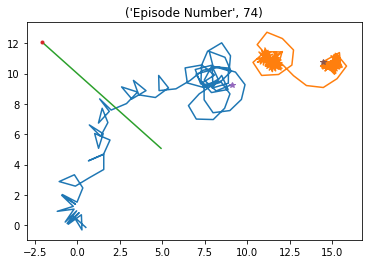

Episode * 75 * Avg Reward is ==> 2311.9102872731833 : Ag1 Reward ==> 1499.1426442847087 : Ag2 Reward ==> 1005.1049813333758 


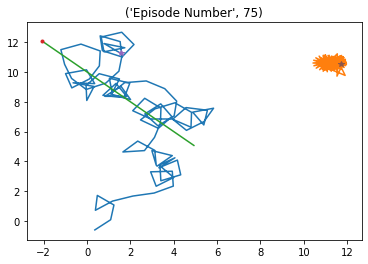

Episode * 76 * Avg Reward is ==> 2307.7510546288077 : Ag1 Reward ==> 1245.749719665567 : Ag2 Reward ==> 1008.2737007907506 


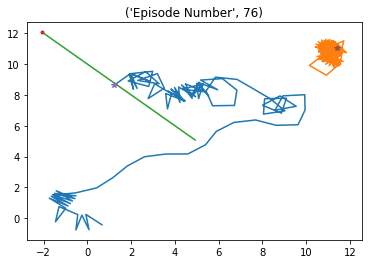

Episode * 77 * Avg Reward is ==> 2307.6329708225544 : Ag1 Reward ==> 1314.856322936214 : Ag2 Reward ==> 1000.1807964866057 


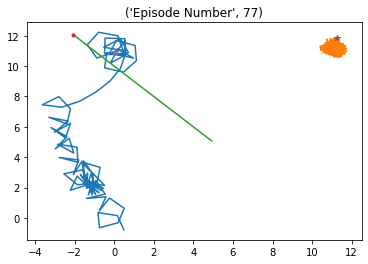

Episode * 78 * Avg Reward is ==> 2307.14110786927 : Ag1 Reward ==> 1295.9187435580009 : Ag2 Reward ==> 990.0443826607429 


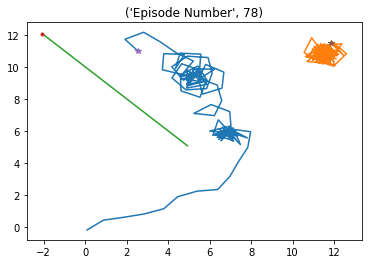

Episode * 79 * Avg Reward is ==> 2312.3813974933787 : Ag1 Reward ==> 1491.2706419350693 : Ag2 Reward ==> 996.323461268681 


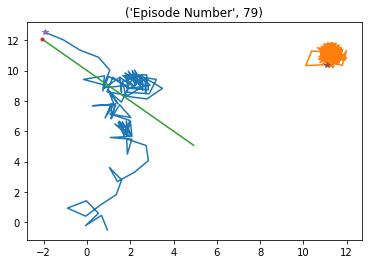

Episode * 80 * Avg Reward is ==> 2302.026220744933 : Ag1 Reward ==> 932.8023851952386 : Ag2 Reward ==> 913.2157926280336 


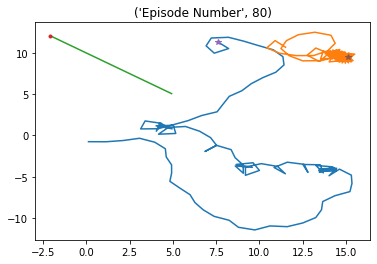

Episode * 81 * Avg Reward is ==> 2304.4020897531836 : Ag1 Reward ==> 1302.9854269988314 : Ag2 Reward ==> 980.5471635945067 


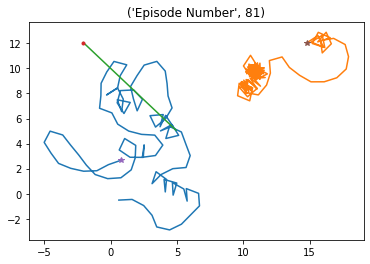

Episode * 82 * Avg Reward is ==> 2294.553343146342 : Ag1 Reward ==> 884.4651385175164 : Ag2 Reward ==> 951.1956346758825 


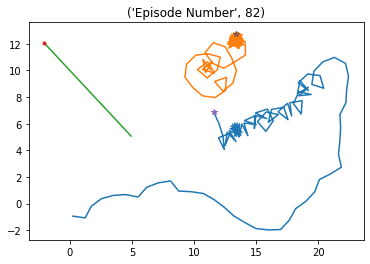

Episode * 83 * Avg Reward is ==> 2292.8743041329667 : Ag1 Reward ==> 1455.4477873038347 : Ag2 Reward ==> 966.0133442562094 


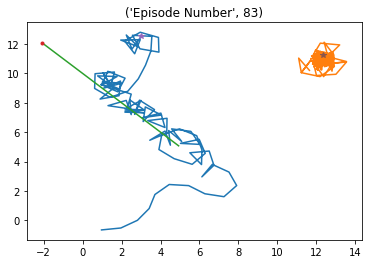

Episode * 84 * Avg Reward is ==> 2295.4496176072525 : Ag1 Reward ==> 1322.8224252277525 : Ag2 Reward ==> 1024.5930258138483 


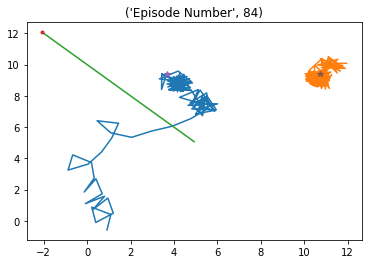

Episode * 85 * Avg Reward is ==> 2290.940131191851 : Ag1 Reward ==> 1187.4054582645997 : Ag2 Reward ==> 1047.7037763404874 


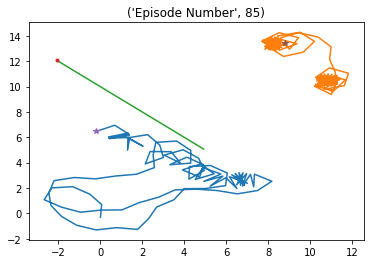

Episode * 86 * Avg Reward is ==> 2282.6659265002077 : Ag1 Reward ==> 1106.9231306439433 : Ag2 Reward ==> 985.083866654228 


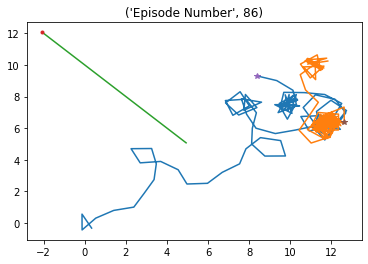

Episode * 87 * Avg Reward is ==> 2287.9341364075563 : Ag1 Reward ==> 1408.5652491830979 : Ag2 Reward ==> 922.1032899732628 


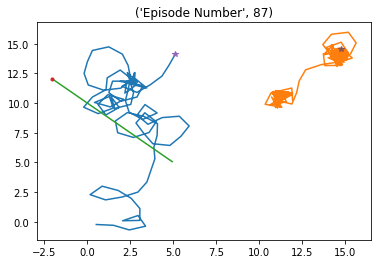

Episode * 88 * Avg Reward is ==> 2285.0919603542816 : Ag1 Reward ==> 1115.9449595315698 : Ag2 Reward ==> 1008.3131072000622 


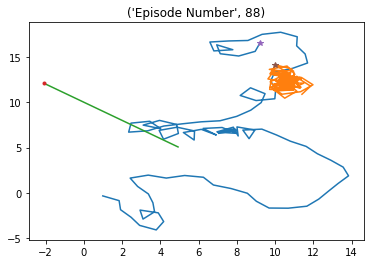

Episode * 89 * Avg Reward is ==> 2292.9042088770557 : Ag1 Reward ==> 1425.4875146722648 : Ag2 Reward ==> 977.058455838479 


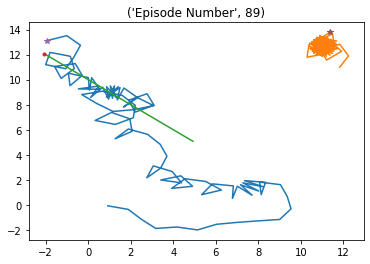

Episode * 90 * Avg Reward is ==> 2292.3864577448844 : Ag1 Reward ==> 1328.4144790961834 : Ag2 Reward ==> 988.789235153083 


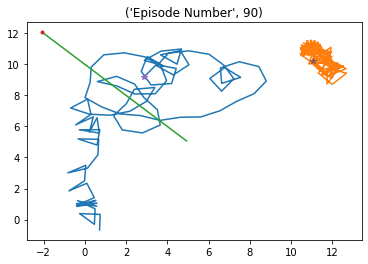

Episode * 91 * Avg Reward is ==> 2292.816208078913 : Ag1 Reward ==> 1416.2521578122244 : Ag2 Reward ==> 1003.3322166640437 


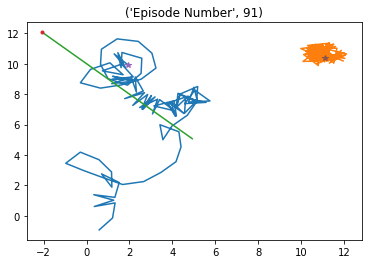

Episode * 92 * Avg Reward is ==> 2287.670452441259 : Ag1 Reward ==> 1255.423651446312 : Ag2 Reward ==> 975.4966113172103 


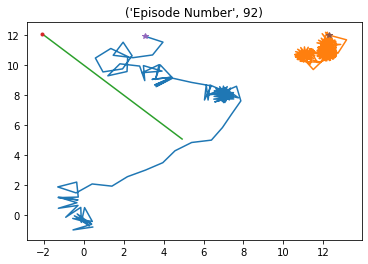

Episode * 93 * Avg Reward is ==> 2296.024716038475 : Ag1 Reward ==> 1427.7862870669032 : Ag2 Reward ==> 991.2913363652377 


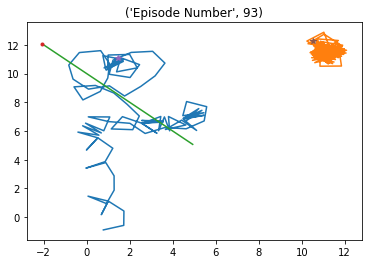

Episode * 94 * Avg Reward is ==> 2288.717656449492 : Ag1 Reward ==> 1196.508598646331 : Ag2 Reward ==> 1023.5203136915238 


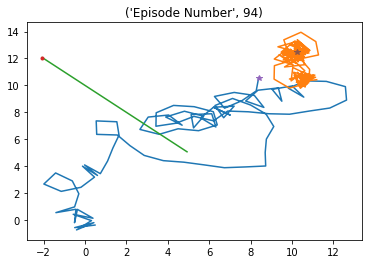

Episode * 95 * Avg Reward is ==> 2287.5969279367123 : Ag1 Reward ==> 1360.9119067508063 : Ag2 Reward ==> 996.4724717502124 


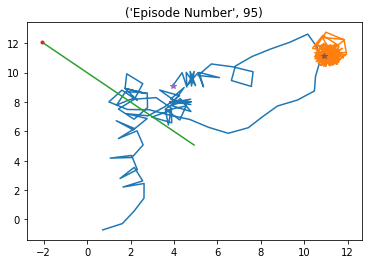

Episode * 96 * Avg Reward is ==> 2292.3019652636076 : Ag1 Reward ==> 1453.2928740153325 : Ag2 Reward ==> 1001.9157109714101 


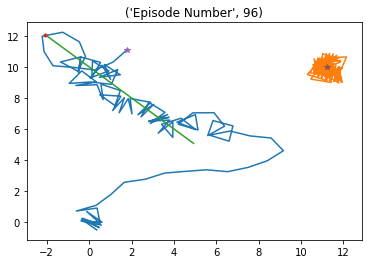

Episode * 97 * Avg Reward is ==> 2301.162620785305 : Ag1 Reward ==> 1471.2807639283583 : Ag2 Reward ==> 989.5037846181593 


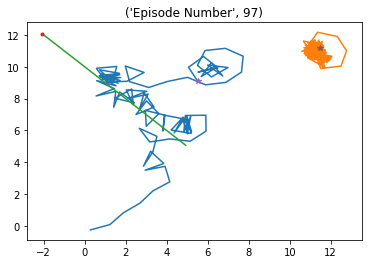

Episode * 98 * Avg Reward is ==> 2301.170488753585 : Ag1 Reward ==> 1306.4277096782582 : Ag2 Reward ==> 1003.4121731362491 


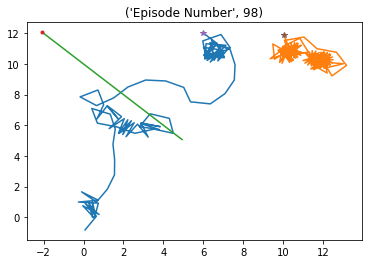

Episode * 99 * Avg Reward is ==> 2302.6763280373207 : Ag1 Reward ==> 1429.632686964961 : Ag2 Reward ==> 963.9392794000387 


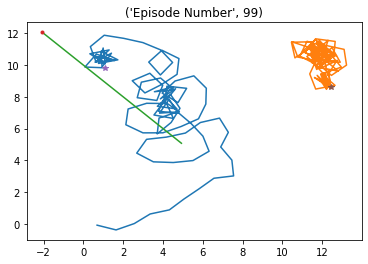

Episode * 100 * Avg Reward is ==> 2301.600529608713 : Ag1 Reward ==> 1290.178692520793 : Ag2 Reward ==> 1011.7442001999032 


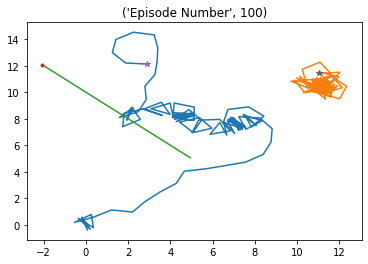

Episode * 101 * Avg Reward is ==> 2291.474836225686 : Ag1 Reward ==> 1159.4629491930166 : Ag2 Reward ==> 917.0702969735045 


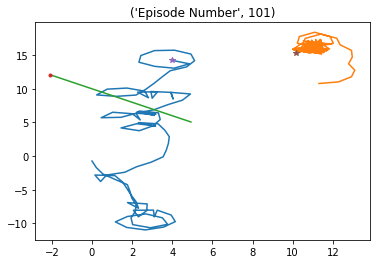

Episode * 102 * Avg Reward is ==> 2289.2776665149877 : Ag1 Reward ==> 1376.313867510387 : Ag2 Reward ==> 1000.9284174627794 


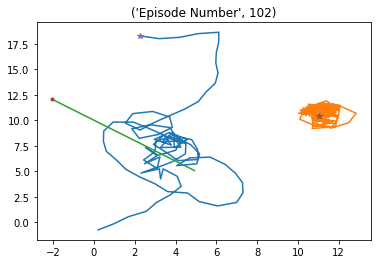

Episode * 103 * Avg Reward is ==> 2293.503281473784 : Ag1 Reward ==> 1195.542159934021 : Ag2 Reward ==> 1027.9927739494622 


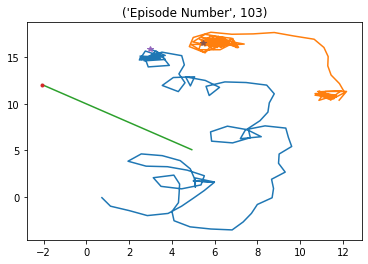

Episode * 104 * Avg Reward is ==> 2298.5325160325897 : Ag1 Reward ==> 1472.6805558022909 : Ag2 Reward ==> 984.5127759620083 


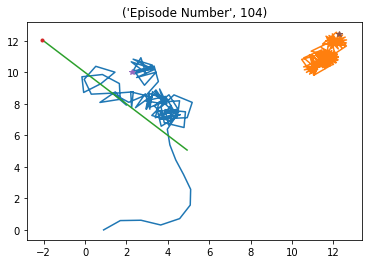

Episode * 105 * Avg Reward is ==> 2299.6052776617053 : Ag1 Reward ==> 1523.8257886415054 : Ag2 Reward ==> 998.0722097053438 


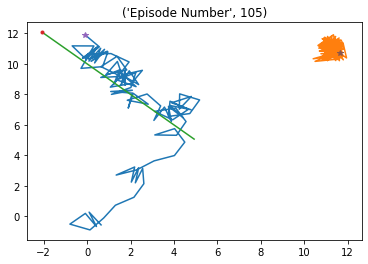

Episode * 106 * Avg Reward is ==> 2300.96125511998 : Ag1 Reward ==> 1353.1595053440717 : Ag2 Reward ==> 1016.6503711294164 


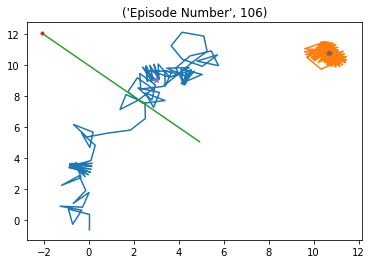

Episode * 107 * Avg Reward is ==> 2309.4038418173623 : Ag1 Reward ==> 1326.8343947612466 : Ag2 Reward ==> 995.1674117618226 


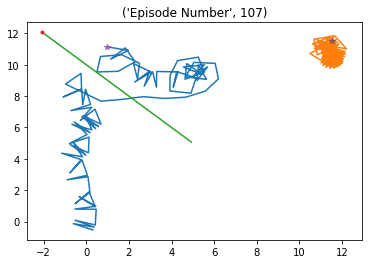

Episode * 108 * Avg Reward is ==> 2311.454003686002 : Ag1 Reward ==> 1456.8962948218082 : Ag2 Reward ==> 1026.9789053789443 


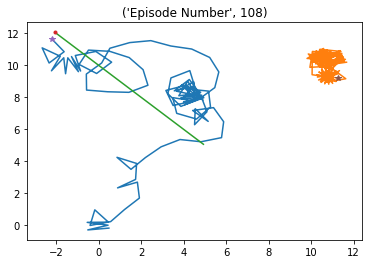

Episode * 109 * Avg Reward is ==> 2313.1426211314 : Ag1 Reward ==> 1395.7881802373254 : Ag2 Reward ==> 1007.0246760961521 


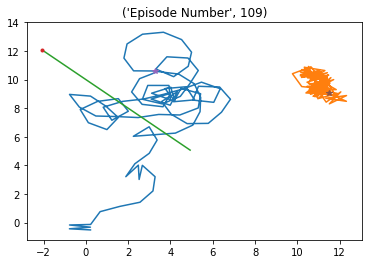

Episode * 110 * Avg Reward is ==> 2308.4697851895726 : Ag1 Reward ==> 1232.8605745948462 : Ag2 Reward ==> 1005.7053128808207 


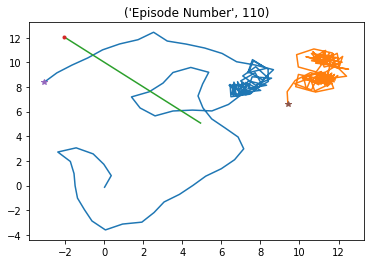

Episode * 111 * Avg Reward is ==> 2298.9457855221563 : Ag1 Reward ==> 1110.9670467652206 : Ag2 Reward ==> 933.4654919870474 


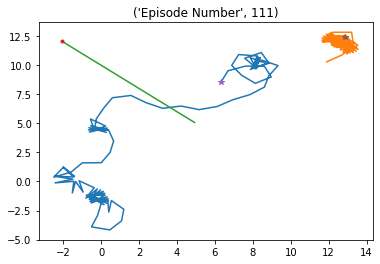

Episode * 112 * Avg Reward is ==> 2301.1873551126323 : Ag1 Reward ==> 1388.564946131356 : Ag2 Reward ==> 960.4370662171901 


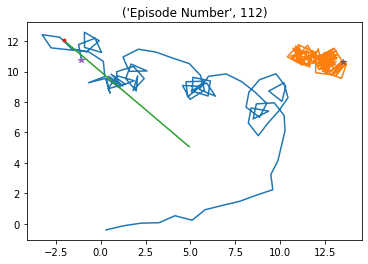

Episode * 113 * Avg Reward is ==> 2300.0715885828167 : Ag1 Reward ==> 1349.0808051670058 : Ag2 Reward ==> 986.345231258235 


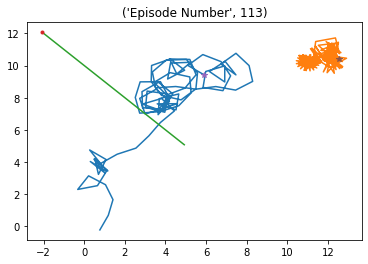

Episode * 114 * Avg Reward is ==> 2309.153257038293 : Ag1 Reward ==> 1518.6361551323744 : Ag2 Reward ==> 994.0966481056098 


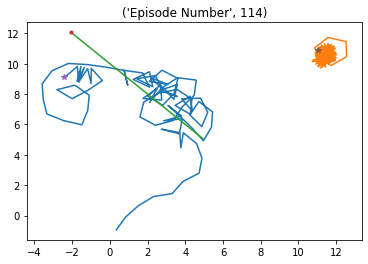

Episode * 115 * Avg Reward is ==> 2308.4677234030532 : Ag1 Reward ==> 1462.2475332616807 : Ag2 Reward ==> 1014.5787469468154 


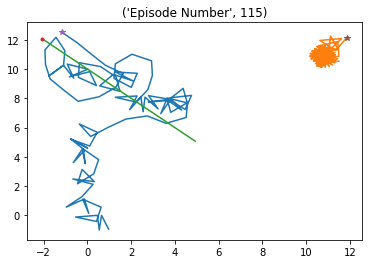

Episode * 116 * Avg Reward is ==> 2312.8467952226497 : Ag1 Reward ==> 1392.0663321063978 : Ag2 Reward ==> 1037.1199611337768 


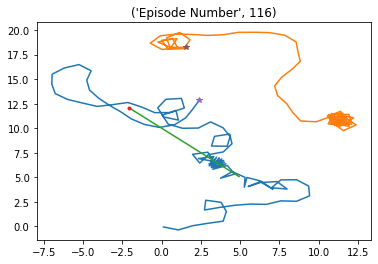

Episode * 117 * Avg Reward is ==> 2316.1856747986276 : Ag1 Reward ==> 1399.3649300500767 : Ag2 Reward ==> 1049.2273724118668 


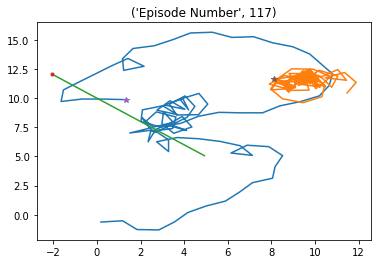

Episode * 118 * Avg Reward is ==> 2324.2153084714582 : Ag1 Reward ==> 1590.8572218568236 : Ag2 Reward ==> 1016.2912512751404 


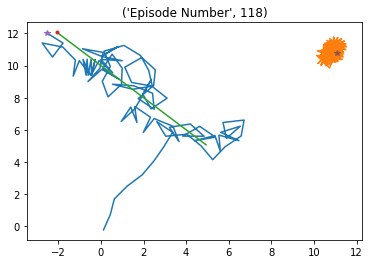

Episode * 119 * Avg Reward is ==> 2316.9317792890783 : Ag1 Reward ==> 1174.999055119838 : Ag2 Reward ==> 1021.2538807887214 


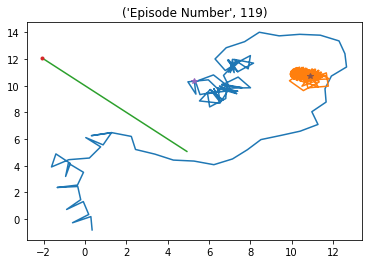

Episode * 120 * Avg Reward is ==> 2323.713222027135 : Ag1 Reward ==> 1137.9932419524375 : Ag2 Reward ==> 979.2826453931018 


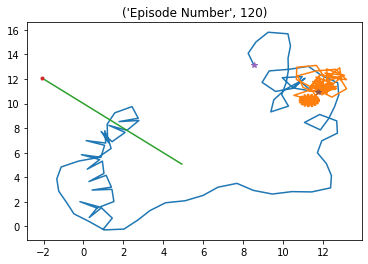

Episode * 121 * Avg Reward is ==> 2326.718132604 : Ag1 Reward ==> 1351.7457561196359 : Ag2 Reward ==> 1051.9832575483042 


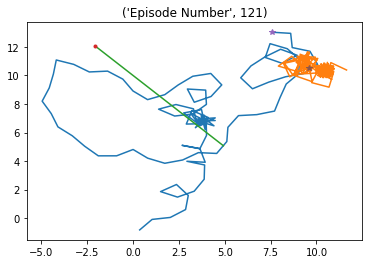

Episode * 122 * Avg Reward is ==> 2337.685498659236 : Ag1 Reward ==> 1262.723674301949 : Ag2 Reward ==> 1011.6317411008832 


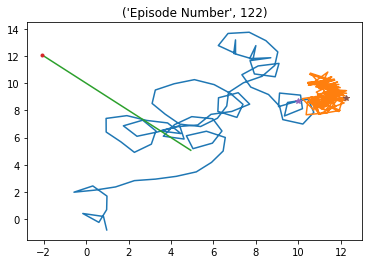

Episode * 123 * Avg Reward is ==> 2336.0862845868965 : Ag1 Reward ==> 1318.3274952438856 : Ag2 Reward ==> 1039.1650734225716 


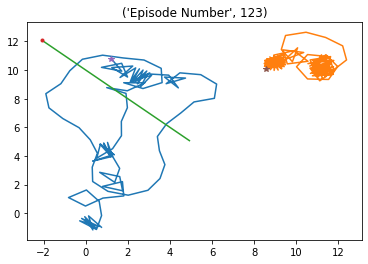

Episode * 124 * Avg Reward is ==> 2330.6662020813997 : Ag1 Reward ==> 1123.573276814691 : Ag2 Reward ==> 1007.0388740070429 


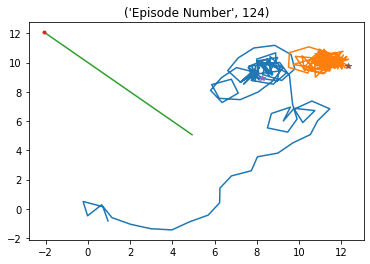

Episode * 125 * Avg Reward is ==> 2334.4607891803366 : Ag1 Reward ==> 1388.7767439718994 : Ag2 Reward ==> 998.1159745906842 


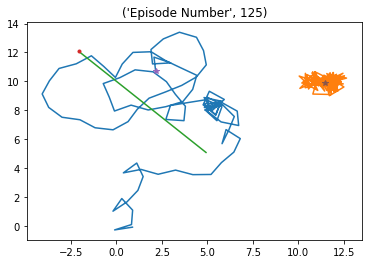

Episode * 126 * Avg Reward is ==> 2342.0376065749633 : Ag1 Reward ==> 1384.120309360089 : Ag2 Reward ==> 1010.9593837231183 


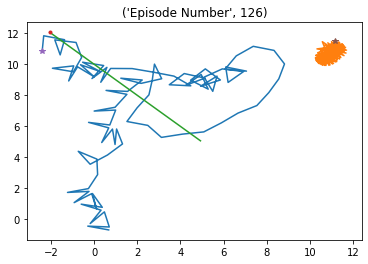

Episode * 127 * Avg Reward is ==> 2345.419810915523 : Ag1 Reward ==> 1451.8584751468366 : Ag2 Reward ==> 1014.0982376319394 


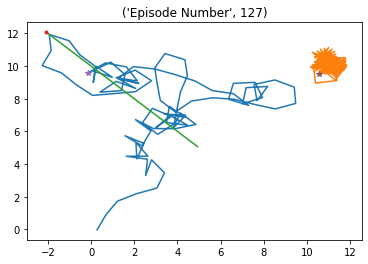

Episode * 128 * Avg Reward is ==> 2346.77593191818 : Ag1 Reward ==> 1210.4386087750227 : Ag2 Reward ==> 968.064298062874 


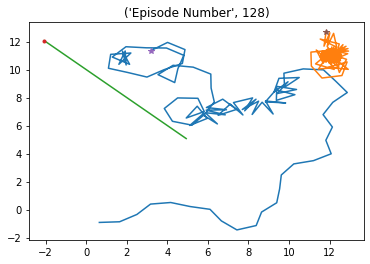

Episode * 129 * Avg Reward is ==> 2345.146250455606 : Ag1 Reward ==> 1384.9319265682484 : Ag2 Reward ==> 952.4267854395508 


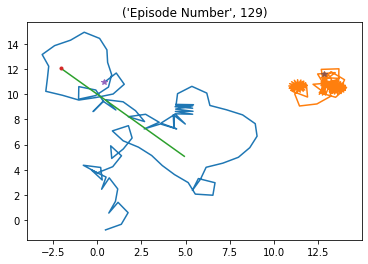

Episode * 130 * Avg Reward is ==> 2348.6213333900296 : Ag1 Reward ==> 1469.3524091923146 : Ag2 Reward ==> 986.854622433878 


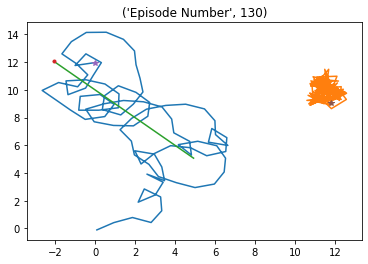

Episode * 131 * Avg Reward is ==> 2345.590999663526 : Ag1 Reward ==> 1303.2278590397311 : Ag2 Reward ==> 995.1431663763851 


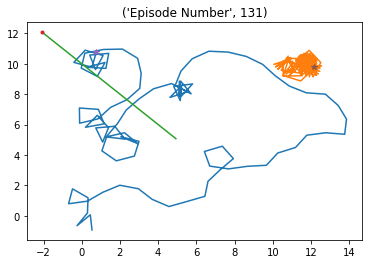

Episode * 132 * Avg Reward is ==> 2349.0748600890793 : Ag1 Reward ==> 1347.4274812420517 : Ag2 Reward ==> 1022.847198543621 


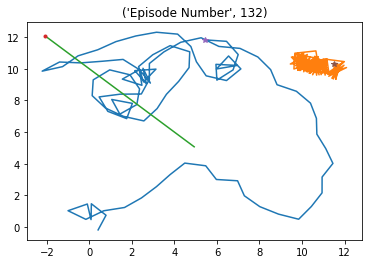

Episode * 133 * Avg Reward is ==> 2342.1546444477394 : Ag1 Reward ==> 1059.9747195024897 : Ag2 Reward ==> 1082.2942782760426 


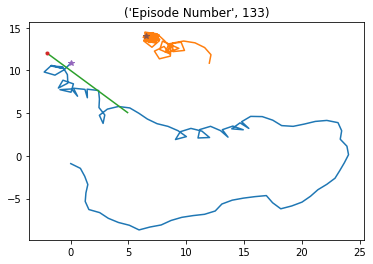

Episode * 134 * Avg Reward is ==> 2347.722539995063 : Ag1 Reward ==> 1395.0769697064597 : Ag2 Reward ==> 1047.6677645243635 


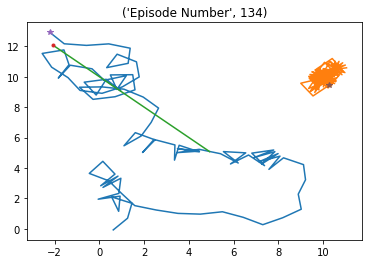

Episode * 135 * Avg Reward is ==> 2342.8848211060326 : Ag1 Reward ==> 1194.583771142893 : Ag2 Reward ==> 969.2918517968908 


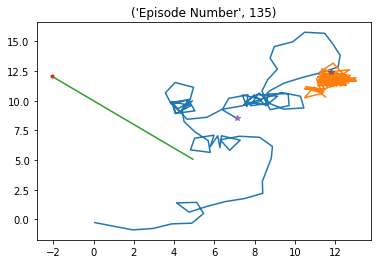

Episode * 136 * Avg Reward is ==> 2333.798553971876 : Ag1 Reward ==> 1147.6941205360865 : Ag2 Reward ==> 944.0637790844013 


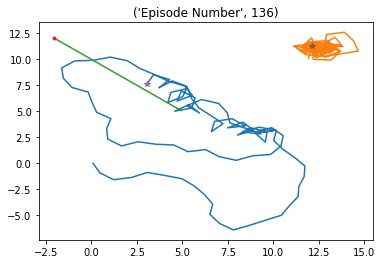

Episode * 137 * Avg Reward is ==> 2326.849288724409 : Ag1 Reward ==> 1146.4758690030035 : Ag2 Reward ==> 1036.3380696448048 


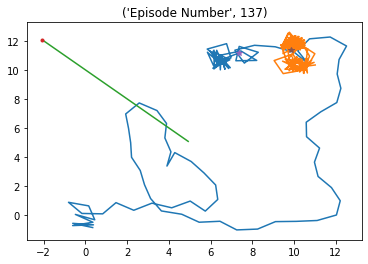

Episode * 138 * Avg Reward is ==> 2325.6416252174067 : Ag1 Reward ==> 1283.8160374212325 : Ag2 Reward ==> 977.7173051132199 


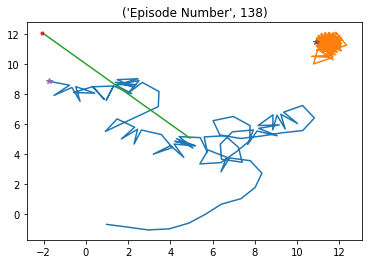

Episode * 139 * Avg Reward is ==> 2329.1237476137812 : Ag1 Reward ==> 1516.293136444965 : Ag2 Reward ==> 1016.5637257750054 


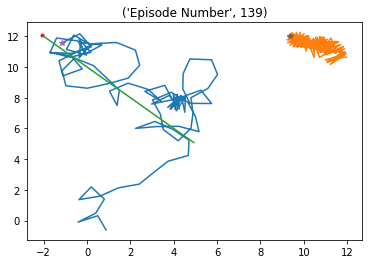

Episode * 140 * Avg Reward is ==> 2324.8750316368396 : Ag1 Reward ==> 1171.3839478575626 : Ag2 Reward ==> 960.5903057854696 


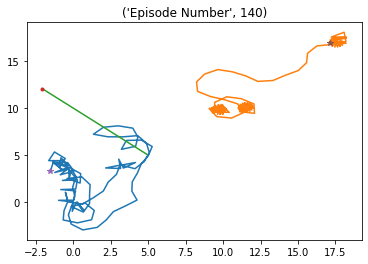

Episode * 141 * Avg Reward is ==> 2334.388634642901 : Ag1 Reward ==> 1406.161854296183 : Ag2 Reward ==> 1050.9155121127787 


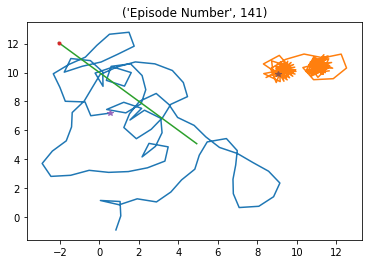

Episode * 142 * Avg Reward is ==> 2339.196077246833 : Ag1 Reward ==> 1563.1097152655339 : Ag2 Reward ==> 1006.4302738649285 


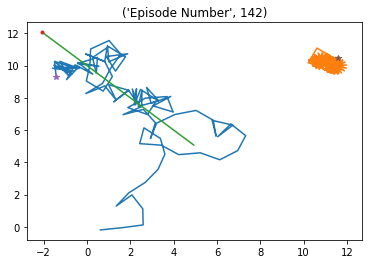

Episode * 143 * Avg Reward is ==> 2345.955421723875 : Ag1 Reward ==> 1461.859669711539 : Ag2 Reward ==> 1032.0490432536244 


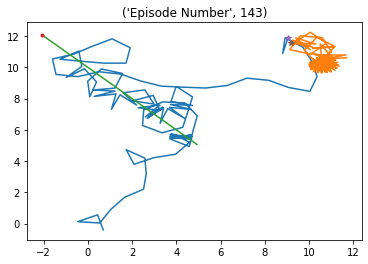

Episode * 144 * Avg Reward is ==> 2348.0616356702194 : Ag1 Reward ==> 1522.956100902768 : Ag2 Reward ==> 1018.4857887152991 


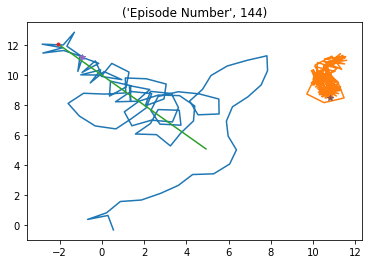

Episode * 145 * Avg Reward is ==> 2345.5833076146314 : Ag1 Reward ==> 1420.2426122247512 : Ag2 Reward ==> 1002.5222638985845 


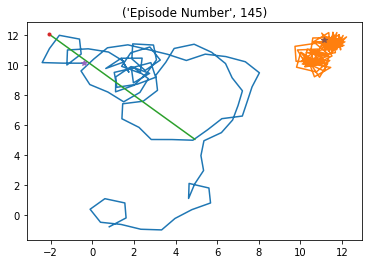

Episode * 146 * Avg Reward is ==> 2347.390726336939 : Ag1 Reward ==> 1445.7955418354231 : Ag2 Reward ==> 996.3110835303663 


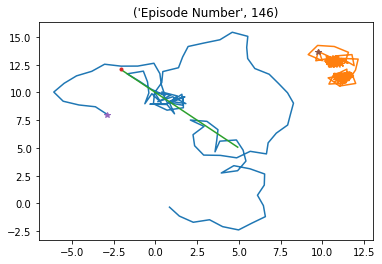

Episode * 147 * Avg Reward is ==> 2349.413644404821 : Ag1 Reward ==> 1366.1784647648028 : Ag2 Reward ==> 1036.740064473532 


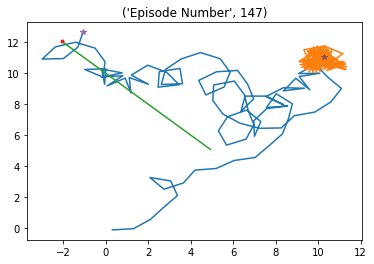

Episode * 148 * Avg Reward is ==> 2343.418459250478 : Ag1 Reward ==> 1263.431048680704 : Ag2 Reward ==> 980.636745346351 


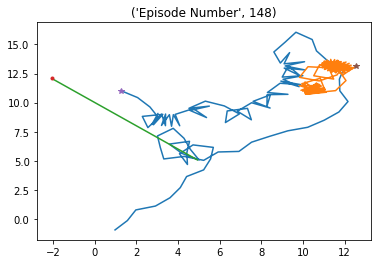

Episode * 149 * Avg Reward is ==> 2347.8530597639497 : Ag1 Reward ==> 1578.4769640261754 : Ag2 Reward ==> 1001.7199128461391 


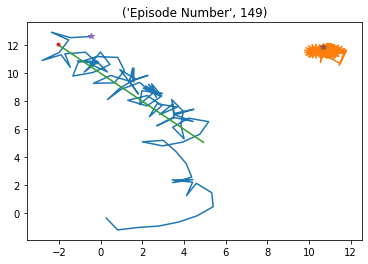

Episode * 150 * Avg Reward is ==> 2354.899343300765 : Ag1 Reward ==> 1504.3228913011617 : Ag2 Reward ==> 1016.0943376471313 


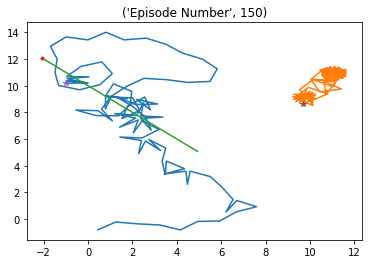

Episode * 151 * Avg Reward is ==> 2368.496387016539 : Ag1 Reward ==> 1562.214102304419 : Ag2 Reward ==> 1026.10018507881 


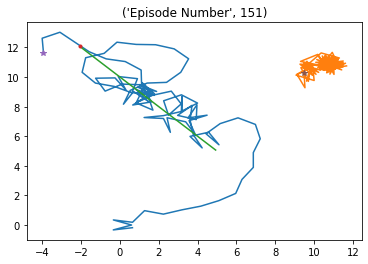

Episode * 152 * Avg Reward is ==> 2367.9878692002085 : Ag1 Reward ==> 1288.8617288955372 : Ag2 Reward ==> 1039.79957079981 


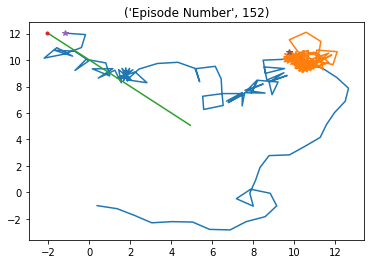

Episode * 153 * Avg Reward is ==> 2370.204201161455 : Ag1 Reward ==> 1428.3320570014464 : Ag2 Reward ==> 995.7472578736347 


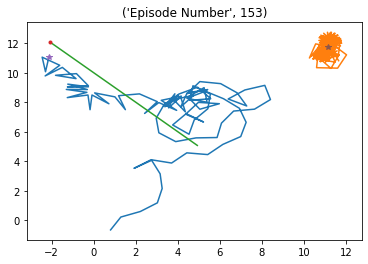

Episode * 154 * Avg Reward is ==> 2364.8395436544 : Ag1 Reward ==> 1385.5341569624013 : Ag2 Reward ==> 912.6123459933933 


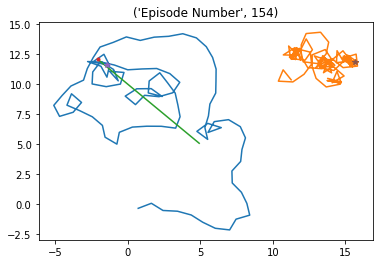

Episode * 155 * Avg Reward is ==> 2364.3319152857057 : Ag1 Reward ==> 1432.3999811478561 : Ag2 Reward ==> 1024.1211643128636 


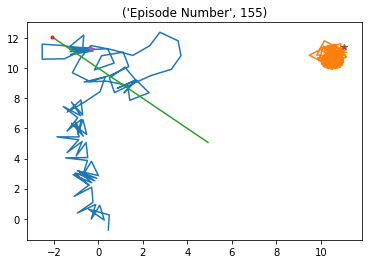

Episode * 156 * Avg Reward is ==> 2364.25732111243 : Ag1 Reward ==> 1422.0812344448616 : Ag2 Reward ==> 1004.1212918642941 


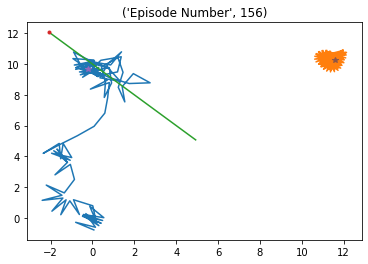

Episode * 157 * Avg Reward is ==> 2364.3849174069555 : Ag1 Reward ==> 1468.2420747640601 : Ag2 Reward ==> 985.4540794788857 


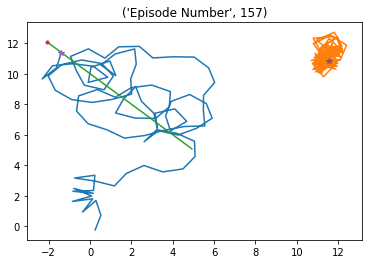

Episode * 158 * Avg Reward is ==> 2362.9196336683194 : Ag1 Reward ==> 1530.0991031041842 : Ag2 Reward ==> 1018.4380204823501 


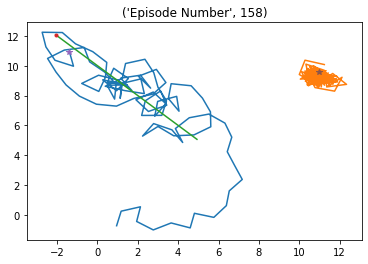

Episode * 159 * Avg Reward is ==> 2365.3480681485025 : Ag1 Reward ==> 1259.5582106738182 : Ag2 Reward ==> 1033.8321044420409 


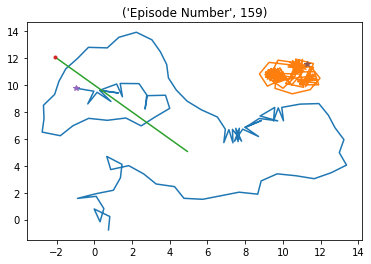

Episode * 160 * Avg Reward is ==> 2372.8836708616823 : Ag1 Reward ==> 1389.041106871939 : Ag2 Reward ==> 1029.6588890008115 


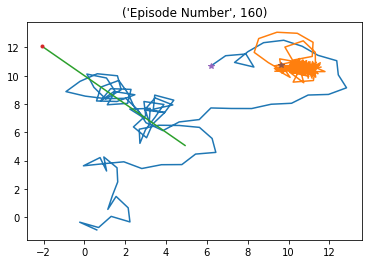

Episode * 161 * Avg Reward is ==> 2377.4532885643735 : Ag1 Reward ==> 1581.970191860185 : Ag2 Reward ==> 1004.5435299153887 


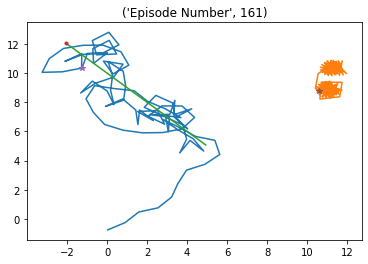

Episode * 162 * Avg Reward is ==> 2384.3460962661657 : Ag1 Reward ==> 1531.3409815962884 : Ag2 Reward ==> 1018.7267418782556 


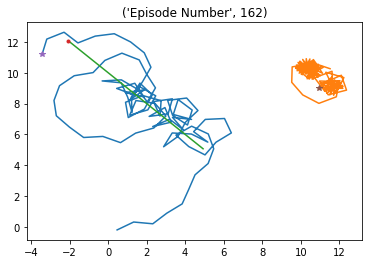

Episode * 163 * Avg Reward is ==> 2384.968393591291 : Ag1 Reward ==> 1407.2191035384092 : Ag2 Reward ==> 975.1653581330385 


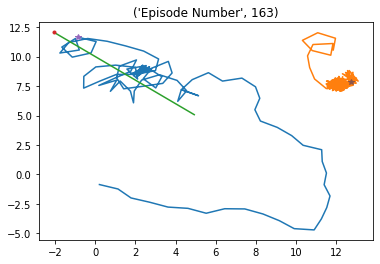

Episode * 164 * Avg Reward is ==> 2392.5010175944058 : Ag1 Reward ==> 1360.2497412978264 : Ag2 Reward ==> 1071.6673696485182 


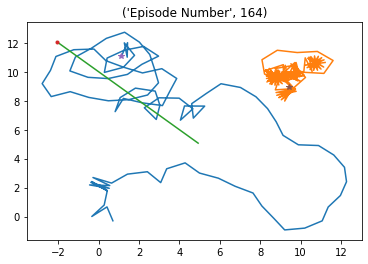

Episode * 165 * Avg Reward is ==> 2389.2070181023673 : Ag1 Reward ==> 1239.0719052913373 : Ag2 Reward ==> 1016.0608335896937 


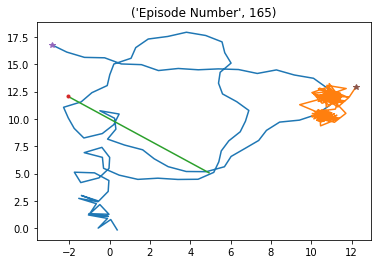

Episode * 166 * Avg Reward is ==> 2392.7800872312573 : Ag1 Reward ==> 1566.9812966888746 : Ag2 Reward ==> 971.0211615499429 


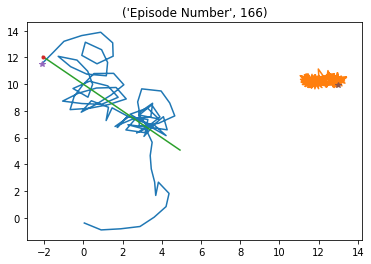

Episode * 167 * Avg Reward is ==> 2397.895295203133 : Ag1 Reward ==> 1640.7065611362184 : Ag2 Reward ==> 1029.8584705175704 


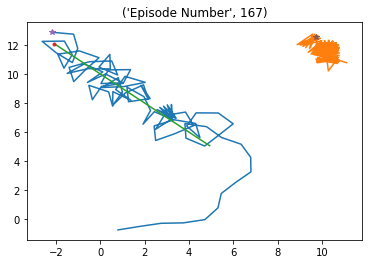

Episode * 168 * Avg Reward is ==> 2404.555539428568 : Ag1 Reward ==> 1405.6744447955766 : Ag2 Reward ==> 1039.2382310597343 


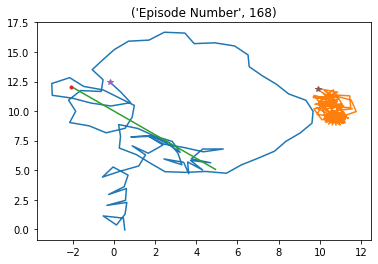

Episode * 169 * Avg Reward is ==> 2408.6532489630176 : Ag1 Reward ==> 1493.1685336841595 : Ag2 Reward ==> 1008.0985597016239 


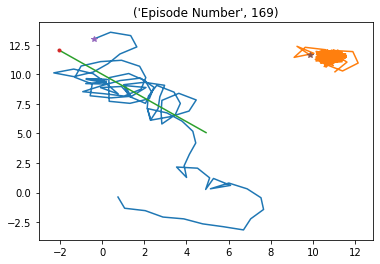

Episode * 170 * Avg Reward is ==> 2409.4754570691516 : Ag1 Reward ==> 1454.934679609275 : Ag2 Reward ==> 1034.160676262269 


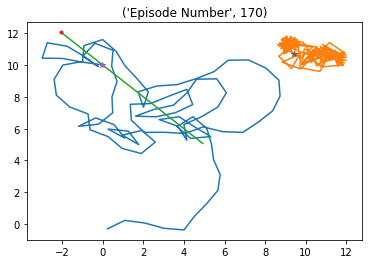

Episode * 171 * Avg Reward is ==> 2405.7216516743247 : Ag1 Reward ==> 1163.0449794590215 : Ag2 Reward ==> 985.1738301640246 


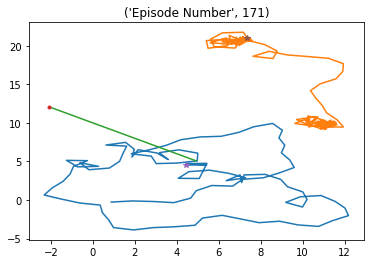

Episode * 172 * Avg Reward is ==> 2410.1365230636925 : Ag1 Reward ==> 1536.3775274632783 : Ag2 Reward ==> 1010.4920078971116 


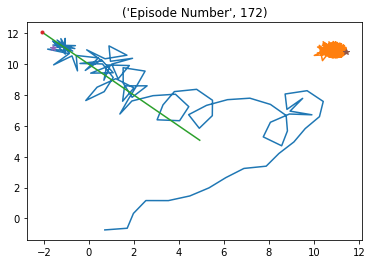

Episode * 173 * Avg Reward is ==> 2416.947354990315 : Ag1 Reward ==> 1319.4423361684321 : Ag2 Reward ==> 1095.2599386750028 


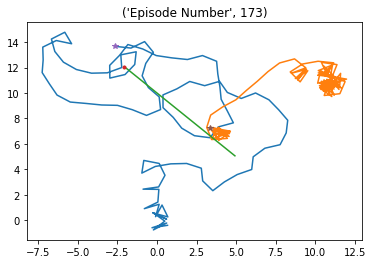

Episode * 174 * Avg Reward is ==> 2417.1360609658486 : Ag1 Reward ==> 1468.1483682322878 : Ag2 Reward ==> 982.1446050198708 


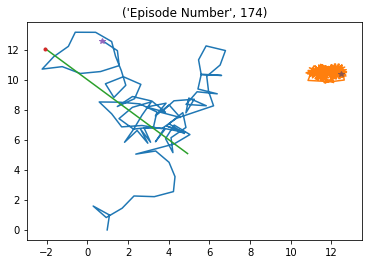

Episode * 175 * Avg Reward is ==> 2420.95953487057 : Ag1 Reward ==> 1298.3286272476662 : Ag2 Reward ==> 1018.4859518809753 


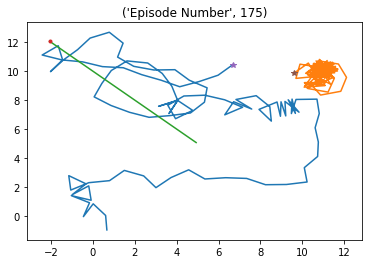

Episode * 176 * Avg Reward is ==> 2432.802880989513 : Ag1 Reward ==> 1545.1707263354922 : Ag2 Reward ==> 1020.3210180427118 


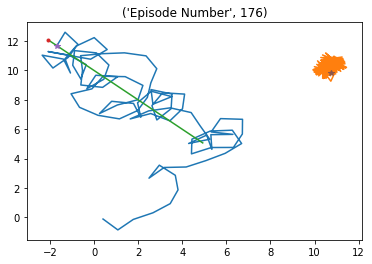

Episode * 177 * Avg Reward is ==> 2434.5160255379155 : Ag1 Reward ==> 1246.491829334982 : Ag2 Reward ==> 1004.8478912489257 


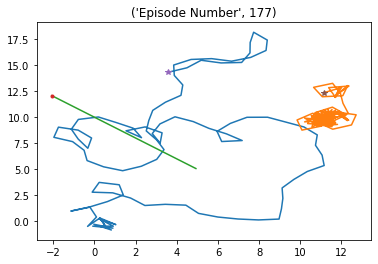

Episode * 178 * Avg Reward is ==> 2442.2538888931276 : Ag1 Reward ==> 1529.5369409274688 : Ag2 Reward ==> 1041.5109358154693 


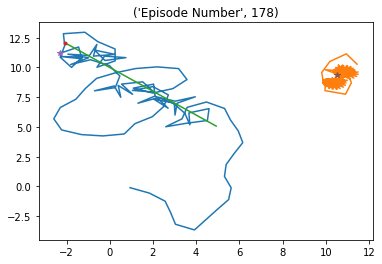

Episode * 179 * Avg Reward is ==> 2441.801439901391 : Ag1 Reward ==> 1523.74180129978 : Ag2 Reward ==> 991.0171012507186 


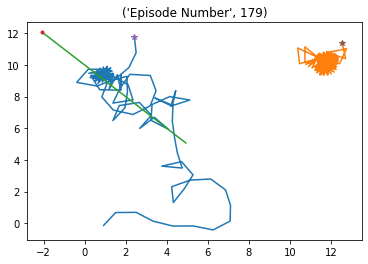

Episode * 180 * Avg Reward is ==> 2448.2101734430707 : Ag1 Reward ==> 1306.5713441316354 : Ag2 Reward ==> 1081.7522511785887 


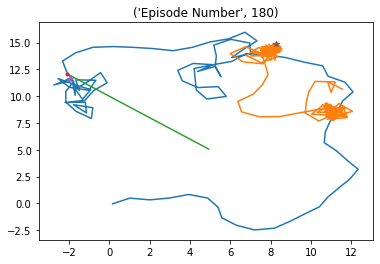

Episode * 181 * Avg Reward is ==> 2450.551610647709 : Ag1 Reward ==> 1535.014537698711 : Ag2 Reward ==> 1015.7203168957726 


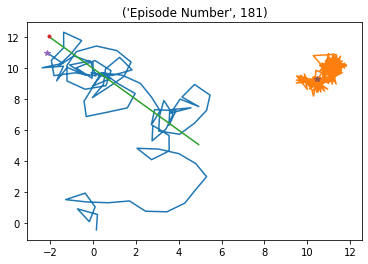

Episode * 182 * Avg Reward is ==> 2450.4681167837057 : Ag1 Reward ==> 1565.0769466776878 : Ag2 Reward ==> 1001.12328789265 


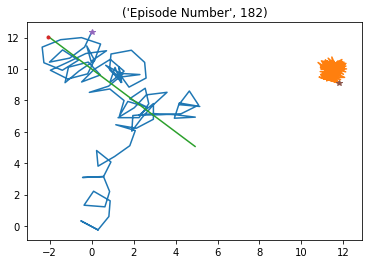

Episode * 183 * Avg Reward is ==> 2449.0284879797605 : Ag1 Reward ==> 1469.4900703906524 : Ag2 Reward ==> 966.8334904166992 


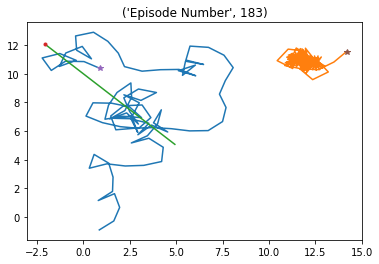

Episode * 184 * Avg Reward is ==> 2443.956338128233 : Ag1 Reward ==> 1396.6061400359633 : Ag2 Reward ==> 941.9497555210054 


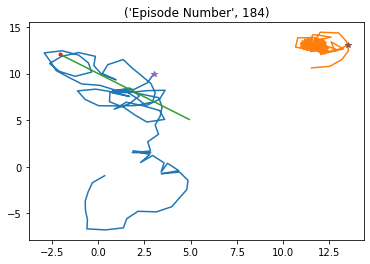

Episode * 185 * Avg Reward is ==> 2443.0917428711896 : Ag1 Reward ==> 1440.2650284940134 : Ag2 Reward ==> 947.916037347579 


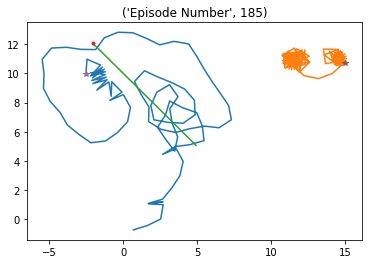

Episode * 186 * Avg Reward is ==> 2444.734116581552 : Ag1 Reward ==> 1512.6312880443468 : Ag2 Reward ==> 995.1702857359418 


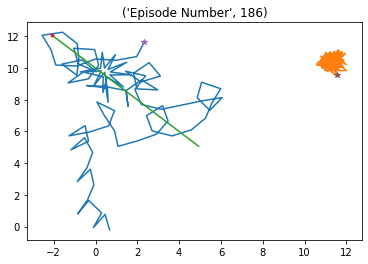

Episode * 187 * Avg Reward is ==> 2433.9303516057907 : Ag1 Reward ==> 966.6200491278582 : Ag2 Reward ==> 1004.1478810800194 


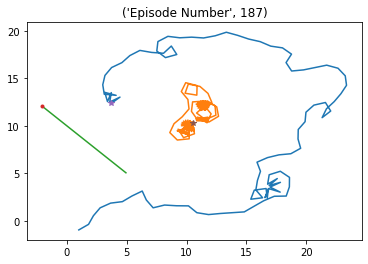

Episode * 188 * Avg Reward is ==> 2428.3356424034437 : Ag1 Reward ==> 1077.3676607678556 : Ag2 Reward ==> 942.9117651653263 


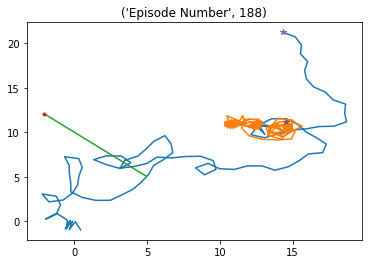

Episode * 189 * Avg Reward is ==> 2426.799931784214 : Ag1 Reward ==> 1488.1484686781378 : Ag2 Reward ==> 1030.619983425004 


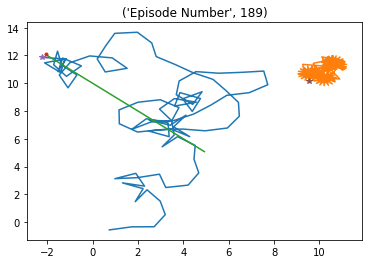

Episode * 190 * Avg Reward is ==> 2419.9437731012463 : Ag1 Reward ==> 1362.7358735651806 : Ag2 Reward ==> 883.4350080643852 


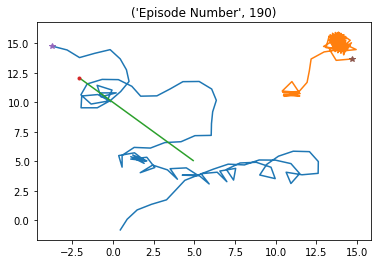

Episode * 191 * Avg Reward is ==> 2415.9042103720285 : Ag1 Reward ==> 1437.8605893740073 : Ag2 Reward ==> 988.8711888405104 


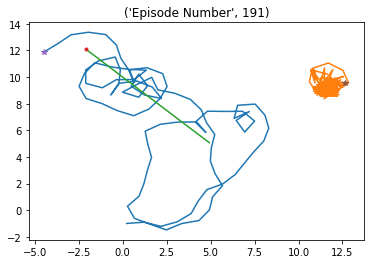

Episode * 192 * Avg Reward is ==> 2422.1186439230396 : Ag1 Reward ==> 1558.0815301229638 : Ag2 Reward ==> 1019.1571116128522 


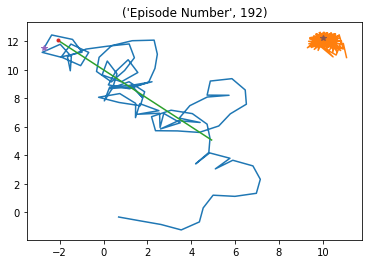

Episode * 193 * Avg Reward is ==> 2425.832581837434 : Ag1 Reward ==> 1590.0014197294006 : Ag2 Reward ==> 982.6354117214531 


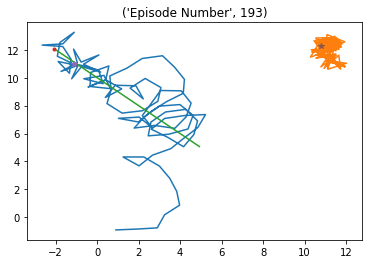

Episode * 194 * Avg Reward is ==> 2432.8405171711406 : Ag1 Reward ==> 1533.4350247598768 : Ag2 Reward ==> 1045.0288915441831 


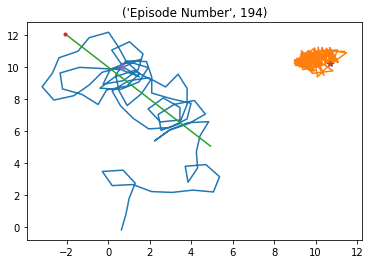

Episode * 195 * Avg Reward is ==> 2430.8358882683565 : Ag1 Reward ==> 1369.2452100233872 : Ag2 Reward ==> 1007.0907793259671 


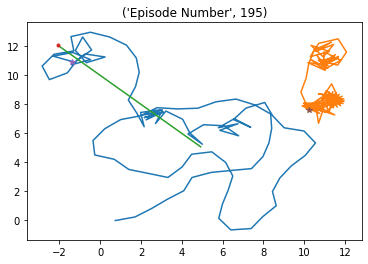

Episode * 196 * Avg Reward is ==> 2432.3812682891803 : Ag1 Reward ==> 1470.8905664642125 : Ag2 Reward ==> 1017.1271606779056 


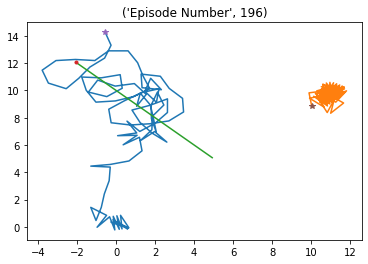

Episode * 197 * Avg Reward is ==> 2432.248196289473 : Ag1 Reward ==> 1428.8782461171227 : Ag2 Reward ==> 1019.4950281375034 


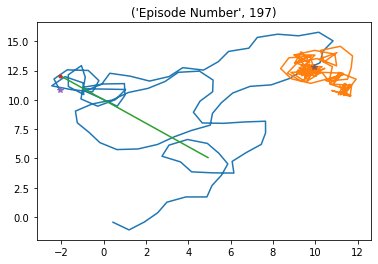

Episode * 198 * Avg Reward is ==> 2433.2232733435667 : Ag1 Reward ==> 1525.2237966260075 : Ag2 Reward ==> 1062.316409124282 


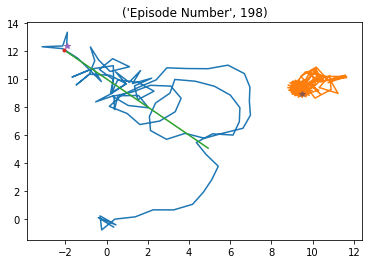

Episode * 199 * Avg Reward is ==> 2433.7904744798216 : Ag1 Reward ==> 1291.6542178013456 : Ag2 Reward ==> 1024.4241427647137 


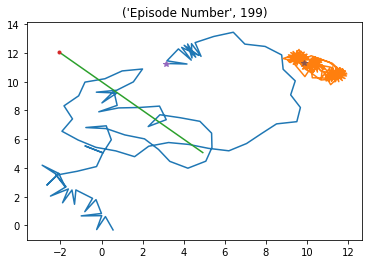

Episode * 200 * Avg Reward is ==> 2434.6593077371663 : Ag1 Reward ==> 1441.001953569122 : Ag2 Reward ==> 1012.451372597412 


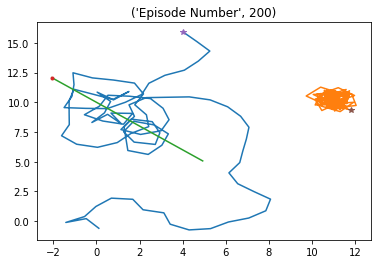

Episode * 201 * Avg Reward is ==> 2430.4283479215483 : Ag1 Reward ==> 1447.2754179975295 : Ag2 Reward ==> 969.9999111533314 


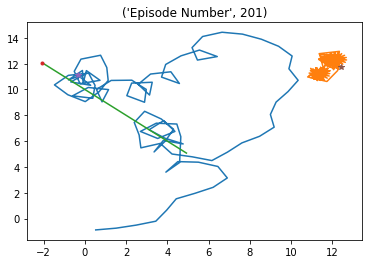

Episode * 202 * Avg Reward is ==> 2426.998963035882 : Ag1 Reward ==> 1374.1920196559047 : Ag2 Reward ==> 1038.700308391969 


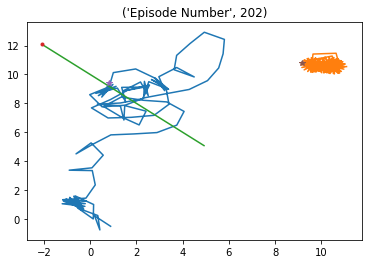

Episode * 203 * Avg Reward is ==> 2429.140286080091 : Ag1 Reward ==> 1424.1604274485594 : Ag2 Reward ==> 1043.8769559912548 


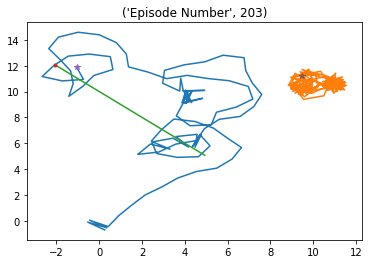

Episode * 204 * Avg Reward is ==> 2433.3549256033552 : Ag1 Reward ==> 1578.6784647147151 : Ag2 Reward ==> 1021.8242271622084 


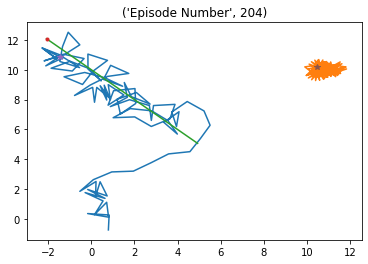

Episode * 205 * Avg Reward is ==> 2440.7610921145993 : Ag1 Reward ==> 1535.2277573861631 : Ag2 Reward ==> 1016.1516419446294 


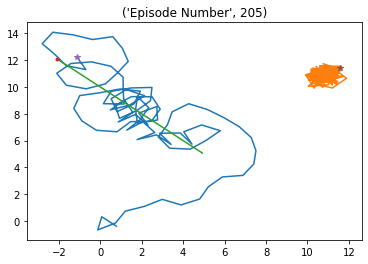

Episode * 206 * Avg Reward is ==> 2441.5952756651577 : Ag1 Reward ==> 1541.8447579929964 : Ag2 Reward ==> 1029.525042268169 


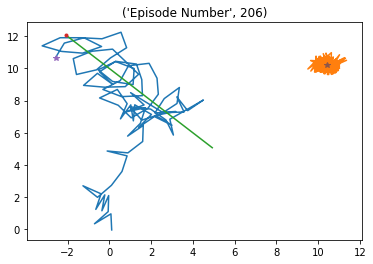

Episode * 207 * Avg Reward is ==> 2436.0622214935943 : Ag1 Reward ==> 1400.1602608817025 : Ag2 Reward ==> 1049.0826039095323 


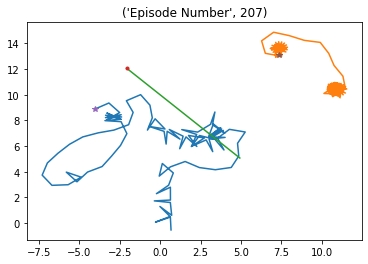

Episode * 208 * Avg Reward is ==> 2436.4425661378327 : Ag1 Reward ==> 1475.3296007800557 : Ag2 Reward ==> 984.7968608448051 


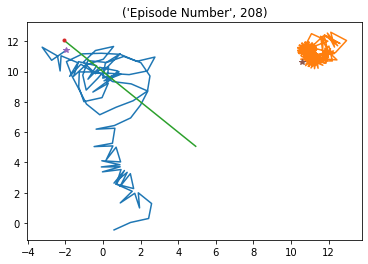

Episode * 209 * Avg Reward is ==> 2430.434958280174 : Ag1 Reward ==> 1256.7401904320518 : Ag2 Reward ==> 1004.2225886473761 


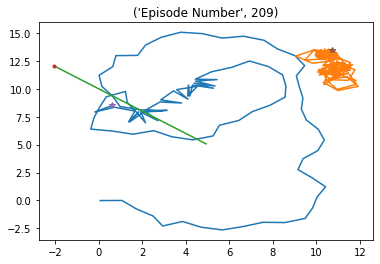

Episode * 210 * Avg Reward is ==> 2430.302809082157 : Ag1 Reward ==> 1431.656614502153 : Ag2 Reward ==> 1052.1527734487333 


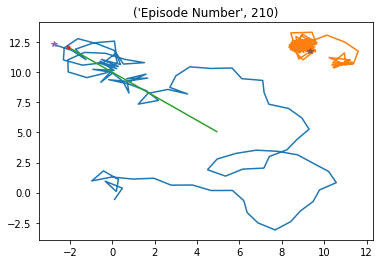

Episode * 211 * Avg Reward is ==> 2439.056563008884 : Ag1 Reward ==> 1483.6750143233403 : Ag2 Reward ==> 1014.6939523687624 


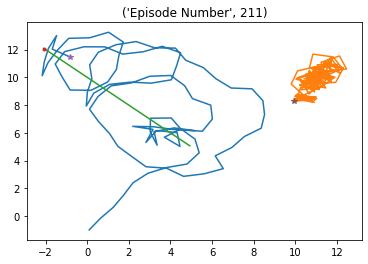

Episode * 212 * Avg Reward is ==> 2438.2956061005098 : Ag1 Reward ==> 1513.3748157935722 : Ag2 Reward ==> 1003.0564432318614 


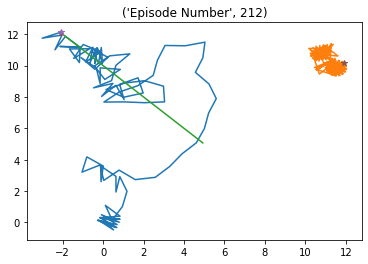

Episode * 213 * Avg Reward is ==> 2442.837754550966 : Ag1 Reward ==> 1593.533040850746 : Ag2 Reward ==> 1002.8551720109273 


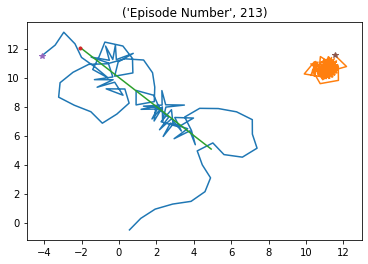

Episode * 214 * Avg Reward is ==> 2444.537495402665 : Ag1 Reward ==> 1561.3229533330618 : Ag2 Reward ==> 956.9596539870605 


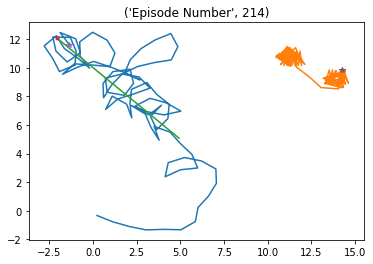

Episode * 215 * Avg Reward is ==> 2447.1618283455136 : Ag1 Reward ==> 1386.882375918551 : Ag2 Reward ==> 1034.9055209240225 


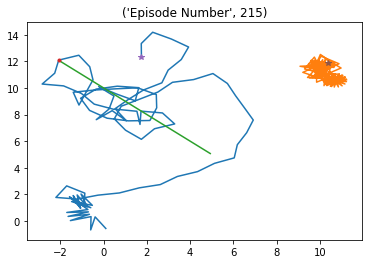

Episode * 216 * Avg Reward is ==> 2442.5576032919403 : Ag1 Reward ==> 1343.8999363769622 : Ag2 Reward ==> 1037.4228058583103 


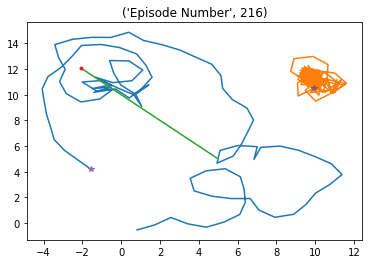

Episode * 217 * Avg Reward is ==> 2445.866393634143 : Ag1 Reward ==> 1286.748265608613 : Ag2 Reward ==> 1096.9430686634166 


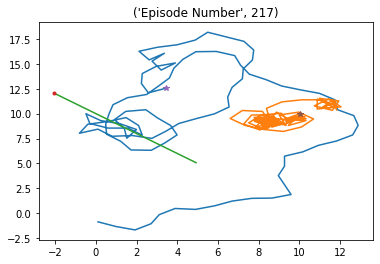

Episode * 218 * Avg Reward is ==> 2445.2852358576 : Ag1 Reward ==> 1533.4054766884842 : Ag2 Reward ==> 1014.396088992738 


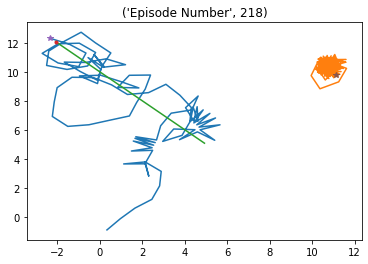

Episode * 219 * Avg Reward is ==> 2445.832250594713 : Ag1 Reward ==> 1466.7210234327895 : Ag2 Reward ==> 1069.9184686022181 


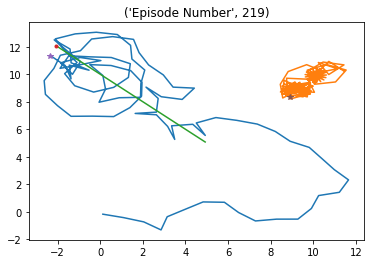

Episode * 220 * Avg Reward is ==> 2442.5821207222484 : Ag1 Reward ==> 1218.6419564475411 : Ag2 Reward ==> 1039.6764439640892 


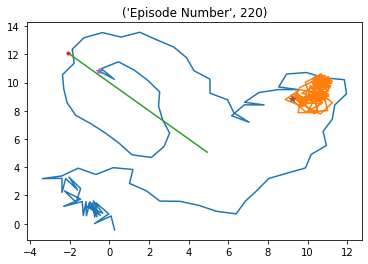

Episode * 221 * Avg Reward is ==> 2443.1523130538003 : Ag1 Reward ==> 1549.6771746873503 : Ag2 Reward ==> 1023.8653731692154 


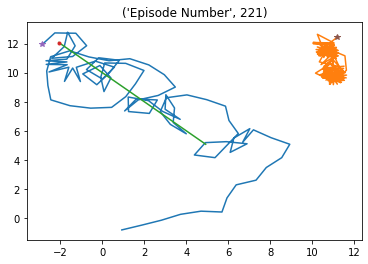

Episode * 222 * Avg Reward is ==> 2443.872622226379 : Ag1 Reward ==> 1587.1838297515137 : Ag2 Reward ==> 1007.8287717219722 


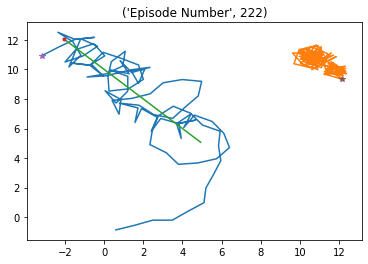

Episode * 223 * Avg Reward is ==> 2444.075808666594 : Ag1 Reward ==> 1471.2855250421446 : Ag2 Reward ==> 973.1654933738057 


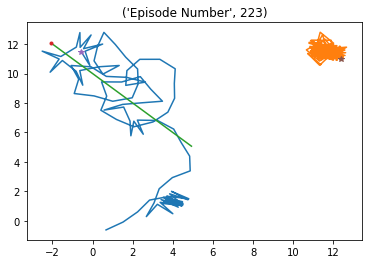

Episode * 224 * Avg Reward is ==> 2447.5809126697854 : Ag1 Reward ==> 1502.0079578646473 : Ag2 Reward ==> 976.7520978199698 


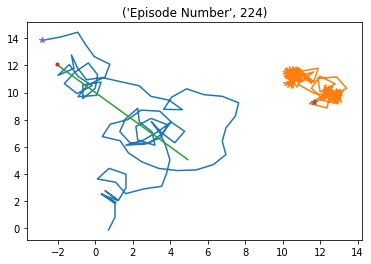

Episode * 225 * Avg Reward is ==> 2442.5854349238516 : Ag1 Reward ==> 1296.1488166202166 : Ag2 Reward ==> 892.2131393840306 


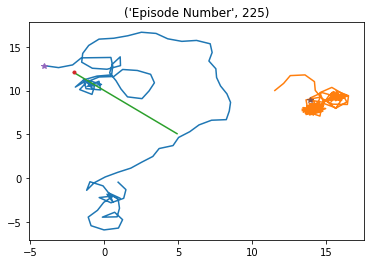

Episode * 226 * Avg Reward is ==> 2440.883741226151 : Ag1 Reward ==> 1456.3854927663317 : Ag2 Reward ==> 983.3483331059265 


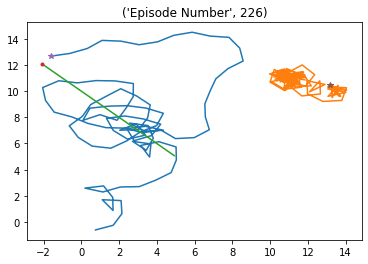

Episode * 227 * Avg Reward is ==> 2454.138929908268 : Ag1 Reward ==> 1545.574778415764 : Ag2 Reward ==> 955.4006990767988 


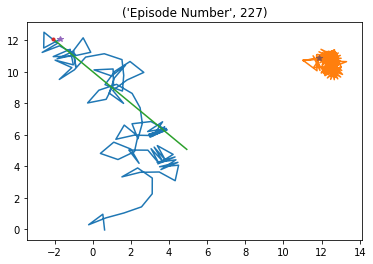

Episode * 228 * Avg Reward is ==> 2464.8961850525634 : Ag1 Reward ==> 1451.5036930710057 : Ag2 Reward ==> 999.0659386339858 


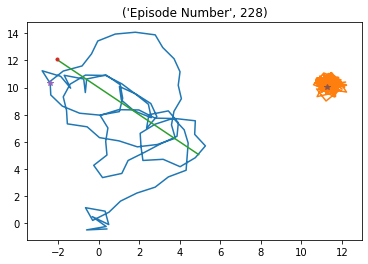

Episode * 229 * Avg Reward is ==> 2462.377366721318 : Ag1 Reward ==> 1443.0367119758848 : Ag2 Reward ==> 974.979006877443 


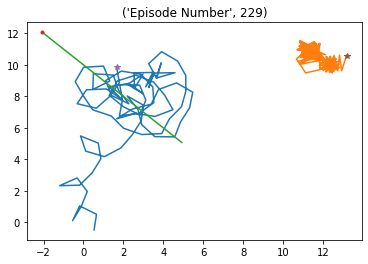

Episode * 230 * Avg Reward is ==> 2465.836919680478 : Ag1 Reward ==> 1402.8900527297533 : Ag2 Reward ==> 981.6629472662108 


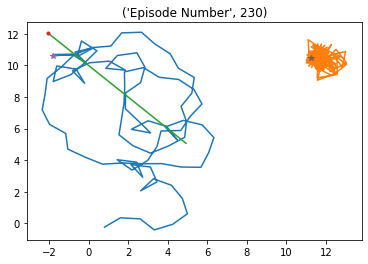

Episode * 231 * Avg Reward is ==> 2456.689103775846 : Ag1 Reward ==> 1084.6754561110106 : Ag2 Reward ==> 976.1436859182435 


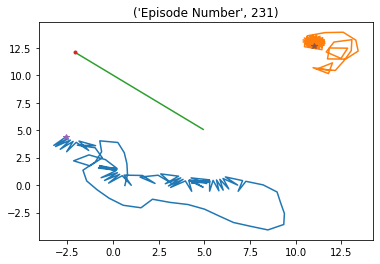

Episode * 232 * Avg Reward is ==> 2455.9128511255776 : Ag1 Reward ==> 1556.29481825213 : Ag2 Reward ==> 989.8937174729427 


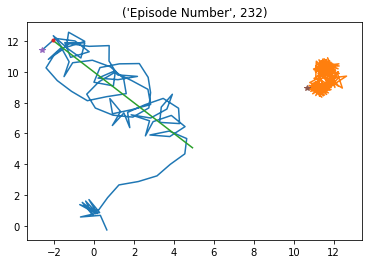

Episode * 233 * Avg Reward is ==> 2454.0213187099225 : Ag1 Reward ==> 1524.0656295642561 : Ag2 Reward ==> 972.9099052603963 


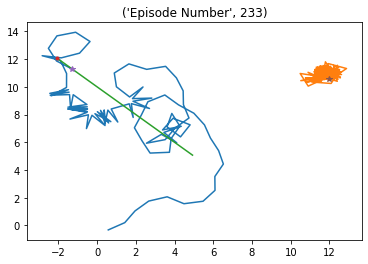

Episode * 234 * Avg Reward is ==> 2454.4121597913827 : Ag1 Reward ==> 1532.220326515981 : Ag2 Reward ==> 1061.8772330464803 


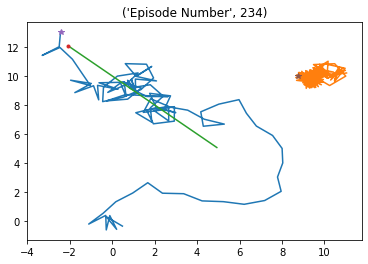

Episode * 235 * Avg Reward is ==> 2459.6813300376234 : Ag1 Reward ==> 1628.1508130027182 : Ag2 Reward ==> 958.9519861962627 


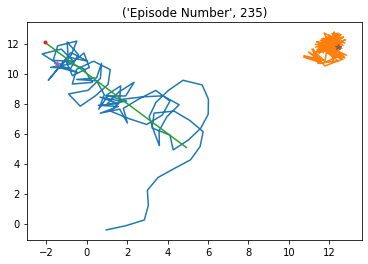

Episode * 236 * Avg Reward is ==> 2459.9883433961195 : Ag1 Reward ==> 1504.5554214913398 : Ag2 Reward ==> 995.7428399906236 


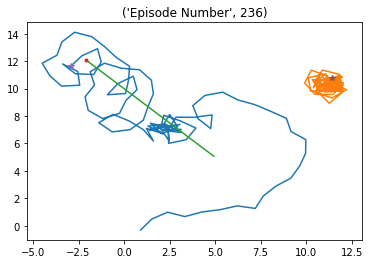

Episode * 237 * Avg Reward is ==> 2462.4689033663685 : Ag1 Reward ==> 1569.351192946117 : Ag2 Reward ==> 978.2444801184843 


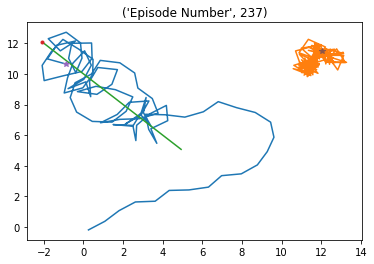

Episode * 238 * Avg Reward is ==> 2459.6969106846004 : Ag1 Reward ==> 1448.316326443756 : Ag2 Reward ==> 1028.344172035798 


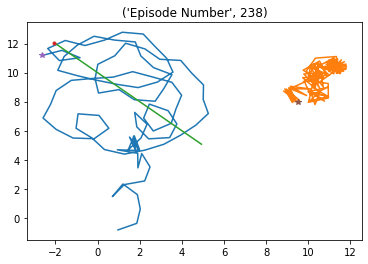

Episode * 239 * Avg Reward is ==> 2466.4138577838216 : Ag1 Reward ==> 1585.7087262942493 : Ag2 Reward ==> 999.0475182406545 


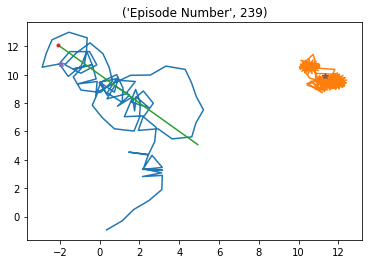

Episode * 240 * Avg Reward is ==> 2469.477940200081 : Ag1 Reward ==> 1587.6969967250393 : Ag2 Reward ==> 988.3196260918568 


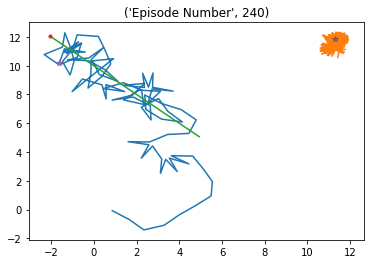

Episode * 241 * Avg Reward is ==> 2474.0209138191385 : Ag1 Reward ==> 1532.398560379947 : Ag2 Reward ==> 1066.595713533217 


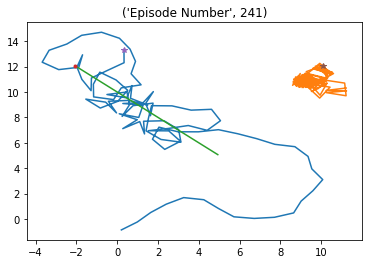

Episode * 242 * Avg Reward is ==> 2475.0826889832624 : Ag1 Reward ==> 1437.4118652109025 : Ag2 Reward ==> 1017.9514694019331 


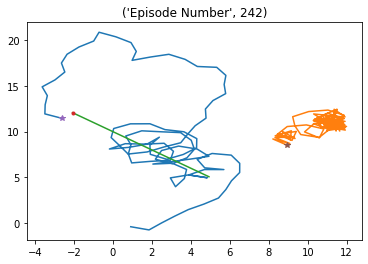

Episode * 243 * Avg Reward is ==> 2467.987802207326 : Ag1 Reward ==> 1221.3744911520564 : Ag2 Reward ==> 962.8674212502951 


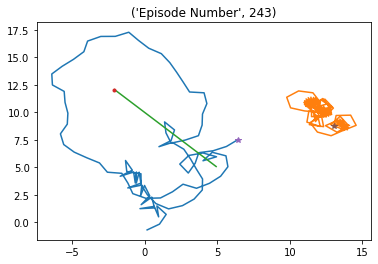

Episode * 244 * Avg Reward is ==> 2455.9868147345687 : Ag1 Reward ==> 1164.2561521247205 : Ag2 Reward ==> 956.207040841931 


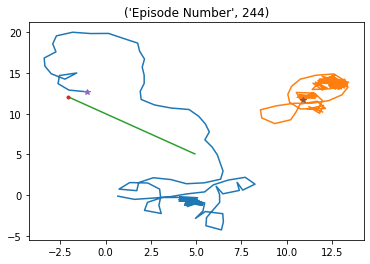

Episode * 245 * Avg Reward is ==> 2449.6097474340795 : Ag1 Reward ==> 1265.7690187315277 : Ag2 Reward ==> 1030.5276885796718 


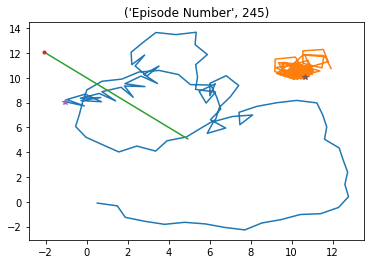

Episode * 246 * Avg Reward is ==> 2442.175260442207 : Ag1 Reward ==> 1232.0119011014708 : Ag2 Reward ==> 1041.9784194848194 


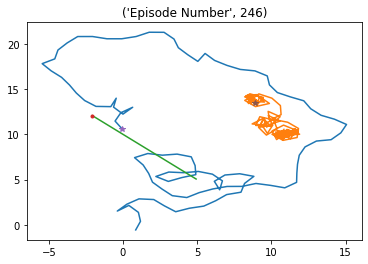

Episode * 247 * Avg Reward is ==> 2443.6680947098703 : Ag1 Reward ==> 1513.8133738338279 : Ag2 Reward ==> 995.1428616639254 


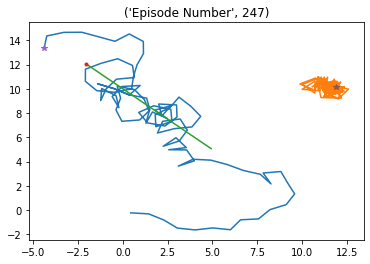

Episode * 248 * Avg Reward is ==> 2439.988988732868 : Ag1 Reward ==> 1347.181494228431 : Ag2 Reward ==> 965.780728316344 


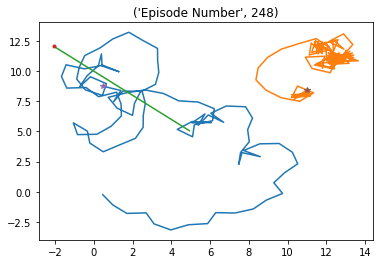

Episode * 249 * Avg Reward is ==> 2448.174957904579 : Ag1 Reward ==> 1560.9494407625775 : Ag2 Reward ==> 1027.4521051852944 


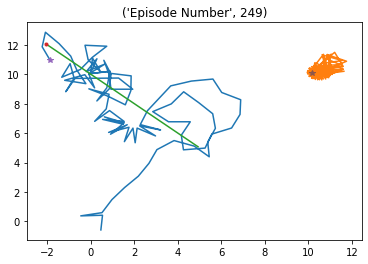

Episode * 250 * Avg Reward is ==> 2451.3160942477407 : Ag1 Reward ==> 1605.44217659711 : Ag2 Reward ==> 1004.0126650802318 


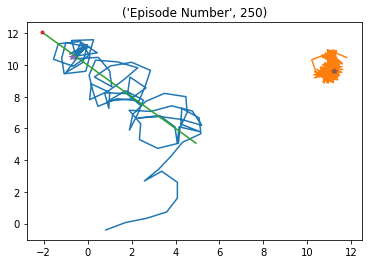

Episode * 251 * Avg Reward is ==> 2449.7741005902412 : Ag1 Reward ==> 1409.3178044153162 : Ag2 Reward ==> 1027.3714159768017 


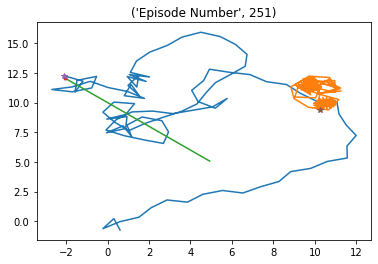

Episode * 252 * Avg Reward is ==> 2451.685309058789 : Ag1 Reward ==> 1566.533742192252 : Ag2 Reward ==> 1026.3458555750935 


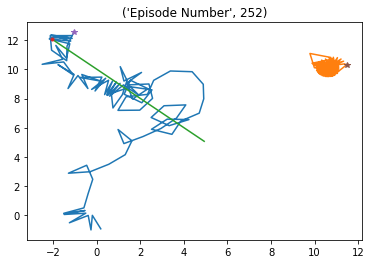

Episode * 253 * Avg Reward is ==> 2450.2125367768203 : Ag1 Reward ==> 1510.5830018992156 : Ag2 Reward ==> 1026.8943196837226 


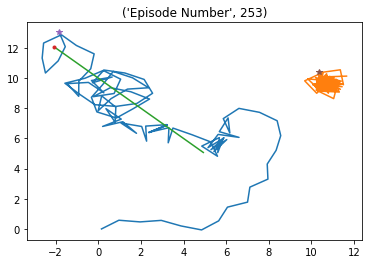

Episode * 254 * Avg Reward is ==> 2447.122681025402 : Ag1 Reward ==> 1409.2310779738261 : Ag2 Reward ==> 985.4572992895766 


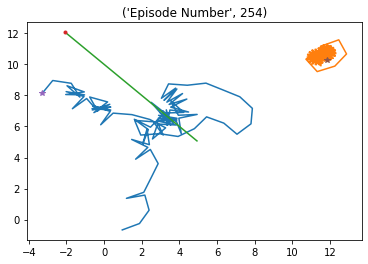

Episode * 255 * Avg Reward is ==> 2444.0266919770834 : Ag1 Reward ==> 1275.8046976617086 : Ag2 Reward ==> 1022.1436372481039 


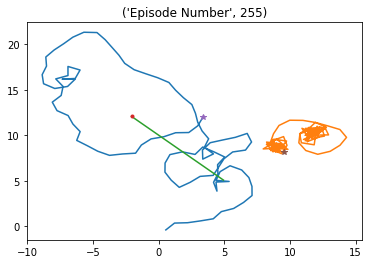

Episode * 256 * Avg Reward is ==> 2447.8964615369528 : Ag1 Reward ==> 1536.846457874577 : Ag2 Reward ==> 999.2670667554805 


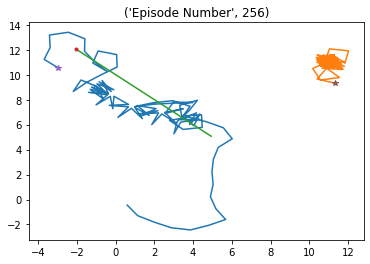

Episode * 257 * Avg Reward is ==> 2448.7470795083 : Ag1 Reward ==> 1471.3023672961847 : Ag2 Reward ==> 946.4136858297196 


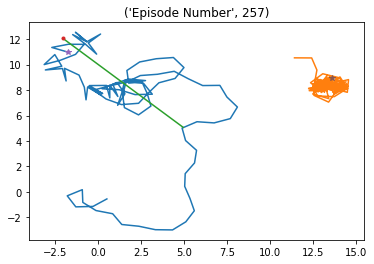

Episode * 258 * Avg Reward is ==> 2446.3578332110055 : Ag1 Reward ==> 1416.2593733036979 : Ag2 Reward ==> 1035.9723404857655 


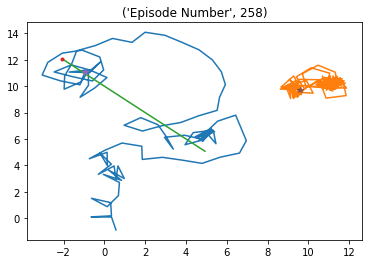

Episode * 259 * Avg Reward is ==> 2438.381720852133 : Ag1 Reward ==> 1270.3206681650809 : Ag2 Reward ==> 947.2743295150228 


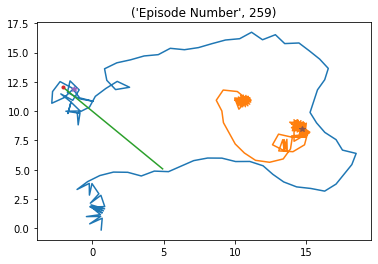

Episode * 260 * Avg Reward is ==> 2447.022020889382 : Ag1 Reward ==> 1587.6044060868305 : Ag2 Reward ==> 1016.3259958147657 


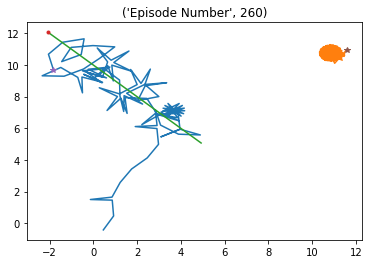

Episode * 261 * Avg Reward is ==> 2446.707192075847 : Ag1 Reward ==> 1478.655893364933 : Ag2 Reward ==> 1082.293501950216 


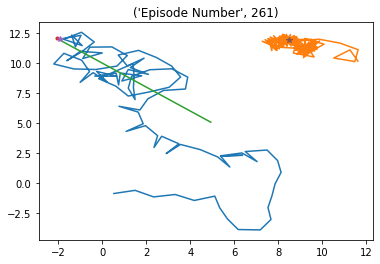

Episode * 262 * Avg Reward is ==> 2445.819873050441 : Ag1 Reward ==> 1525.5575817843462 : Ag2 Reward ==> 1033.9622586729222 


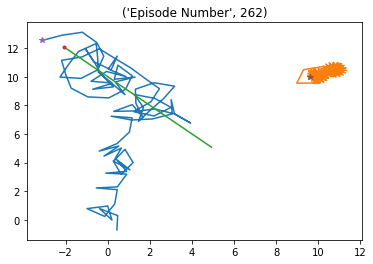

Episode * 263 * Avg Reward is ==> 2447.5393874085103 : Ag1 Reward ==> 1504.825493526437 : Ag2 Reward ==> 1008.4060992122734 


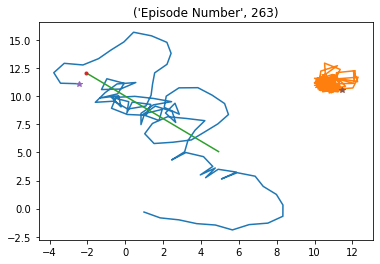

Episode * 264 * Avg Reward is ==> 2446.9804588646984 : Ag1 Reward ==> 1397.2890247858472 : Ag2 Reward ==> 1059.113889146303 


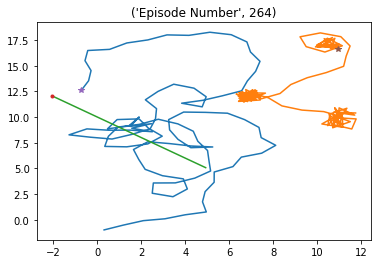

Episode * 265 * Avg Reward is ==> 2455.193795518677 : Ag1 Reward ==> 1508.4309257319367 : Ag2 Reward ==> 1008.4644964314449 


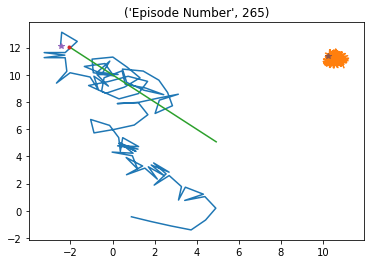

Episode * 266 * Avg Reward is ==> 2455.692770598156 : Ag1 Reward ==> 1450.0329993285804 : Ag2 Reward ==> 1009.6598297228522 


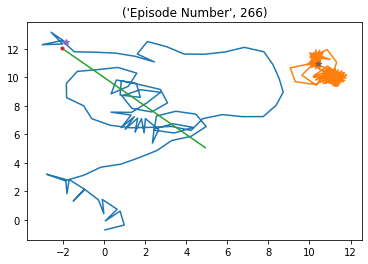

Episode * 267 * Avg Reward is ==> 2456.089479659261 : Ag1 Reward ==> 1491.5186981996308 : Ag2 Reward ==> 1025.3251417371366 


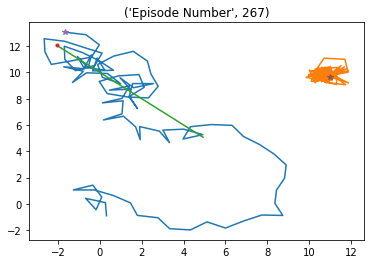

Episode * 268 * Avg Reward is ==> 2457.28826937317 : Ag1 Reward ==> 1505.5532906229953 : Ag2 Reward ==> 992.9679296383284 


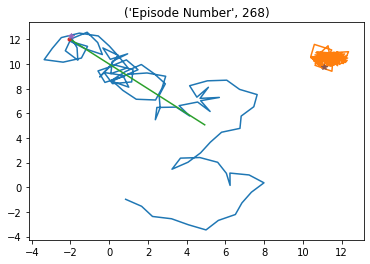

Episode * 269 * Avg Reward is ==> 2462.371604983964 : Ag1 Reward ==> 1577.7158521826705 : Ag2 Reward ==> 1043.6332911024394 


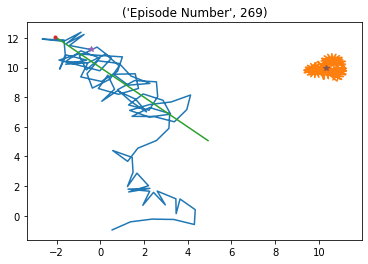

Episode * 270 * Avg Reward is ==> 2467.2373262634055 : Ag1 Reward ==> 1555.0580470557359 : Ag2 Reward ==> 1024.1238041178929 


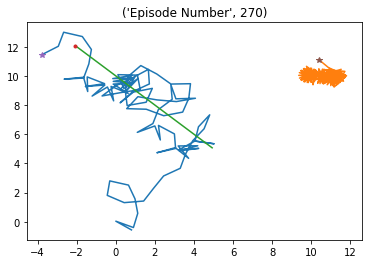

Episode * 271 * Avg Reward is ==> 2480.3055966490124 : Ag1 Reward ==> 1573.1470693709587 : Ag2 Reward ==> 1010.4028880825456 


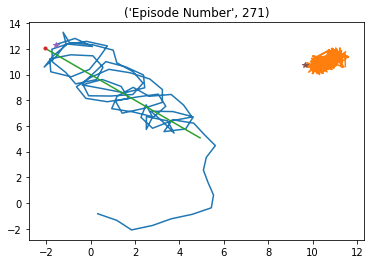

Episode * 272 * Avg Reward is ==> 2479.832929843007 : Ag1 Reward ==> 1553.5383405631558 : Ag2 Reward ==> 973.7435229217099 


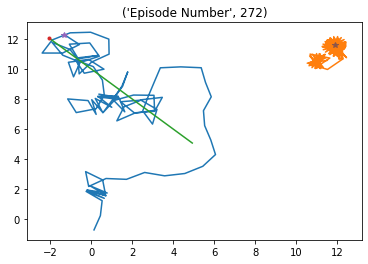

Episode * 273 * Avg Reward is ==> 2480.9739943648433 : Ag1 Reward ==> 1519.7410704434612 : Ag2 Reward ==> 1022.8770452546331 


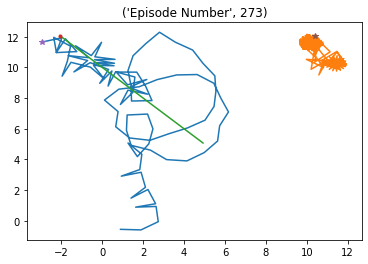

Episode * 274 * Avg Reward is ==> 2477.5177271877765 : Ag1 Reward ==> 1460.8321373920062 : Ag2 Reward ==> 995.014735087798 


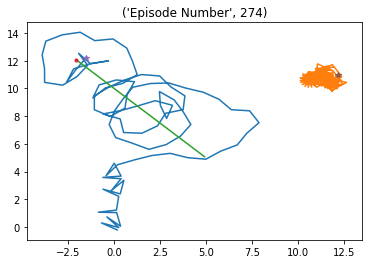

Episode * 275 * Avg Reward is ==> 2477.3854651176684 : Ag1 Reward ==> 1583.284217755417 : Ag2 Reward ==> 998.5280986392413 


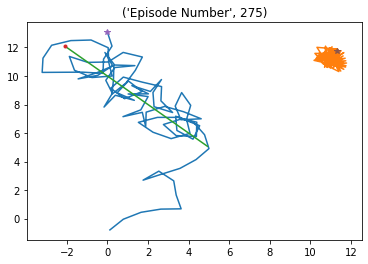

Episode * 276 * Avg Reward is ==> 2476.8598983499346 : Ag1 Reward ==> 1445.3320091581895 : Ag2 Reward ==> 1033.9435816143941 


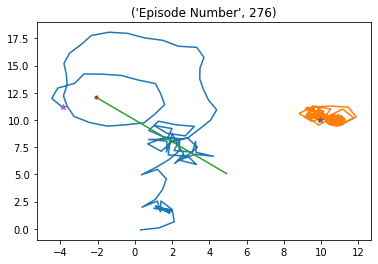

Episode * 277 * Avg Reward is ==> 2474.0676166427465 : Ag1 Reward ==> 1481.0023948756677 : Ag2 Reward ==> 954.9020099014219 


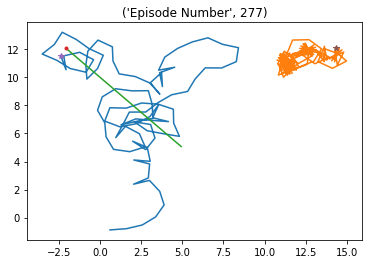

Episode * 278 * Avg Reward is ==> 2476.4391251653556 : Ag1 Reward ==> 1557.858244366512 : Ag2 Reward ==> 1013.6625950174055 


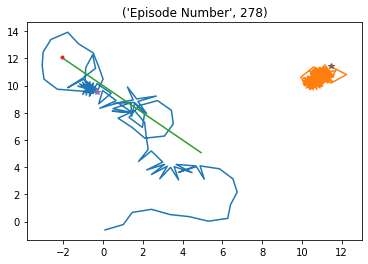

Episode * 279 * Avg Reward is ==> 2475.502973317792 : Ag1 Reward ==> 1534.8025916429815 : Ag2 Reward ==> 1012.5075789893972 


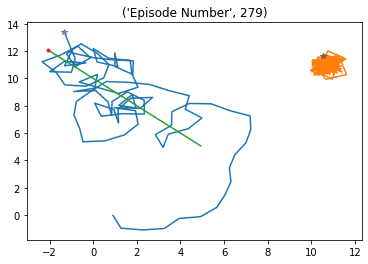

Episode * 280 * Avg Reward is ==> 2475.2164212535217 : Ag1 Reward ==> 1596.953785479654 : Ag2 Reward ==> 967.6007547664242 


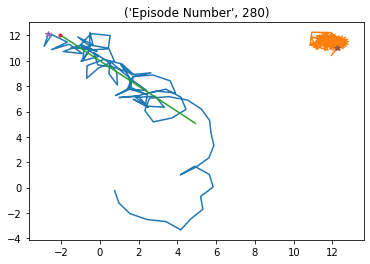

Episode * 281 * Avg Reward is ==> 2472.5307503163444 : Ag1 Reward ==> 1458.9990675210604 : Ag2 Reward ==> 1032.568368905003 


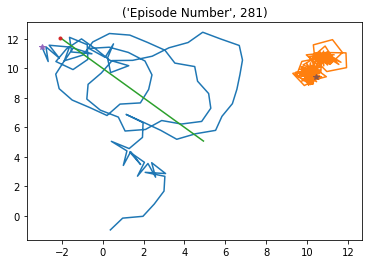

Episode * 282 * Avg Reward is ==> 2473.5984825625587 : Ag1 Reward ==> 1511.376844951149 : Ag2 Reward ==> 986.6957795102646 


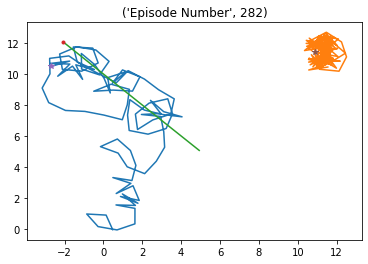

Episode * 283 * Avg Reward is ==> 2482.295506351179 : Ag1 Reward ==> 1524.7606318123421 : Ag2 Reward ==> 1007.362232134829 


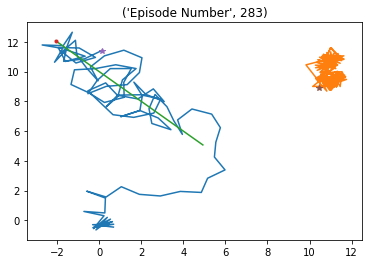

Episode * 284 * Avg Reward is ==> 2489.150513196481 : Ag1 Reward ==> 1412.2261858986521 : Ag2 Reward ==> 982.4372808800609 


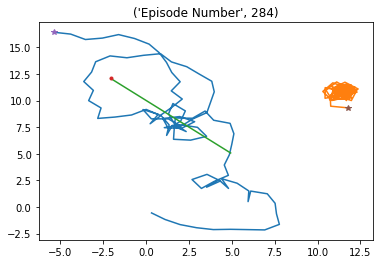

Episode * 285 * Avg Reward is ==> 2485.508528441895 : Ag1 Reward ==> 1151.3264660386712 : Ag2 Reward ==> 999.2908510890942 


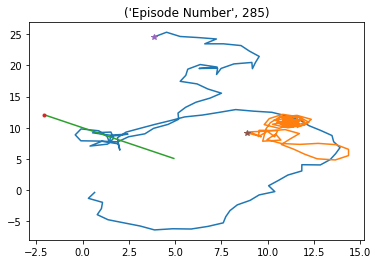

Episode * 286 * Avg Reward is ==> 2490.610654617857 : Ag1 Reward ==> 1505.7362315481978 : Ag2 Reward ==> 972.3391360765717 


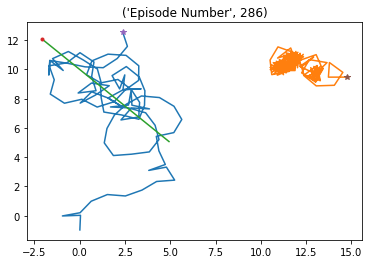

Episode * 287 * Avg Reward is ==> 2486.4878545447345 : Ag1 Reward ==> 1306.3766032646613 : Ag2 Reward ==> 1037.667629308193 


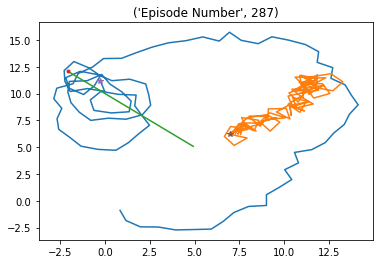

Episode * 288 * Avg Reward is ==> 2491.8174245911932 : Ag1 Reward ==> 1529.8960357283013 : Ag2 Reward ==> 996.2489886748418 


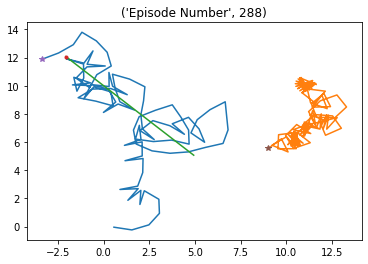

Episode * 289 * Avg Reward is ==> 2498.740974395509 : Ag1 Reward ==> 1536.7862538914005 : Ag2 Reward ==> 1328.5572842290912 


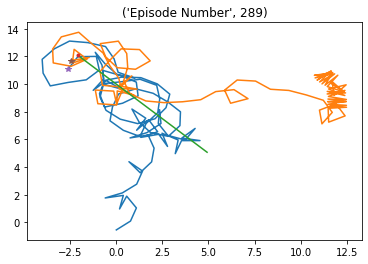

Episode * 290 * Avg Reward is ==> 2500.1614073374794 : Ag1 Reward ==> 1565.7984274452 : Ag2 Reward ==> 1100.4737319109456 


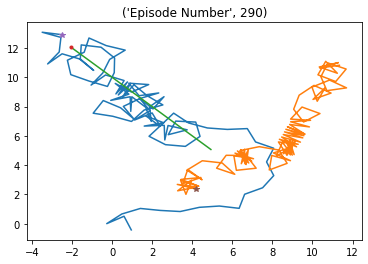

Episode * 291 * Avg Reward is ==> 2499.8134974346085 : Ag1 Reward ==> 1398.5902129735373 : Ag2 Reward ==> 1024.1826113037487 


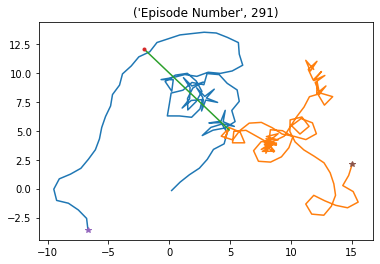

Episode * 292 * Avg Reward is ==> 2503.5471573287846 : Ag1 Reward ==> 1487.879960317497 : Ag2 Reward ==> 1254.3460332168956 


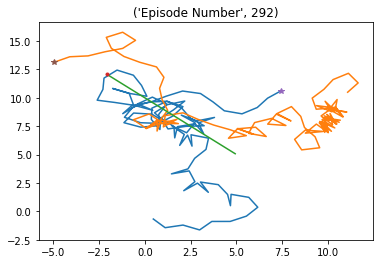

Episode * 293 * Avg Reward is ==> 2505.8613872468204 : Ag1 Reward ==> 1271.3971400630926 : Ag2 Reward ==> 1358.6493782412676 


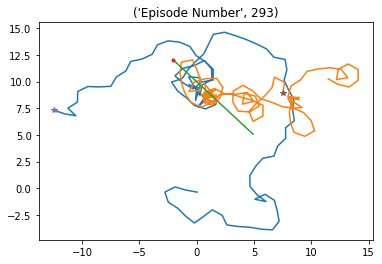

Episode * 294 * Avg Reward is ==> 2503.7767530764645 : Ag1 Reward ==> 966.4743198891961 : Ag2 Reward ==> 1344.8286905599823 


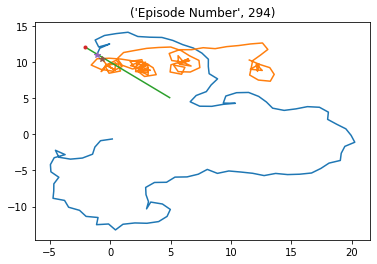

Episode * 295 * Avg Reward is ==> 2515.3838819199327 : Ag1 Reward ==> 1619.4744363905359 : Ag2 Reward ==> 1142.7590522580033 


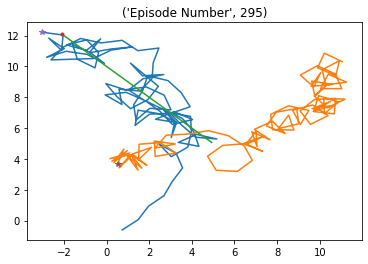

Episode * 296 * Avg Reward is ==> 2508.2649427773276 : Ag1 Reward ==> 1254.7441626310806 : Ag2 Reward ==> 996.6117962947618 


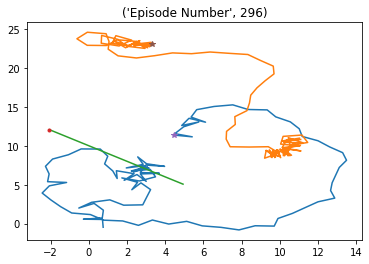

Episode * 297 * Avg Reward is ==> 2518.550003638965 : Ag1 Reward ==> 1534.5127723757982 : Ag2 Reward ==> 1294.605715215607 


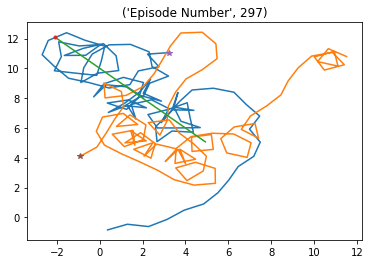

Episode * 298 * Avg Reward is ==> 2517.430513971851 : Ag1 Reward ==> 1446.0211857146387 : Ag2 Reward ==> 961.4309413902558 


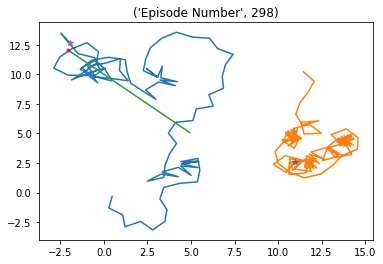

Episode * 299 * Avg Reward is ==> 2532.3216267385424 : Ag1 Reward ==> 1549.138361421397 : Ag2 Reward ==> 1264.1011469263779 


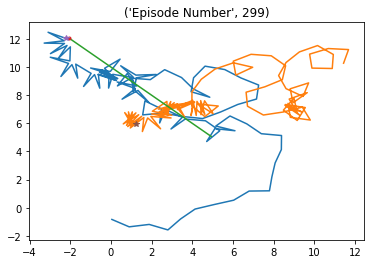

Episode * 300 * Avg Reward is ==> 2523.3854571187885 : Ag1 Reward ==> 1232.445286443465 : Ag2 Reward ==> 1014.0383306679612 


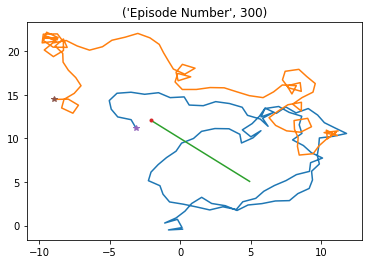

Episode * 301 * Avg Reward is ==> 2524.575252499001 : Ag1 Reward ==> 1495.5568107873285 : Ag2 Reward ==> 1112.984399736337 


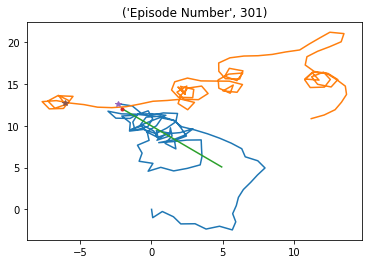

Episode * 302 * Avg Reward is ==> 2528.0020176960334 : Ag1 Reward ==> 1595.5462124569958 : Ag2 Reward ==> 1101.0442358815646 


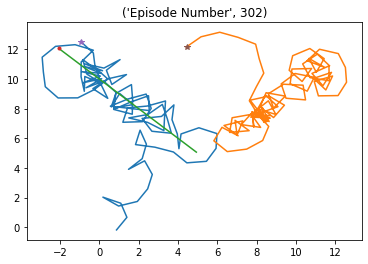

Episode * 303 * Avg Reward is ==> 2535.865365378047 : Ag1 Reward ==> 1581.42349069545 : Ag2 Reward ==> 1246.342009323803 


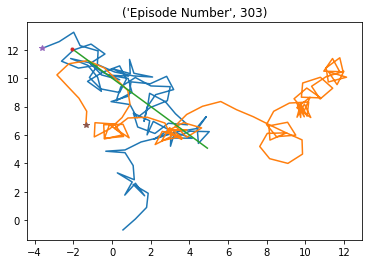

Episode * 304 * Avg Reward is ==> 2532.1774465497933 : Ag1 Reward ==> 1409.0292654683403 : Ag2 Reward ==> 899.8568953336636 


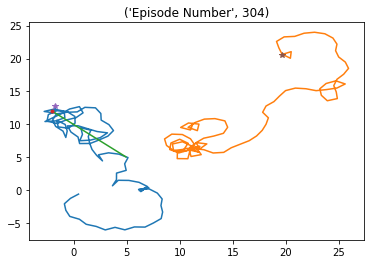

Episode * 305 * Avg Reward is ==> 2536.197242902701 : Ag1 Reward ==> 1434.0798753519769 : Ag2 Reward ==> 1243.6074009277067 


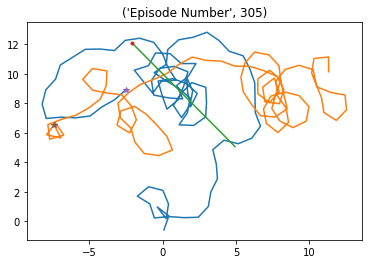

Episode * 306 * Avg Reward is ==> 2527.495157221543 : Ag1 Reward ==> 1290.6141026422727 : Ag2 Reward ==> 820.9952991628501 


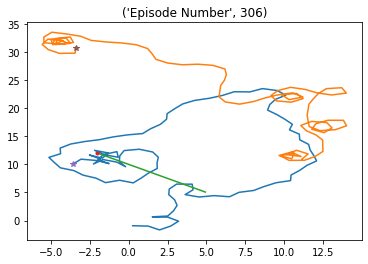

Episode * 307 * Avg Reward is ==> 2531.5884539822064 : Ag1 Reward ==> 1459.0644295238792 : Ag2 Reward ==> 1221.5112808394238 


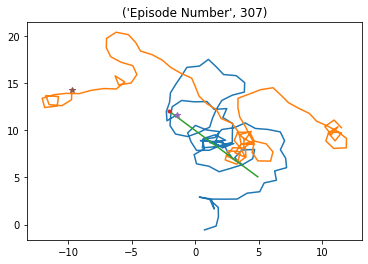

Episode * 308 * Avg Reward is ==> 2533.413042869756 : Ag1 Reward ==> 1609.9485027763978 : Ag2 Reward ==> 961.5562729868933 


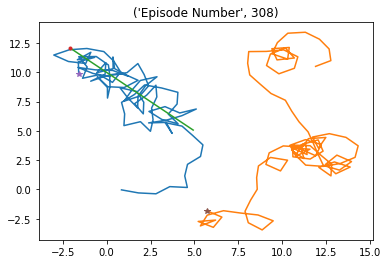

Episode * 309 * Avg Reward is ==> 2529.756396391783 : Ag1 Reward ==> 1274.2952520296033 : Ag2 Reward ==> 1200.7880321365913 


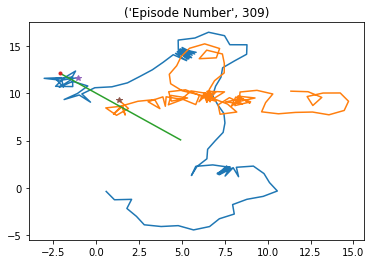

Episode * 310 * Avg Reward is ==> 2536.890786223839 : Ag1 Reward ==> 1609.2319596150273 : Ag2 Reward ==> 1255.3254848408562 


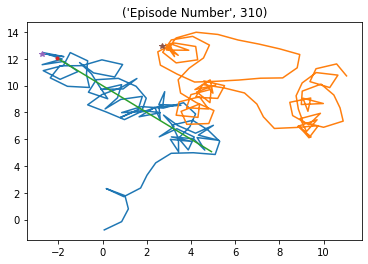

Episode * 311 * Avg Reward is ==> 2534.161157981831 : Ag1 Reward ==> 1440.3773365741508 : Ag2 Reward ==> 1033.987491199041 


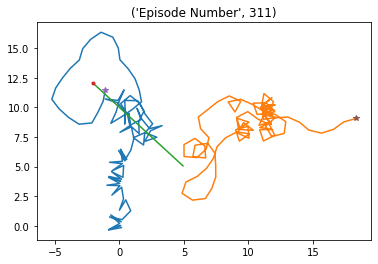

Episode * 312 * Avg Reward is ==> 2534.937300841683 : Ag1 Reward ==> 1450.3179668042658 : Ag2 Reward ==> 1108.0096110746508 


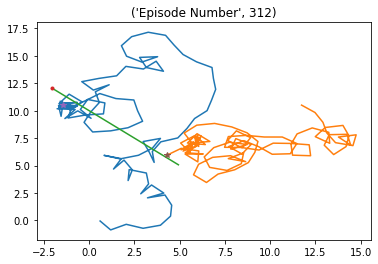

Episode * 313 * Avg Reward is ==> 2528.5229026927814 : Ag1 Reward ==> 1361.2579903503881 : Ag2 Reward ==> 924.7841993916537 


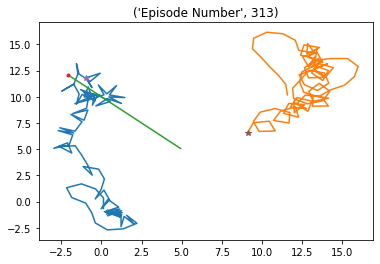

Episode * 314 * Avg Reward is ==> 2533.085623879143 : Ag1 Reward ==> 1549.9402612603053 : Ag2 Reward ==> 1088.4154586739603 


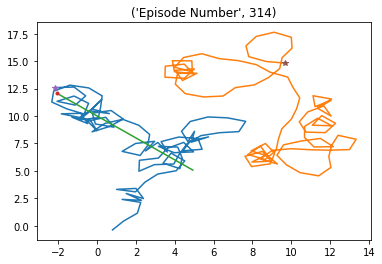

Episode * 315 * Avg Reward is ==> 2537.69507757715 : Ag1 Reward ==> 1467.2144933288716 : Ag2 Reward ==> 1298.9759709860734 


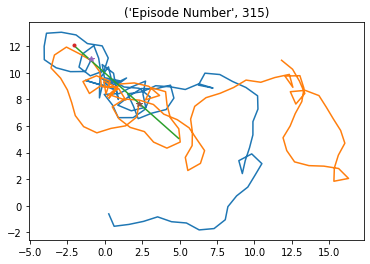

Episode * 316 * Avg Reward is ==> 2541.2155099105444 : Ag1 Reward ==> 1267.1948949988537 : Ag2 Reward ==> 1352.8979891094946 


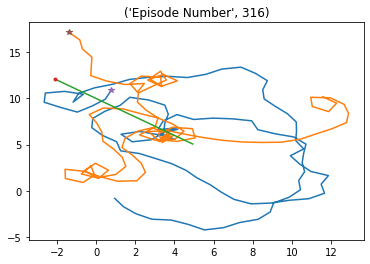

Episode * 317 * Avg Reward is ==> 2541.9379155910783 : Ag1 Reward ==> 1488.2416254384068 : Ag2 Reward ==> 976.5590065600587 


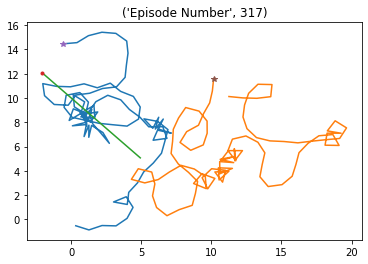

Episode * 318 * Avg Reward is ==> 2547.332197399529 : Ag1 Reward ==> 1543.6277631404992 : Ag2 Reward ==> 1243.6643485814204 


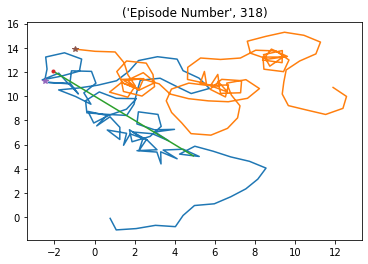

Episode * 319 * Avg Reward is ==> 2538.8098686655903 : Ag1 Reward ==> 1204.9659113262242 : Ag2 Reward ==> 1001.4511099486181 


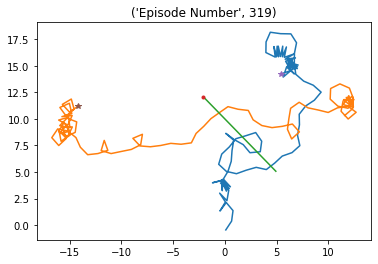

Episode * 320 * Avg Reward is ==> 2545.1613782312975 : Ag1 Reward ==> 1552.1791192953083 : Ag2 Reward ==> 1266.435803579051 


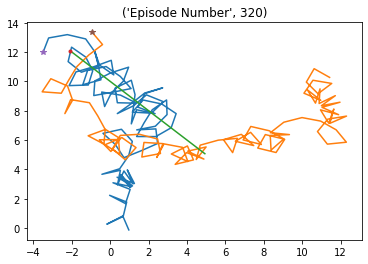

Episode * 321 * Avg Reward is ==> 2556.4051347917607 : Ag1 Reward ==> 1581.5061509371299 : Ag2 Reward ==> 1359.8115479074793 


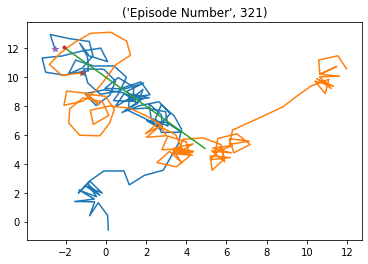

Episode * 322 * Avg Reward is ==> 2556.417159131255 : Ag1 Reward ==> 1452.119161100838 : Ag2 Reward ==> 1046.4344369403461 


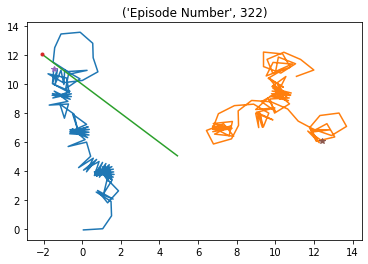

Episode * 323 * Avg Reward is ==> 2552.2451001062227 : Ag1 Reward ==> 1484.3463328159055 : Ag2 Reward ==> 880.8941701299568 


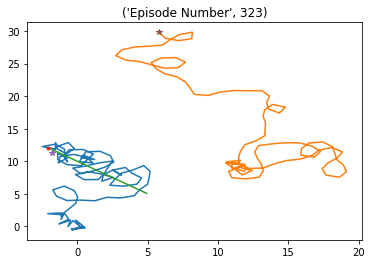

Episode * 324 * Avg Reward is ==> 2546.660578947608 : Ag1 Reward ==> 1332.4260553926783 : Ag2 Reward ==> 838.8565650414436 


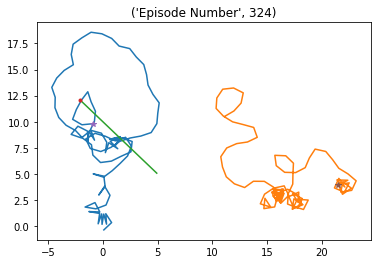

Episode * 325 * Avg Reward is ==> 2562.1553709867003 : Ag1 Reward ==> 1469.6489284095503 : Ag2 Reward ==> 1300.7600702819266 


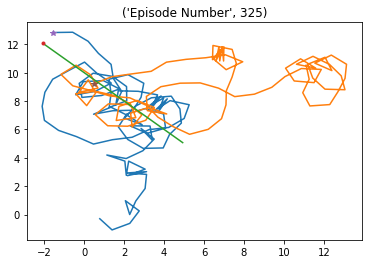

Episode * 326 * Avg Reward is ==> 2566.1293712148163 : Ag1 Reward ==> 1489.7877961174474 : Ag2 Reward ==> 1147.2475806319612 


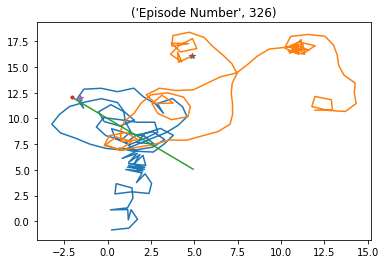

Episode * 327 * Avg Reward is ==> 2580.9582735140516 : Ag1 Reward ==> 1516.497947672023 : Ag2 Reward ==> 1420.7023768702472 


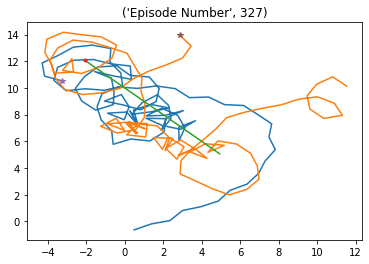

Episode * 328 * Avg Reward is ==> 2588.7590398751513 : Ag1 Reward ==> 1541.4603229810557 : Ag2 Reward ==> 1296.7153558660698 


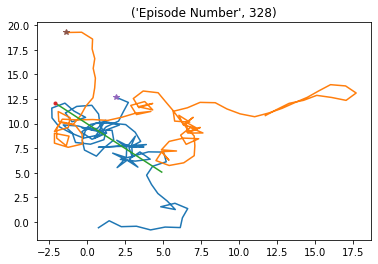

Episode * 329 * Avg Reward is ==> 2591.7498041629515 : Ag1 Reward ==> 1553.6793315828534 : Ag2 Reward ==> 1431.294778049653 


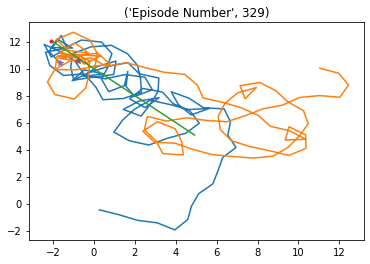

Episode * 330 * Avg Reward is ==> 2589.452280314637 : Ag1 Reward ==> 1434.7615265188347 : Ag2 Reward ==> 1139.609678904719 


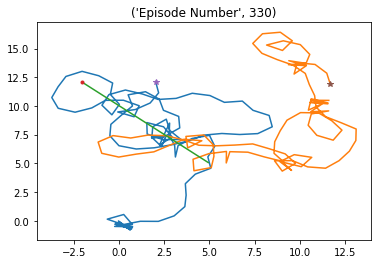

Episode * 331 * Avg Reward is ==> 2589.5524784155637 : Ag1 Reward ==> 1345.2385571055902 : Ag2 Reward ==> 1081.542191208767 


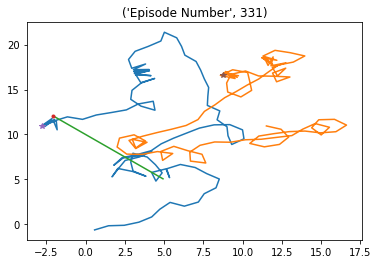

Episode * 332 * Avg Reward is ==> 2583.5380167929834 : Ag1 Reward ==> 1413.8037384149018 : Ag2 Reward ==> 1087.8437902162798 


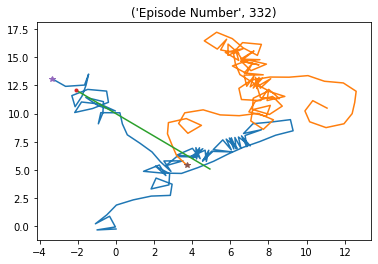

Episode * 333 * Avg Reward is ==> 2590.923725393368 : Ag1 Reward ==> 1543.0705743499234 : Ag2 Reward ==> 1382.4042879698134 


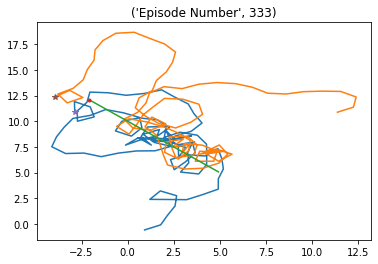

Episode * 334 * Avg Reward is ==> 2601.6926293722618 : Ag1 Reward ==> 1644.3758774754913 : Ag2 Reward ==> 1097.68329212945 


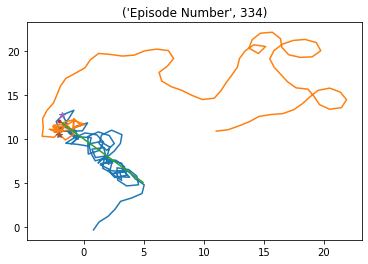

Episode * 335 * Avg Reward is ==> 2598.7090578604284 : Ag1 Reward ==> 1443.125151470248 : Ag2 Reward ==> 1199.7654767049496 


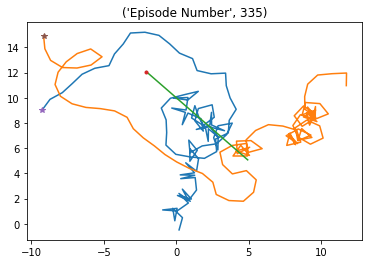

Episode * 336 * Avg Reward is ==> 2609.4193006177093 : Ag1 Reward ==> 1579.037910601514 : Ag2 Reward ==> 1100.727758615569 


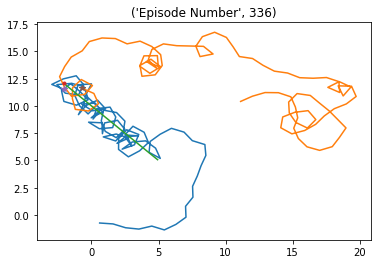

Episode * 337 * Avg Reward is ==> 2610.240192986718 : Ag1 Reward ==> 1538.9644146296912 : Ag2 Reward ==> 1322.9897677220404 


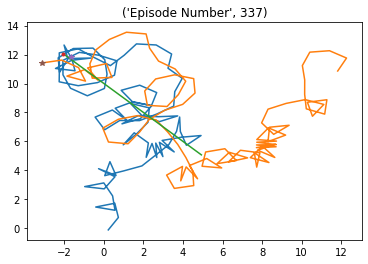

Episode * 338 * Avg Reward is ==> 2625.2738651077007 : Ag1 Reward ==> 1586.6836010811073 : Ag2 Reward ==> 1422.1154108631245 


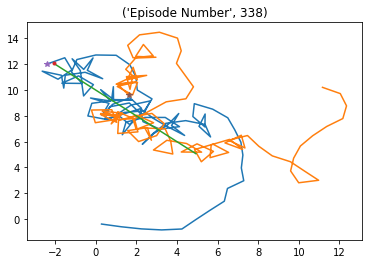

Episode * 339 * Avg Reward is ==> 2626.9446354495544 : Ag1 Reward ==> 1511.222824077533 : Ag2 Reward ==> 1368.847497944379 


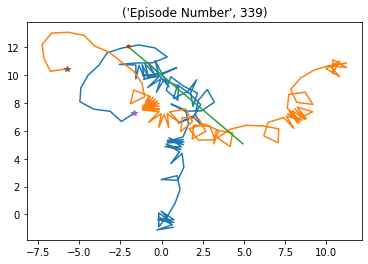

Episode * 340 * Avg Reward is ==> 2647.944552965336 : Ag1 Reward ==> 1635.2837179716616 : Ag2 Reward ==> 1451.1965997710297 


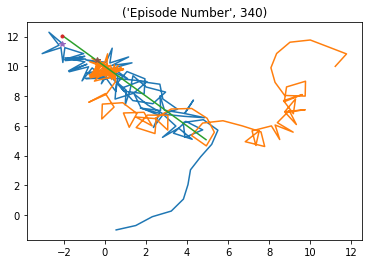

Episode * 341 * Avg Reward is ==> 2642.4611292010404 : Ag1 Reward ==> 1483.4553951884398 : Ag2 Reward ==> 905.7488647634109 


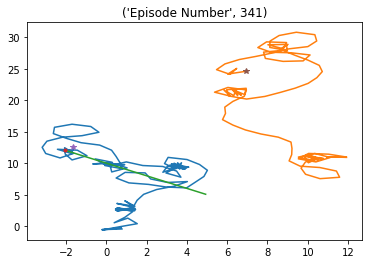

Episode * 342 * Avg Reward is ==> 2646.443487132853 : Ag1 Reward ==> 1528.913996575996 : Ag2 Reward ==> 1326.9707690350695 


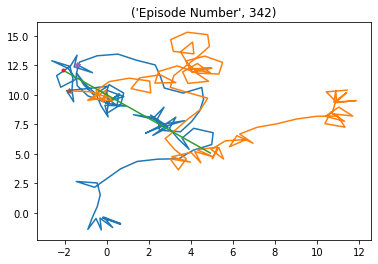

Episode * 343 * Avg Reward is ==> 2641.2150016319792 : Ag1 Reward ==> 1310.9131737116986 : Ag2 Reward ==> 1307.7129062726078 


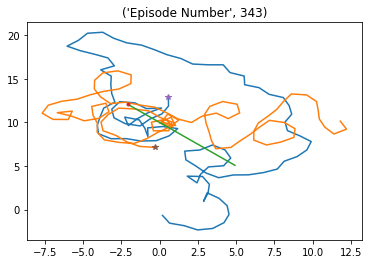

Episode * 344 * Avg Reward is ==> 2649.6991770626623 : Ag1 Reward ==> 1400.2386691508502 : Ag2 Reward ==> 1248.0145088784705 


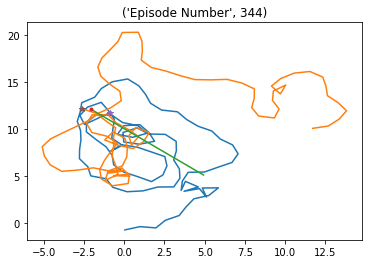

Episode * 345 * Avg Reward is ==> 2654.7674951581293 : Ag1 Reward ==> 1532.8065137424664 : Ag2 Reward ==> 1347.6134863558832 


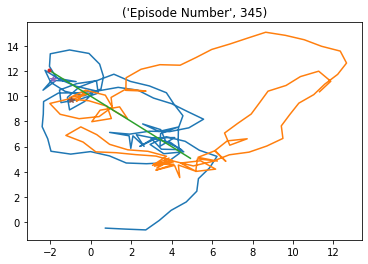

Episode * 346 * Avg Reward is ==> 2667.4172519413755 : Ag1 Reward ==> 1459.1165115380627 : Ag2 Reward ==> 1158.483161596916 


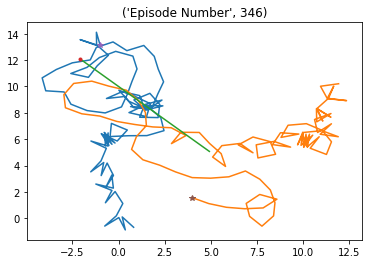

Episode * 347 * Avg Reward is ==> 2661.0538782909553 : Ag1 Reward ==> 1367.4337550394926 : Ag2 Reward ==> 1058.6070093070045 


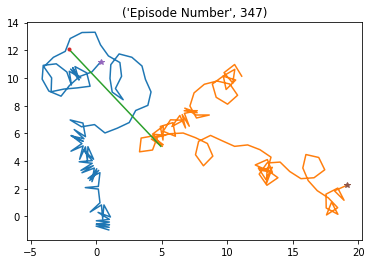

Episode * 348 * Avg Reward is ==> 2662.2559022371465 : Ag1 Reward ==> 1567.6127173632938 : Ag2 Reward ==> 1051.9730162476424 


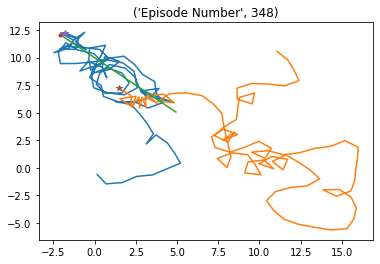

Episode * 349 * Avg Reward is ==> 2677.168366702187 : Ag1 Reward ==> 1560.2821367205004 : Ag2 Reward ==> 1511.299726047307 


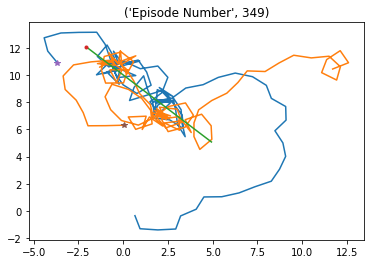

Episode * 350 * Avg Reward is ==> 2678.046025673403 : Ag1 Reward ==> 1564.1233912793818 : Ag2 Reward ==> 1335.5404120251642 


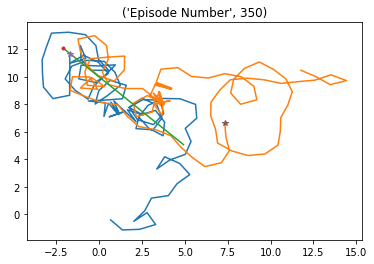

Episode * 351 * Avg Reward is ==> 2681.0582340742103 : Ag1 Reward ==> 1591.0295685958017 : Ag2 Reward ==> 1003.8235952096737 


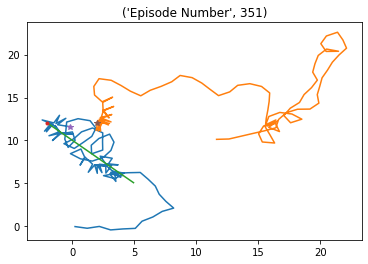

Episode * 352 * Avg Reward is ==> 2685.1572402595752 : Ag1 Reward ==> 1508.918626255347 : Ag2 Reward ==> 1213.369199038172 


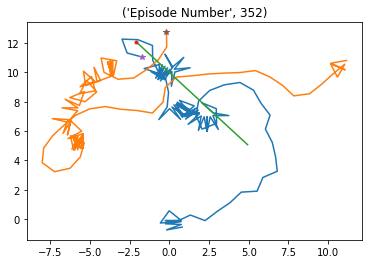

Episode * 353 * Avg Reward is ==> 2704.4091853636833 : Ag1 Reward ==> 1571.532194158357 : Ag2 Reward ==> 1484.5877997480034 


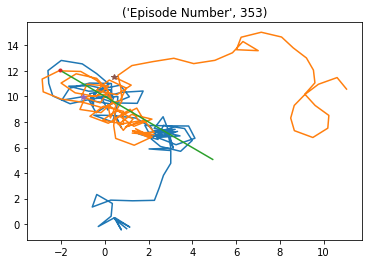

Episode * 354 * Avg Reward is ==> 2695.4562246719843 : Ag1 Reward ==> 1302.3854938556747 : Ag2 Reward ==> 977.8517984106365 


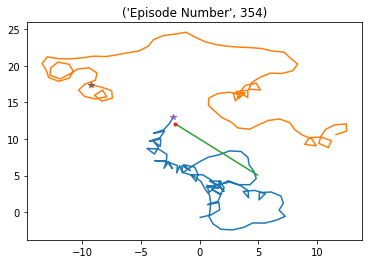

Episode * 355 * Avg Reward is ==> 2686.6025509212295 : Ag1 Reward ==> 1523.5289879375691 : Ag2 Reward ==> 888.5145263471843 


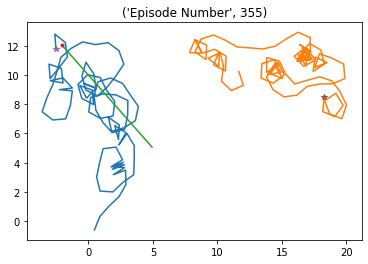

Episode * 356 * Avg Reward is ==> 2676.4880379798683 : Ag1 Reward ==> 1338.2856329253311 : Ag2 Reward ==> 877.2267335285655 


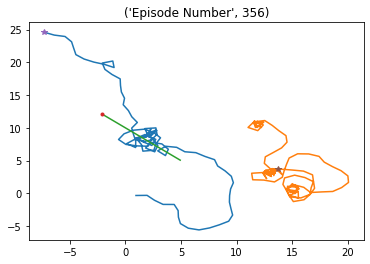

Episode * 357 * Avg Reward is ==> 2657.5708449699755 : Ag1 Reward ==> 638.5219781556722 : Ag2 Reward ==> 1069.5909334470757 


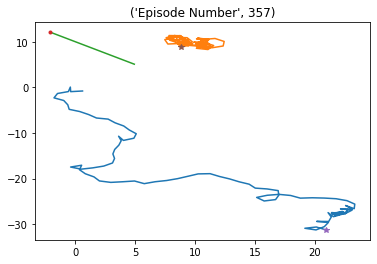

Episode * 358 * Avg Reward is ==> 2645.659435158192 : Ag1 Reward ==> 1558.9367097732677 : Ag2 Reward ==> 751.8990094773138 


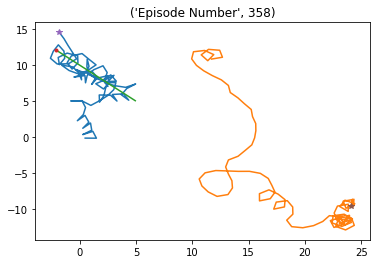

Episode * 359 * Avg Reward is ==> 2632.1490666665695 : Ag1 Reward ==> 642.8757211197561 : Ag2 Reward ==> 1023.1265604901988 


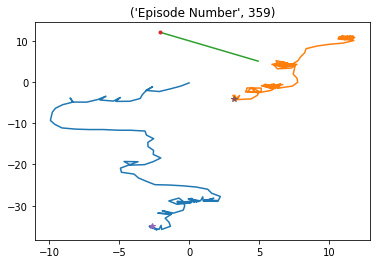

Episode * 360 * Avg Reward is ==> 2611.3794455426673 : Ag1 Reward ==> 674.6927115841652 : Ag2 Reward ==> 1313.1373663340942 


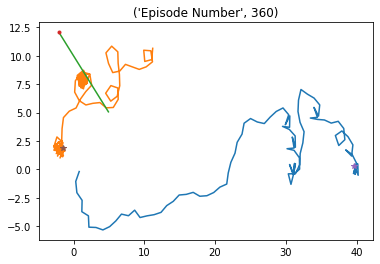

Episode * 361 * Avg Reward is ==> 2583.6024769825635 : Ag1 Reward ==> 933.8168520596464 : Ag2 Reward ==> 896.4221043808075 


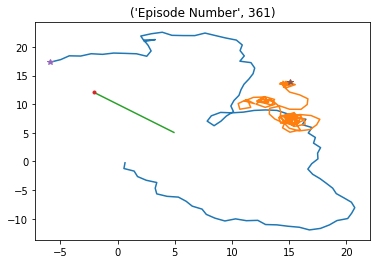

Episode * 362 * Avg Reward is ==> 2580.071796365633 : Ag1 Reward ==> 1350.2231173325363 : Ag2 Reward ==> 1007.1032560314228 


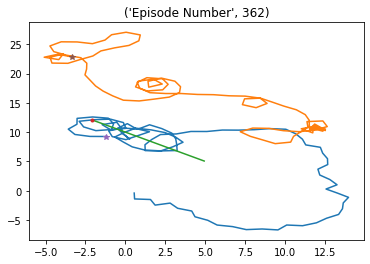

Episode * 363 * Avg Reward is ==> 2577.254229503118 : Ag1 Reward ==> 1158.0861362012727 : Ag2 Reward ==> 1094.451692243989 


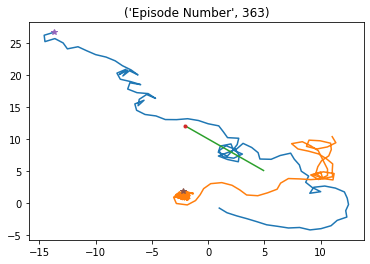

Episode * 364 * Avg Reward is ==> 2571.3836970675934 : Ag1 Reward ==> 1112.1432119066153 : Ag2 Reward ==> 824.3181111065273 


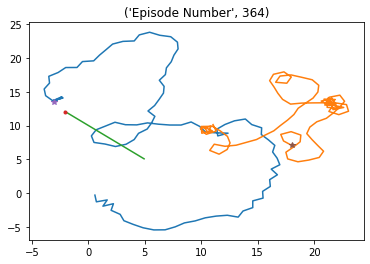

Episode * 365 * Avg Reward is ==> 2549.4156006980666 : Ag1 Reward ==> 947.969890645535 : Ag2 Reward ==> 943.7152532648741 


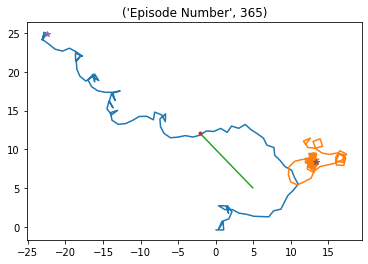

Episode * 366 * Avg Reward is ==> 2523.4609831997163 : Ag1 Reward ==> 666.3574107857524 : Ag2 Reward ==> 932.49326602965 


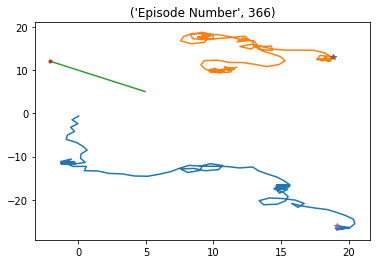

Episode * 367 * Avg Reward is ==> 2500.500837384311 : Ag1 Reward ==> 1125.4306946785443 : Ag2 Reward ==> 893.3637972474983 


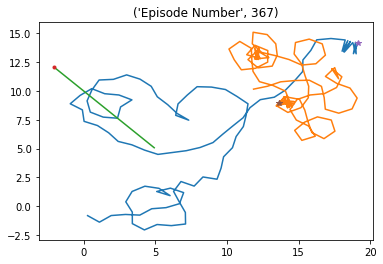

Episode * 368 * Avg Reward is ==> 2475.585267573691 : Ag1 Reward ==> 950.0782207126666 : Ag2 Reward ==> 891.474665709669 


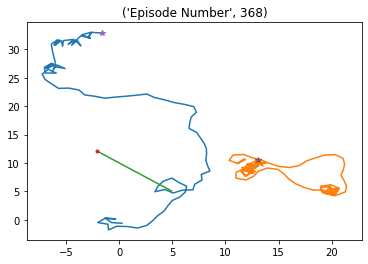

Episode * 369 * Avg Reward is ==> 2444.7722628325164 : Ag1 Reward ==> 691.4550857086253 : Ag2 Reward ==> 1060.9988342768836 


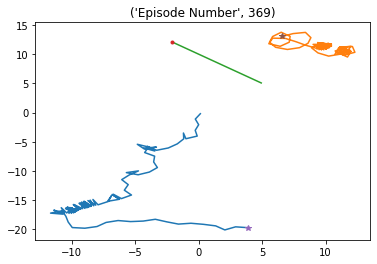

Episode * 370 * Avg Reward is ==> 2439.0899634196003 : Ag1 Reward ==> 1398.8053915427354 : Ag2 Reward ==> 948.2738373641979 


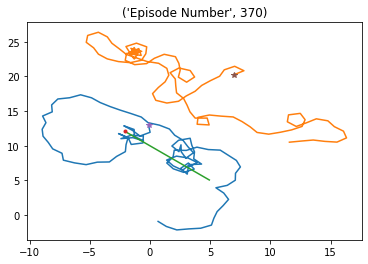

Episode * 371 * Avg Reward is ==> 2436.593553293097 : Ag1 Reward ==> 1366.6350961321677 : Ag2 Reward ==> 960.2892471220359 


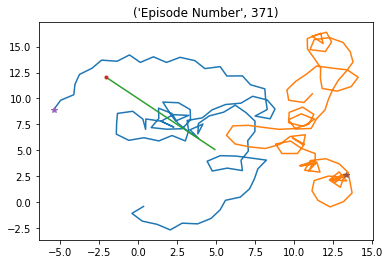

Episode * 372 * Avg Reward is ==> 2415.525471394795 : Ag1 Reward ==> 678.0355404575652 : Ag2 Reward ==> 980.8887122415346 


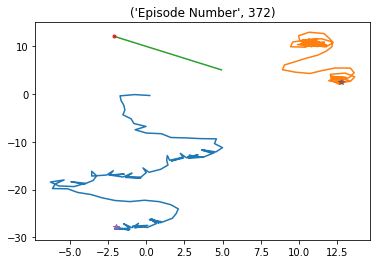

Episode * 373 * Avg Reward is ==> 2414.4272090716618 : Ag1 Reward ==> 1528.8477203871807 : Ag2 Reward ==> 1352.696649007236 


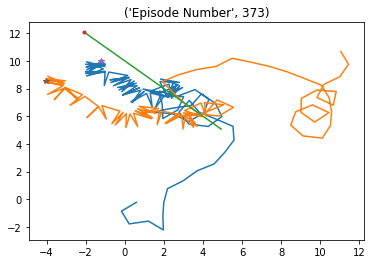

Episode * 374 * Avg Reward is ==> 2421.550129277438 : Ag1 Reward ==> 1537.9944716316854 : Ag2 Reward ==> 1488.9815062042976 


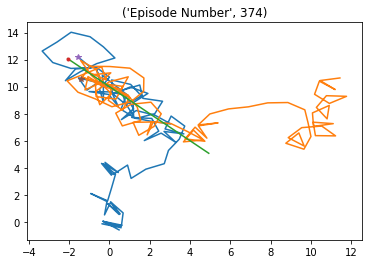

Episode * 375 * Avg Reward is ==> 2431.1898300476364 : Ag1 Reward ==> 1546.6674038207148 : Ag2 Reward ==> 1481.811255162435 


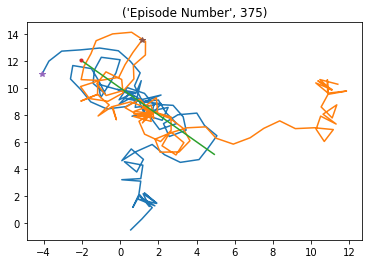

Episode * 376 * Avg Reward is ==> 2438.7692832092202 : Ag1 Reward ==> 1588.1738318647251 : Ag2 Reward ==> 1394.7699638156885 


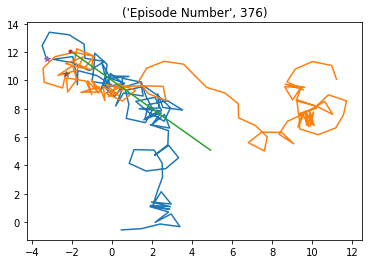

Episode * 377 * Avg Reward is ==> 2431.0845378306594 : Ag1 Reward ==> 1364.8121236262512 : Ag2 Reward ==> 1189.75224358306 


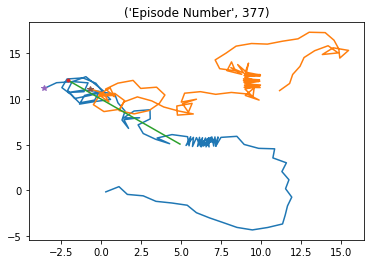

Episode * 378 * Avg Reward is ==> 2427.6212512313027 : Ag1 Reward ==> 1519.1500088218327 : Ag2 Reward ==> 1351.1175391481304 


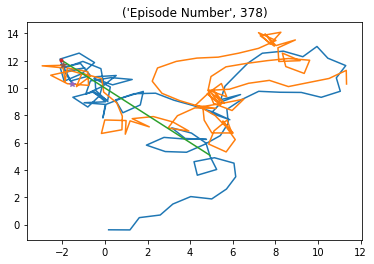

Episode * 379 * Avg Reward is ==> 2434.3715739438953 : Ag1 Reward ==> 1622.1765153292426 : Ag2 Reward ==> 1527.9067151963734 


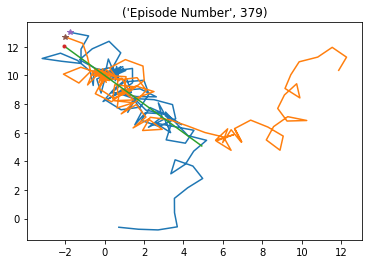

Episode * 380 * Avg Reward is ==> 2428.473167831261 : Ag1 Reward ==> 1451.182392885861 : Ag2 Reward ==> 1399.36168035145 


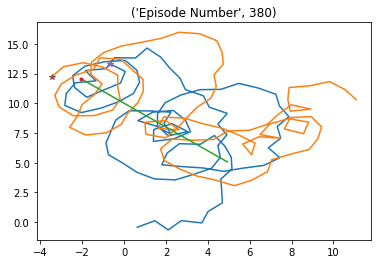

Episode * 381 * Avg Reward is ==> 2428.8554142094545 : Ag1 Reward ==> 1364.160004859189 : Ag2 Reward ==> 1040.3341102203926 


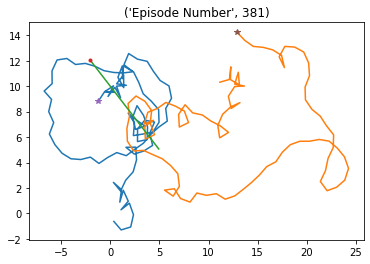

Episode * 382 * Avg Reward is ==> 2393.68085242982 : Ag1 Reward ==> 686.1044892878705 : Ag2 Reward ==> 762.797805137802 


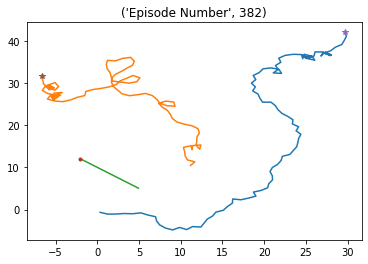

Episode * 383 * Avg Reward is ==> 2387.749289505357 : Ag1 Reward ==> 1357.6698786046381 : Ag2 Reward ==> 1023.693684401164 


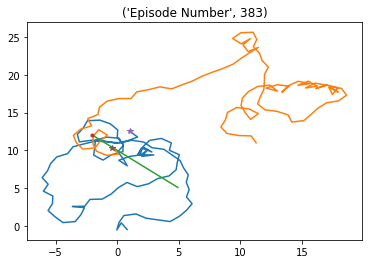

Episode * 384 * Avg Reward is ==> 2391.856802744081 : Ag1 Reward ==> 1578.7676401910874 : Ag2 Reward ==> 1233.7860673872021 


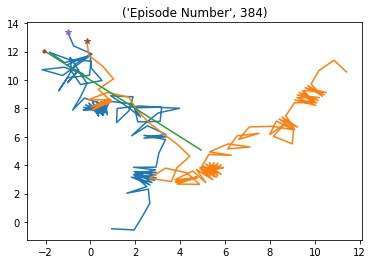

Episode * 385 * Avg Reward is ==> 2400.136826235125 : Ag1 Reward ==> 1611.9243158971108 : Ag2 Reward ==> 1599.6966238429898 


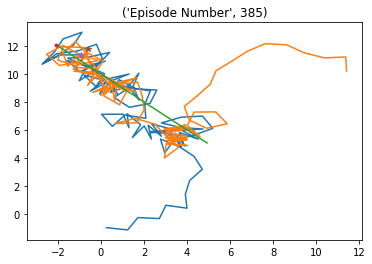

Episode * 386 * Avg Reward is ==> 2410.9845374650163 : Ag1 Reward ==> 1564.2390152916105 : Ag2 Reward ==> 1487.269107039009 


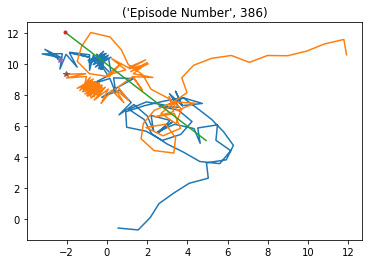

Episode * 387 * Avg Reward is ==> 2428.4067632479746 : Ag1 Reward ==> 1588.0545551626153 : Ag2 Reward ==> 1534.8752405022394 


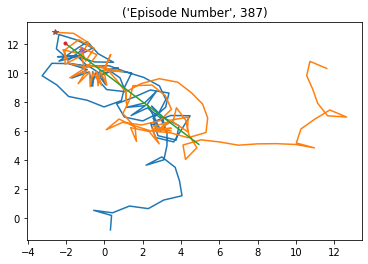

Episode * 388 * Avg Reward is ==> 2441.5808123395755 : Ag1 Reward ==> 1598.157037483786 : Ag2 Reward ==> 1548.3906597911766 


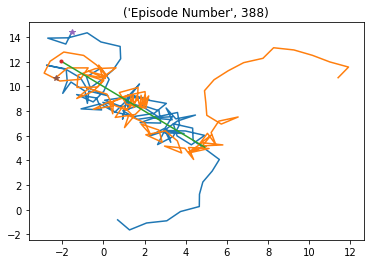

Episode * 389 * Avg Reward is ==> 2439.68718614089 : Ag1 Reward ==> 1539.8893403455359 : Ag2 Reward ==> 1455.9474744748495 


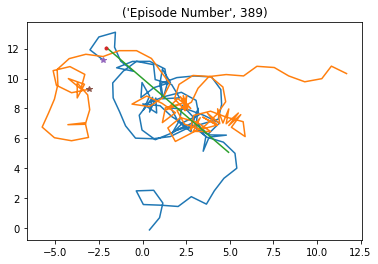

Episode * 390 * Avg Reward is ==> 2447.499660176044 : Ag1 Reward ==> 1610.8783706083577 : Ag2 Reward ==> 1601.2843941023516 


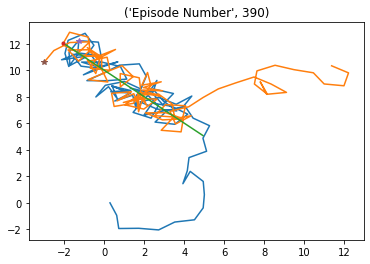

Episode * 391 * Avg Reward is ==> 2458.495718884809 : Ag1 Reward ==> 1549.0750999108084 : Ag2 Reward ==> 1485.6204122452693 


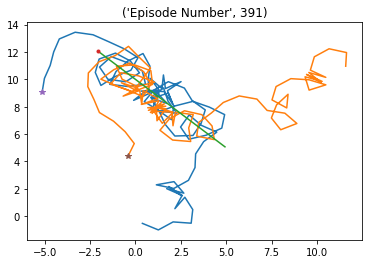

Episode * 392 * Avg Reward is ==> 2461.2487118377685 : Ag1 Reward ==> 1483.3080435534528 : Ag2 Reward ==> 1349.0994998584288 


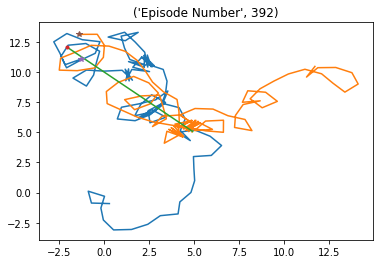

Episode * 393 * Avg Reward is ==> 2458.319670317287 : Ag1 Reward ==> 1544.3623565935343 : Ag2 Reward ==> 1394.5959764935901 


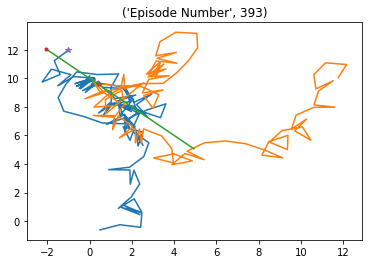

Episode * 394 * Avg Reward is ==> 2479.2170704797254 : Ag1 Reward ==> 1603.091878345753 : Ag2 Reward ==> 1513.0414204180895 


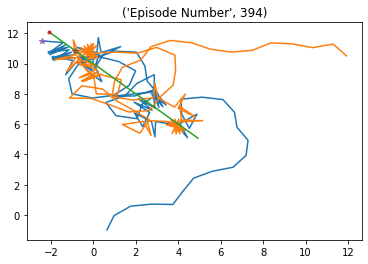

Episode * 395 * Avg Reward is ==> 2490.998952712883 : Ag1 Reward ==> 1501.534413620342 : Ag2 Reward ==> 1381.7843899907061 


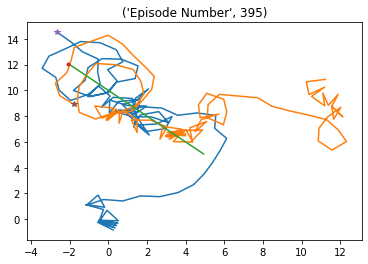

Episode * 396 * Avg Reward is ==> 2515.138383703868 : Ag1 Reward ==> 1676.2192284646005 : Ag2 Reward ==> 1504.8703776286834 


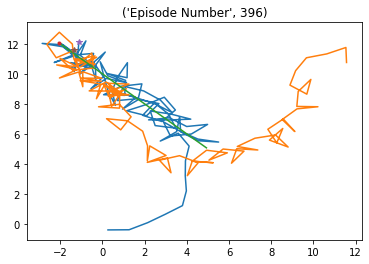

Episode * 397 * Avg Reward is ==> 2537.294053009498 : Ag1 Reward ==> 1432.3447664041594 : Ag2 Reward ==> 1161.9949174238138 


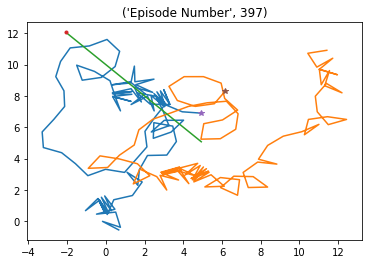

Episode * 398 * Avg Reward is ==> 2555.9094734736404 : Ag1 Reward ==> 1610.9849335221777 : Ag2 Reward ==> 1444.4676042941005 


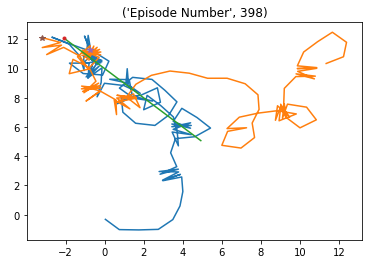

Episode * 399 * Avg Reward is ==> 2588.9783774850102 : Ag1 Reward ==> 1506.9702613777417 : Ag2 Reward ==> 1481.7881806869962 


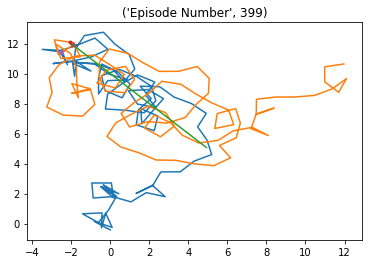

Episode * 400 * Avg Reward is ==> 2615.8107404262423 : Ag1 Reward ==> 1642.9610945758761 : Ag2 Reward ==> 1418.1635009916731 


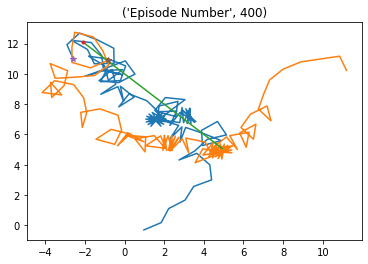

Episode * 401 * Avg Reward is ==> 2641.6900877175185 : Ag1 Reward ==> 1569.6415950719925 : Ag2 Reward ==> 1295.771253019498 


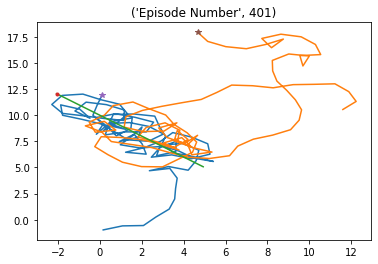

Episode * 402 * Avg Reward is ==> 2655.403468569889 : Ag1 Reward ==> 1548.4982771375376 : Ag2 Reward ==> 1357.3633303212353 


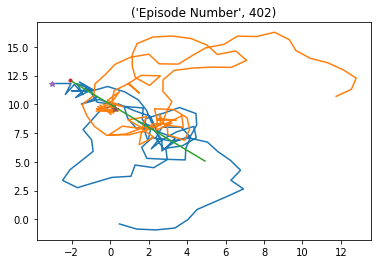

Episode * 403 * Avg Reward is ==> 2639.9615630121248 : Ag1 Reward ==> 714.2931799899418 : Ag2 Reward ==> 920.5684261447516 


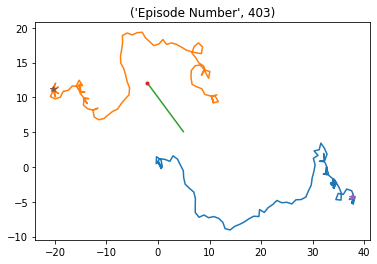

Episode * 404 * Avg Reward is ==> 2668.868390299643 : Ag1 Reward ==> 1549.6452704546284 : Ag2 Reward ==> 1543.0891440592575 


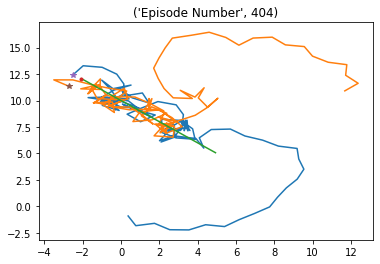

Episode * 405 * Avg Reward is ==> 2688.7385850483743 : Ag1 Reward ==> 1538.0147260654398 : Ag2 Reward ==> 1148.4782077942004 


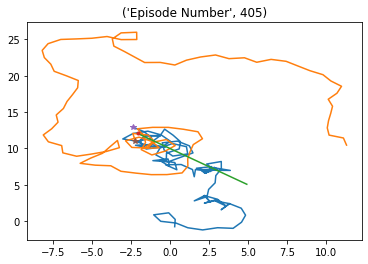

Episode * 406 * Avg Reward is ==> 2723.2844356749206 : Ag1 Reward ==> 1501.790640133678 : Ag2 Reward ==> 1478.894061743583 


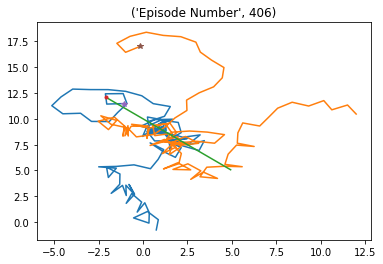

Episode * 407 * Avg Reward is ==> 2742.9502660898224 : Ag1 Reward ==> 1435.9291129204926 : Ag2 Reward ==> 1369.4985956016326 


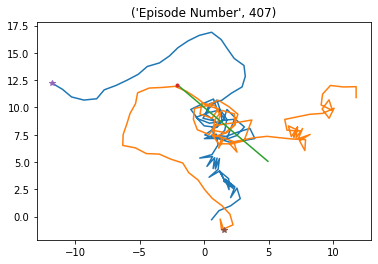

Episode * 408 * Avg Reward is ==> 2770.461965952817 : Ag1 Reward ==> 1495.2058315629927 : Ag2 Reward ==> 1446.8150493791452 


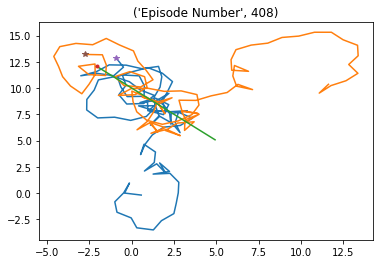

Episode * 409 * Avg Reward is ==> 2807.027824330954 : Ag1 Reward ==> 1634.972439154165 : Ag2 Reward ==> 1580.1158159568274 


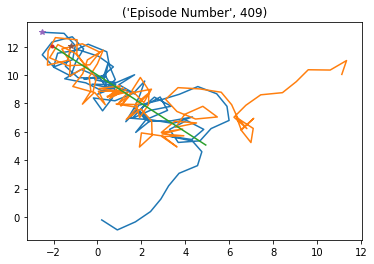

Episode * 410 * Avg Reward is ==> 2821.182578329737 : Ag1 Reward ==> 1536.8805462949047 : Ag2 Reward ==> 1376.3888425633377 


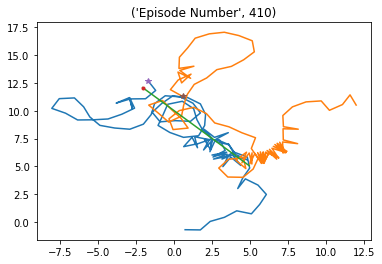

Episode * 411 * Avg Reward is ==> 2831.3036655590345 : Ag1 Reward ==> 1511.780217167276 : Ag2 Reward ==> 1219.9876152588133 


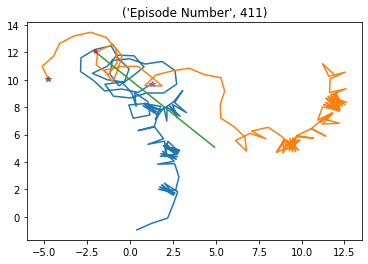

Episode * 412 * Avg Reward is ==> 2865.2313091330334 : Ag1 Reward ==> 1510.05480202282 : Ag2 Reward ==> 1505.9751936362304 


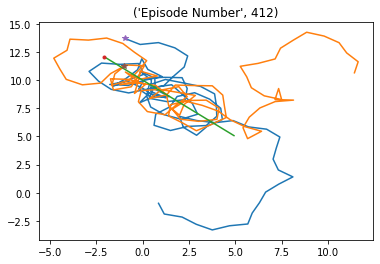

Episode * 413 * Avg Reward is ==> 2870.9141090201592 : Ag1 Reward ==> 1572.873255647849 : Ag2 Reward ==> 1535.9831092316215 


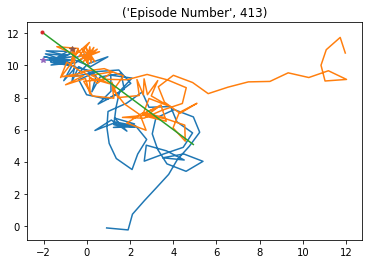

Episode * 414 * Avg Reward is ==> 2862.8076367648764 : Ag1 Reward ==> 1398.3846952580407 : Ag2 Reward ==> 1304.3323923666167 


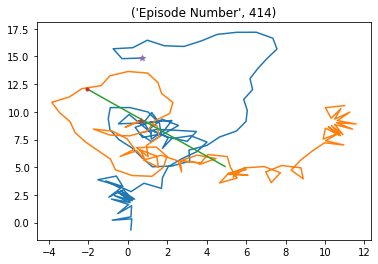

Episode * 415 * Avg Reward is ==> 2859.2509537797596 : Ag1 Reward ==> 1482.701458440157 : Ag2 Reward ==> 1403.5098811383316 


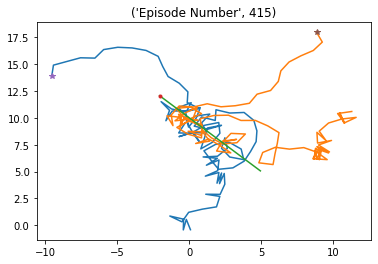

Episode * 416 * Avg Reward is ==> 2864.6005738516233 : Ag1 Reward ==> 1639.4859855770674 : Ag2 Reward ==> 1557.4426129778928 


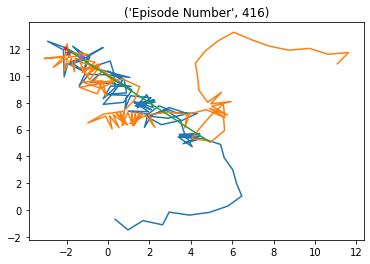

Episode * 417 * Avg Reward is ==> 2877.168097370771 : Ag1 Reward ==> 1613.4407433326899 : Ag2 Reward ==> 1443.824564642544 


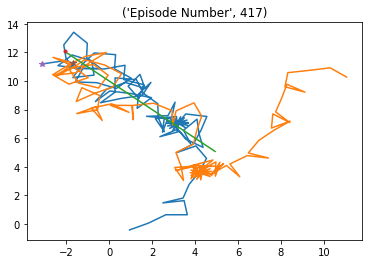

Episode * 418 * Avg Reward is ==> 2875.95750896152 : Ag1 Reward ==> 1540.9229143786542 : Ag2 Reward ==> 1280.9210972212666 


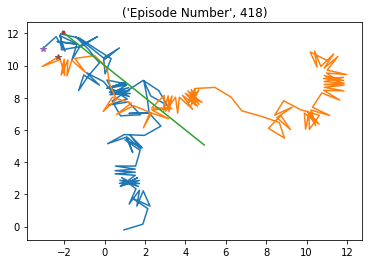

Episode * 419 * Avg Reward is ==> 2871.368443785495 : Ag1 Reward ==> 1522.2161737671017 : Ag2 Reward ==> 1444.3044497175129 


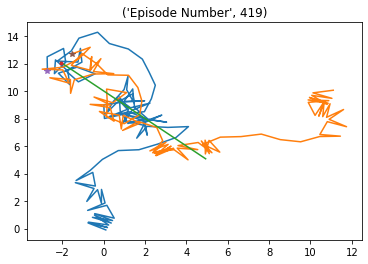

Episode * 420 * Avg Reward is ==> 2869.4024022567546 : Ag1 Reward ==> 1440.98177969367 : Ag2 Reward ==> 1330.920632394027 


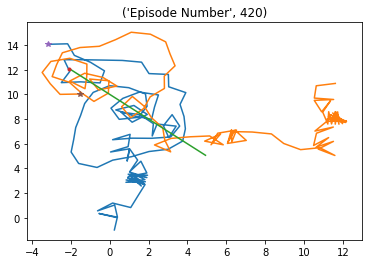

Episode * 421 * Avg Reward is ==> 2880.057166790843 : Ag1 Reward ==> 1599.9288661801068 : Ag2 Reward ==> 1230.7558302630075 


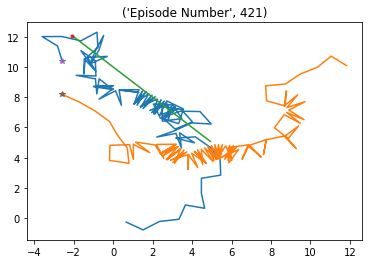

Episode * 422 * Avg Reward is ==> 2917.552200560595 : Ag1 Reward ==> 1542.0901283584044 : Ag2 Reward ==> 1406.6135168573303 


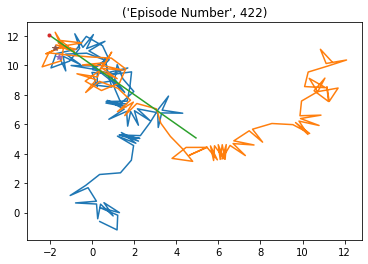

Episode * 423 * Avg Reward is ==> 2934.596279361112 : Ag1 Reward ==> 1545.9623167174316 : Ag2 Reward ==> 1517.1643983090646 


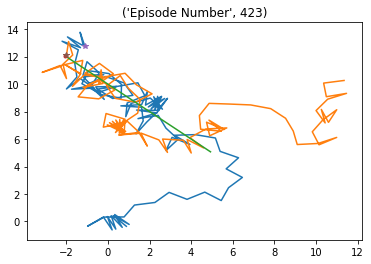

Episode * 424 * Avg Reward is ==> 2938.645789574516 : Ag1 Reward ==> 1631.264381705459 : Ag2 Reward ==> 1343.2697344089775 


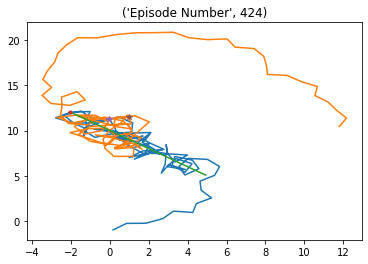

Episode * 425 * Avg Reward is ==> 2929.984985940983 : Ag1 Reward ==> 1521.9603576978418 : Ag2 Reward ==> 1343.22843670093 


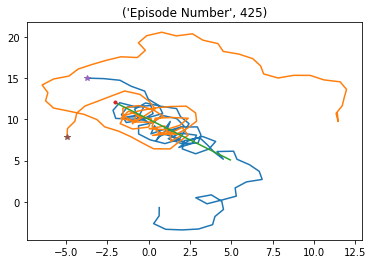

Episode * 426 * Avg Reward is ==> 2923.2187459087518 : Ag1 Reward ==> 1480.7497608973504 : Ag2 Reward ==> 1300.108760144027 


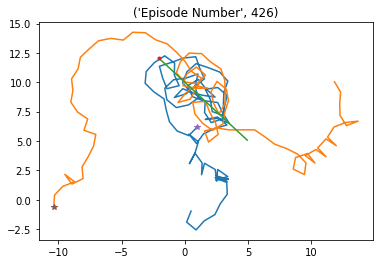

Episode * 427 * Avg Reward is ==> 2916.381846811174 : Ag1 Reward ==> 1518.1174109015117 : Ag2 Reward ==> 1331.3364208602165 


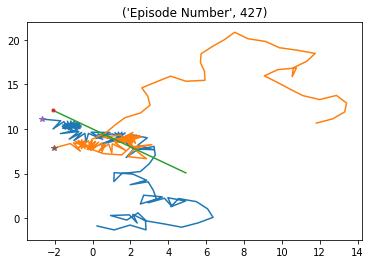

Episode * 428 * Avg Reward is ==> 2914.4459157237525 : Ag1 Reward ==> 1582.9435853640246 : Ag2 Reward ==> 1486.1668684140895 


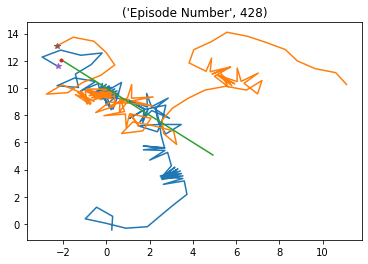

Episode * 429 * Avg Reward is ==> 2917.286352911642 : Ag1 Reward ==> 1600.3639516626008 : Ag2 Reward ==> 1509.0903506733646 


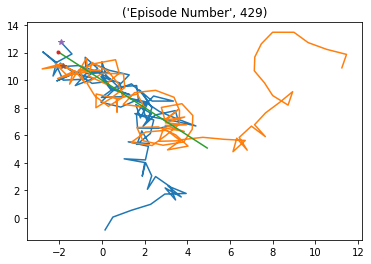

Episode * 430 * Avg Reward is ==> 2907.946150035847 : Ag1 Reward ==> 1470.3192706585191 : Ag2 Reward ==> 1368.2353790203806 


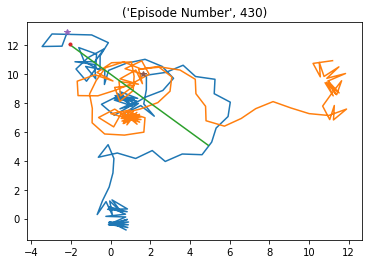

Episode * 431 * Avg Reward is ==> 2905.827166492903 : Ag1 Reward ==> 1459.8356808013007 : Ag2 Reward ==> 1490.10048963702 


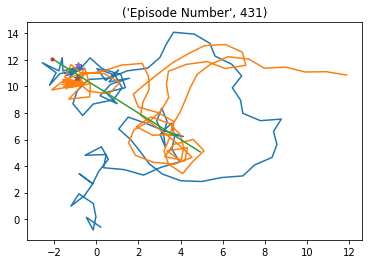

Episode * 432 * Avg Reward is ==> 2904.572400603514 : Ag1 Reward ==> 1404.920940300427 : Ag2 Reward ==> 1377.2959675358939 


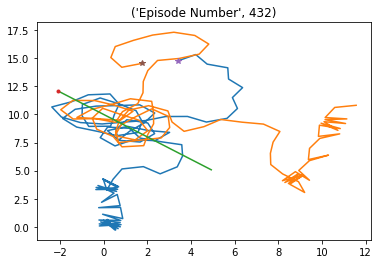

Episode * 433 * Avg Reward is ==> 2908.61221890796 : Ag1 Reward ==> 1571.9279522273423 : Ag2 Reward ==> 1528.6231130376354 


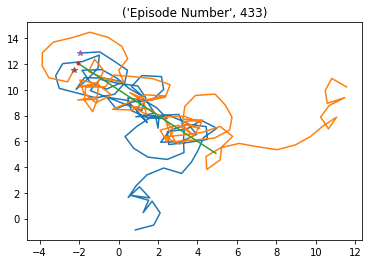

Episode * 434 * Avg Reward is ==> 2897.774472211719 : Ag1 Reward ==> 1326.3469314042754 : Ag2 Reward ==> 1356.2764995099244 


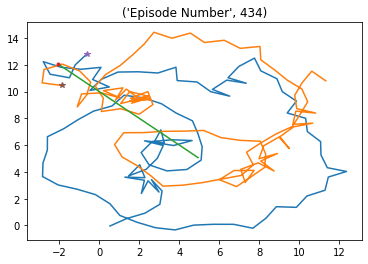

Episode * 435 * Avg Reward is ==> 2897.380825048983 : Ag1 Reward ==> 1560.8952123206766 : Ag2 Reward ==> 1306.6777047809248 


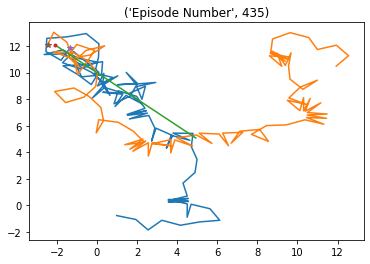

Episode * 436 * Avg Reward is ==> 2893.0047946312234 : Ag1 Reward ==> 1539.2773437788394 : Ag2 Reward ==> 1466.7710456040618 


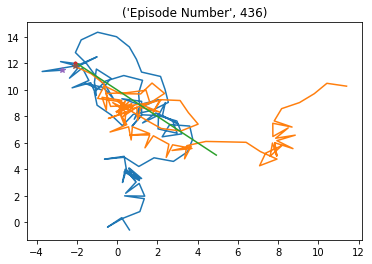

Episode * 437 * Avg Reward is ==> 2903.059166393912 : Ag1 Reward ==> 1471.3179489516947 : Ag2 Reward ==> 1525.1966053838437 


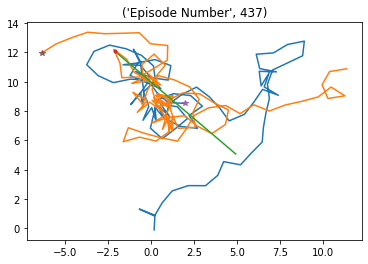

Episode * 438 * Avg Reward is ==> 2898.9384502320913 : Ag1 Reward ==> 1440.039286365027 : Ag2 Reward ==> 1450.5846049784172 


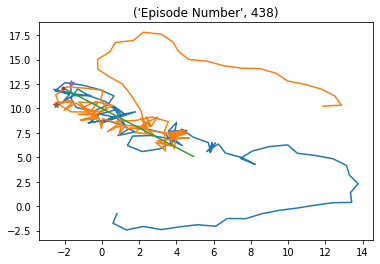

Episode * 439 * Avg Reward is ==> 2900.6887320642554 : Ag1 Reward ==> 1521.8775415618861 : Ag2 Reward ==> 1536.892173789414 


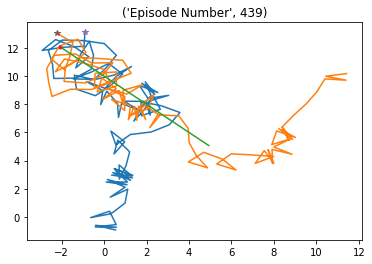

Episode * 440 * Avg Reward is ==> 2891.363411597379 : Ag1 Reward ==> 1391.9758851431116 : Ag2 Reward ==> 1296.135891749392 


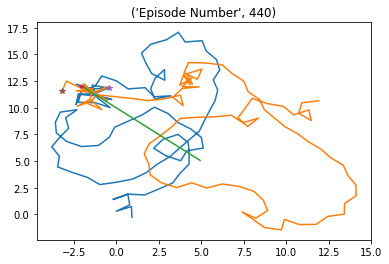

Episode * 441 * Avg Reward is ==> 2896.084763557878 : Ag1 Reward ==> 1514.7450294820396 : Ag2 Reward ==> 1539.5218970293906 


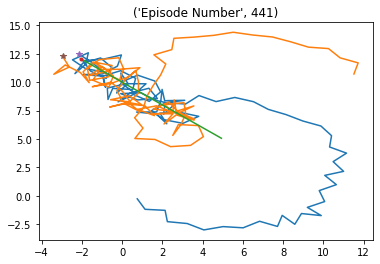

Episode * 442 * Avg Reward is ==> 2891.4349914911136 : Ag1 Reward ==> 1307.9947739680158 : Ag2 Reward ==> 1411.8759508202008 


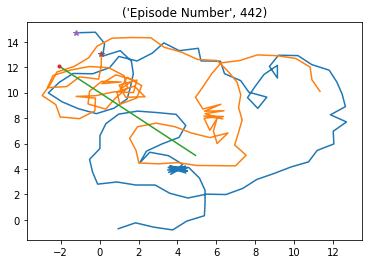

Episode * 443 * Avg Reward is ==> 2931.3632812016267 : Ag1 Reward ==> 1602.4630222574212 : Ag2 Reward ==> 1629.5301722977865 


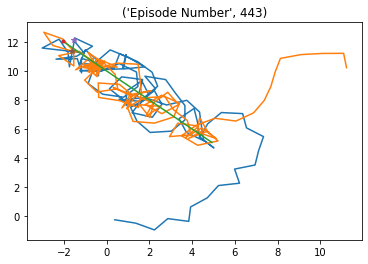

Episode * 444 * Avg Reward is ==> 2926.3866595726754 : Ag1 Reward ==> 1508.664383727248 : Ag2 Reward ==> 1385.0051656286025 


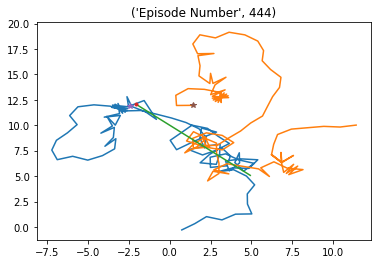

Episode * 445 * Avg Reward is ==> 2931.7042975898826 : Ag1 Reward ==> 1514.3737535130733 : Ag2 Reward ==> 1384.8247010348337 


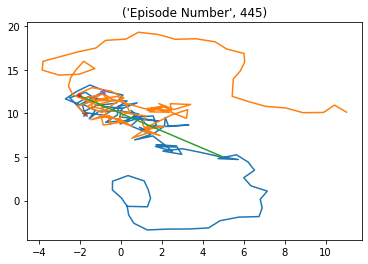

Episode * 446 * Avg Reward is ==> 2933.317619742228 : Ag1 Reward ==> 1524.1118845399726 : Ag2 Reward ==> 1521.105703431112 


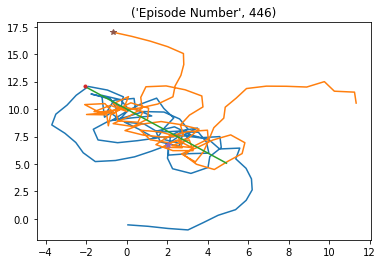

Episode * 447 * Avg Reward is ==> 2939.9572180487153 : Ag1 Reward ==> 1556.5406345243937 : Ag2 Reward ==> 1514.4710062572267 


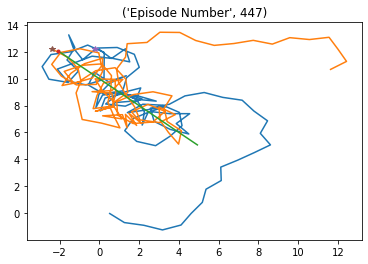

Episode * 448 * Avg Reward is ==> 2936.0063129335404 : Ag1 Reward ==> 1460.0755555194123 : Ag2 Reward ==> 1323.9091208157445 


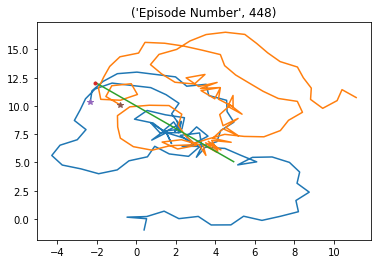

Episode * 449 * Avg Reward is ==> 2932.1171019598914 : Ag1 Reward ==> 1558.894257303607 : Ag2 Reward ==> 1500.625558861408 


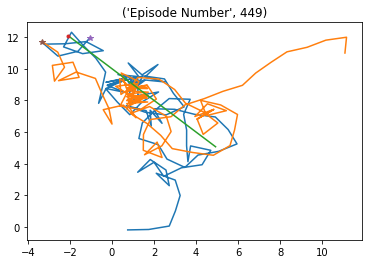

Episode * 450 * Avg Reward is ==> 2935.3688342447467 : Ag1 Reward ==> 1534.9473863305225 : Ag2 Reward ==> 1508.3912939219217 


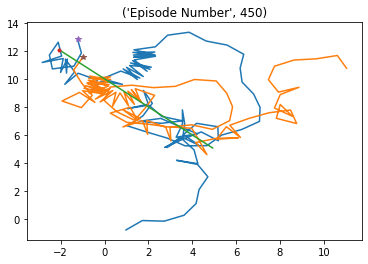

Episode * 451 * Avg Reward is ==> 2942.4101612012955 : Ag1 Reward ==> 1542.1098557633823 : Ag2 Reward ==> 1471.3110549246746 


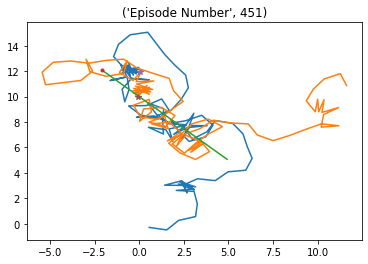

Episode * 452 * Avg Reward is ==> 2944.007702802922 : Ag1 Reward ==> 1549.9912156100754 : Ag2 Reward ==> 1529.9404441140312 


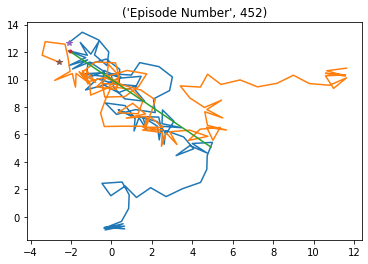

Episode * 453 * Avg Reward is ==> 2924.505395632075 : Ag1 Reward ==> 1188.6625393959641 : Ag2 Reward ==> 1140.1015386496056 


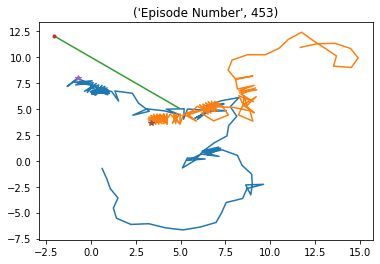

Episode * 454 * Avg Reward is ==> 2935.2332938844584 : Ag1 Reward ==> 1582.1709877929266 : Ag2 Reward ==> 1549.6620299270849 


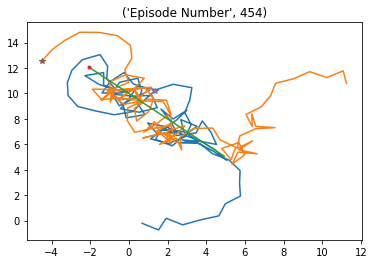

Episode * 455 * Avg Reward is ==> 2942.7327387963705 : Ag1 Reward ==> 1577.6672281280964 : Ag2 Reward ==> 1608.5219079268647 


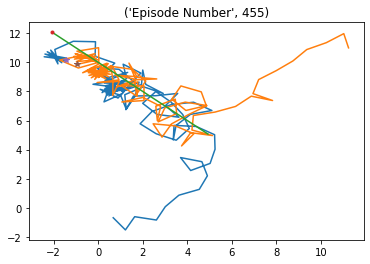

Episode * 456 * Avg Reward is ==> 2939.9954412953152 : Ag1 Reward ==> 1548.854098562731 : Ag2 Reward ==> 1538.5825999500362 


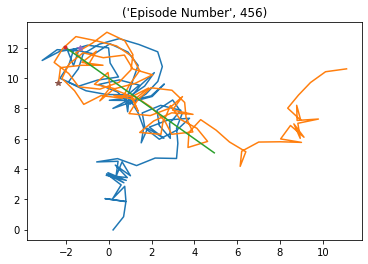

Episode * 457 * Avg Reward is ==> 2937.6752994280273 : Ag1 Reward ==> 1544.316565816777 : Ag2 Reward ==> 1420.1430674669205 


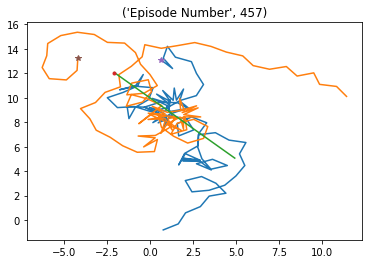

Episode * 458 * Avg Reward is ==> 2943.5508876529047 : Ag1 Reward ==> 1545.3605751019727 : Ag2 Reward ==> 1511.5069654930514 


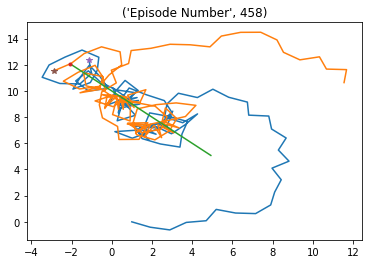

Episode * 459 * Avg Reward is ==> 2947.9256754472253 : Ag1 Reward ==> 1619.9446698331317 : Ag2 Reward ==> 1521.5674654243185 


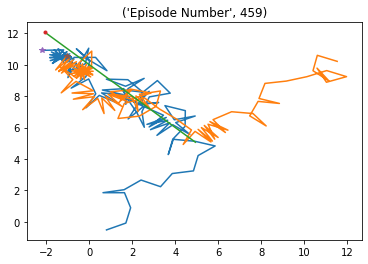

Episode * 460 * Avg Reward is ==> 2955.9850036498724 : Ag1 Reward ==> 1567.651912429744 : Ag2 Reward ==> 1526.6236277638259 


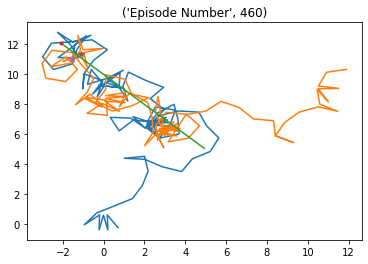

Episode * 461 * Avg Reward is ==> 2962.954544004914 : Ag1 Reward ==> 1567.4943630001121 : Ag2 Reward ==> 1541.9719476446792 


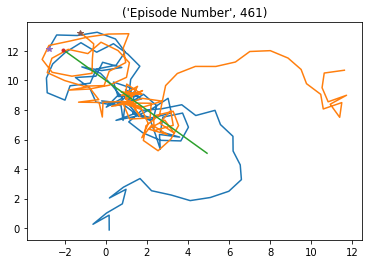

Episode * 462 * Avg Reward is ==> 2970.2024436950182 : Ag1 Reward ==> 1638.9463577478566 : Ag2 Reward ==> 1599.6732750720419 


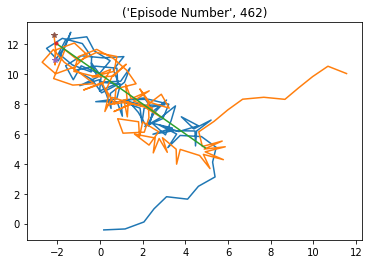

Episode * 463 * Avg Reward is ==> 2972.604759799973 : Ag1 Reward ==> 1581.5855630227325 : Ag2 Reward ==> 1577.6337962019627 


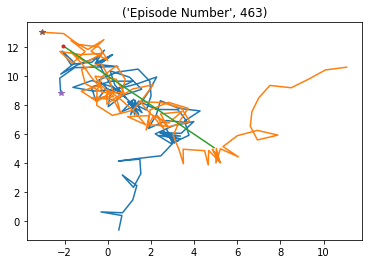

Episode * 464 * Avg Reward is ==> 2972.303598588448 : Ag1 Reward ==> 1526.9013295800635 : Ag2 Reward ==> 1435.5863380733645 


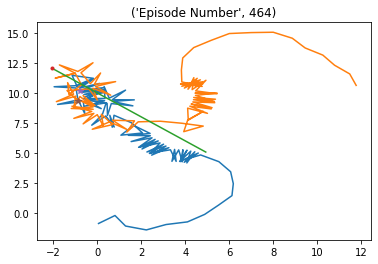

Episode * 465 * Avg Reward is ==> 2973.3375993802574 : Ag1 Reward ==> 1469.968538698769 : Ag2 Reward ==> 1436.5802873723985 


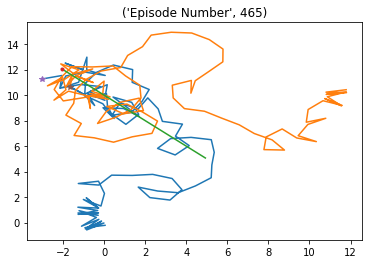

Episode * 466 * Avg Reward is ==> 2978.256253537086 : Ag1 Reward ==> 1520.1590582770216 : Ag2 Reward ==> 1457.4456290374806 


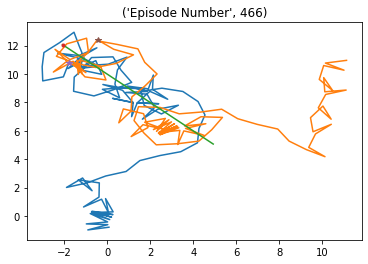

KeyboardInterrupt: ignored

In [ ]:

ep_reward_list = []
# To store average reward history of last few episodes
avg_reward_list = []

ag1_reward_list = []
ag2_reward_list = []

# Takes about 20 min to train
for ep in range(num_episodes):

    env = environment()
    prev_state = env.initial_obs()

    
    episodic_reward = 0
    ag1_reward = 0
    ag2_reward = 0
    
    xp1 = []
    yp1 = []
    xp2 = []
    yp2 = []
    xce = []
    yce = []

    
    #while True:
    for i in range(num_steps):
        
        tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)
        actions = []
        for j, model in enumerate(ac_models):
          action = policy(tf_prev_state[:,4*j:4*(j+1)], ou_noise, model)
          actions.append(float(action[0]))

        # Recieve state and reward from environment.
        #new_state, sys_state, ev_state = transition(prev_state, sys_state, actions, ev_state)
        new_state = env.step(actions)
        rewards = reward(new_state)

        buffer.record((prev_state, actions, rewards, new_state))
        
        episodic_reward += sum(rewards)
        ag1_reward += rewards[0]
        ag2_reward += rewards[1]

        buffer.learn(ac_models, cr_models, target_ac, target_cr)
        update_target(tau, ac_models, cr_models, target_ac, target_cr)

        prev_state = new_state
        xp1.append(env.p1_rx)
        yp1.append(env.p1_ry)
        xp2.append(env.p2_rx)
        yp2.append(env.p2_ry)
        
        xce.append(env.e_rx)
        yce.append(env.e_ry)
        
    xc1 = [env.e_rx]
    yc1 = [env.e_ry]

    ep_reward_list.append(episodic_reward)
    ag1_reward_list.append(ag1_reward)
    ag2_reward_list.append(ag2_reward)

    # Mean of last 40 episodes
    avg_reward = np.mean(ep_reward_list[-40:])
    print("Episode * {} * Avg Reward is ==> {} : Ag1 Reward ==> {} : Ag2 Reward ==> {} ".format(ep+1, avg_reward, ag1_reward, ag2_reward))
    avg_reward_list.append(avg_reward)
    plt.plot(xp1,yp1)
    plt.plot(xp2,yp2)
    plt.plot(xce,yce)
    plt.plot(xc1,yc1,'.') 
    plt.plot(xp1[-1],yp1[-1],'*')
    plt.plot(xp2[-1],yp2[-1],'*')
    title = 'Episode Number', ep+1
    plt.title(title)
    plt.show()

# Plotting graph
# Episodes versus Avg. Rewards
plt.plot(avg_reward_list)
plt.xlabel("Episode")
plt.ylabel("Avg. Epsiodic Reward")
plt.show()

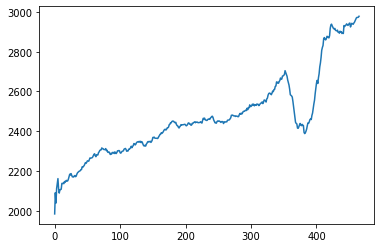

In [ ]:
plt.plot(avg_reward_list[:])
plt.show()

Episode * 1 * Avg Reward is ==> 3218.2097351220764 : Ag1 Reward ==> 1641.1212357927477 : Ag2 Reward ==> 1577.0884993293282 


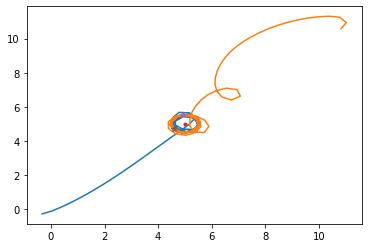

In [ ]:
ve = 0.0
dt = 0.4
rho = 0.3
te = 3*np.pi/4
def policy(state, noise_object, model):
    
    sampled_actions = tf.squeeze(model(state))
    noise = noise_object()

    # Adding noise to action
    sampled_actions = sampled_actions.numpy() + 0

    # We make sure action is within bounds
    legal_action = np.clip(sampled_actions, -1.0, 1.0)

    return [np.squeeze(legal_action)]


import random
class environment:
  def __init__(self):
    self.p1_rx = random.uniform(0.0, -1.0)
    self.p1_ry = random.uniform(0.0, -1.0)
    self.p2_rx = random.uniform(10.0, 11.0)
    self.p2_ry = random.uniform(10.0, 11.0)
    self.p1_vx = 1.0
    self.p1_vy = 0.0
    self.p2_vx = 1.0
    self.p2_vy = 0.0
    self.e_rx = +5.0
    self.e_ry = +5.0
    self.e_vx = ve*np.cos(te)
    self.e_vy = ve*np.sin(te)
    '''
    self.state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_ry, self.e_rx,
                  self.e_ry]
    self.state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_ry, self.e_rx,
                  self.e_ry]
    self.state_p1_p2 = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_ry, self.p2_rx,
                   self.p1_ry]
    self.state_p2_p1 = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_ry, self.p1_rx,
                   self.p1_ry]
    '''

  def initial_state(self):
    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]
    state_p1_p2 = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                   self.p1_ry]
    state_p2_p1 = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                   self.p1_ry]
    return state_p1_e, state_p2_e
    

  def initial_obs(self):
    #state_p1_e, state_p2_e = self.initial_state()

    d_p1_e = L(self.p1_rx, self.p1_ry, self.e_rx, self.e_ry)
    d_p2_e = L(self.p2_rx, self.p2_ry, self.e_rx, self.e_ry)
    d_p1_p2 = L(self.p1_rx, self.p1_ry, self.p2_rx, self.p2_ry)
    d_p2_p1 = L(self.p2_rx, self.p2_ry, self.p1_rx, self.p1_ry)
    
    phi_p1_e  = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    phi_p1_p2 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                  self.p2_ry)
    phi_p2_e  = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    phi_p2_p1 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p1  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p2  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p2_rx,
                  self.p2_ry)
    
    obs = [d_p1_e/30.0, phi_p1_e/np.pi, d_p1_p2/30.0, phi_p1_p2/np.pi,
           d_p2_e/30.0, phi_p2_e/np.pi, d_p2_p1/30.0, phi_p2_p1/np.pi]
           #d_e_p1/30.0, phi_e_p1/np.pi, d_e_p2/30.0,  phi_e_p2/np.pi]

    return obs

  def state_step(self, actions):
    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]
    theta_v_p1 = thetap(state_p1_e)
    theta_v_p2 = thetap(state_p2_e)

    

    del_rx_p1 = self.p1_vx * dt
    del_ry_p1 = self.p1_vy * dt
    del_rx_p2 = self.p2_vx * dt
    del_ry_p2 = self.p2_vy * dt
    del_rx_e  = self.e_vx  * dt
    del_ry_e  = self.e_vy  * dt

    del_theta_v_p1 = (1.0/rho)*actions[0]*dt
    del_theta_v_p2 = (1.0/rho)*actions[1]*dt

    theta_v_p1 = theta_v_p1 + del_theta_v_p1
    theta_v_p2 = theta_v_p2 + del_theta_v_p2

    self.p1_rx = self.p1_rx + del_rx_p1
    self.p1_ry = self.p1_ry + del_ry_p1
    self.p1_vx = 1.0 * np.cos(theta_v_p1)
    self.p1_vy = 1.0 * np.sin(theta_v_p1)

    self.p2_rx = self.p2_rx + del_rx_p2
    self.p2_ry = self.p2_ry + del_ry_p2
    self.p2_vx = 1.0 * np.cos(theta_v_p2)
    self.p2_vy = 1.0 * np.sin(theta_v_p2)

    self.e_rx = self.e_rx + del_rx_e
    self.e_ry = self.e_ry + del_ry_e

    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]

    return state_p1_e, state_p2_e

  def step(self, actions):

    old_phi_p1 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    old_phi_p2 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    
    state_p1_e, state_p2_e = self.state_step(actions)

    '''
    obs_p1 = [d_p1_e/30.0, phi_p1_e/np.pi, (new_phi_p1-old_phi_p1)/(dt)]
    obs_p2 = [d_p2_e/30.0, phi_p2_e/np.pi, (new_phi_p2-old_phi_p2)/(dt)]

    obs = [d_p1_e/30.0, phi_p1_e/np.pi, (new_phi_p1-old_phi_p1)/(dt),
           d_p2_e/30.0, phi_p2_e/np.pi, (new_phi_p2-old_phi_p2)/(dt)]
    '''
    d_p1_e = L(self.p1_rx, self.p1_ry, self.e_rx, self.e_ry)
    d_p2_e = L(self.p2_rx, self.p2_ry, self.e_rx, self.e_ry)
    d_p1_p2 = L(self.p1_rx, self.p1_ry, self.p2_rx, self.p2_ry)
    d_p2_p1 = L(self.p2_rx, self.p2_ry, self.p1_rx, self.p1_ry)
    
    phi_p1_e  = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    phi_p1_p2 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                  self.p2_ry)
    phi_p2_e  = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    phi_p2_p1 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p1  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p2  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p2_rx,
                  self.p2_ry)
    
    obs = [d_p1_e/30.0, phi_p1_e/np.pi, d_p1_p2/30.0, phi_p1_p2/np.pi,
           d_p2_e/30.0, phi_p2_e/np.pi, d_p2_p1/30.0, phi_p2_p1/np.pi]
           #d_e_p1/30.0, phi_e_p1/np.pi, d_e_p2/30.0,  phi_e_p2/np.pi]

    return obs
  

ep_reward_list = []
# To store average reward history of last few episodes
avg_reward_list = []

ag1_reward_list = []
ag2_reward_list = []

# Takes about 20 min to train
for ep in range(1):

    env = environment()
    prev_state = env.initial_obs()

    '''
    sys_state = [0.0,0.0,1.0,0.0]
    ev_state = [5.0,5.0]

    ag_state = []

    for i in sys_state:
      ag_state.append(i)
    for i in ev_state:
      ag_state.append(i)
    
    prev_state = [L(ag_state)/30.0, phi(ag_state)/np.pi, 0.0]

    for i in range(1,num_agents):
      sys_state.append(sys_state[0])
      sys_state.append(sys_state[1]+i)
      sys_state.append(sys_state[2])
      sys_state.append(sys_state[3])

      ag_state = []

      for j in sys_state[i*4:]:
        ag_state.append(j)
      for j in ev_state:
        ag_state.append(j)

      prev_state.append(L(ag_state)/30.0)
      prev_state.append(phi(ag_state)/np.pi)
      prev_state.append(0.0)
    
    prev_state = np.array(prev_state)
    '''
    episodic_reward = 0
    ag1_reward = 0
    ag2_reward = 0
    
    xp1 = []
    yp1 = []
    xp2 = []
    yp2 = []
    xce = []
    yce = []

    
    #while True:
    for i in range(100):
        
        tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)
        actions = []
        for j, model in enumerate(ac_models):
          action = policy(tf_prev_state[:,4*j:4*(j+1)], ou_noise, model)
          actions.append(float(action[0]))

        # Recieve state and reward from environment.
        #new_state, sys_state, ev_state = transition(prev_state, sys_state, actions, ev_state)
        new_state = env.step(actions)
        rewards = reward(new_state)

        #buffer.record((prev_state, actions, rewards, new_state))
        
        episodic_reward += sum(rewards)
        ag1_reward += rewards[0]
        ag2_reward += rewards[1]

        #buffer.learn(ac_models, cr_models, target_ac, target_cr)
        #update_target(tau, ac_models, cr_models, target_ac, target_cr)

        prev_state = new_state
        xp1.append(env.p1_rx)
        yp1.append(env.p1_ry)
        xp2.append(env.p2_rx)
        yp2.append(env.p2_ry)
        
        xce.append(env.e_rx)
        yce.append(env.e_ry)
        
    xc1 = [env.e_rx]
    yc1 = [env.e_ry]

    ep_reward_list.append(episodic_reward)
    ag1_reward_list.append(ag1_reward)
    ag2_reward_list.append(ag2_reward)

    # Mean of last 40 episodes
    avg_reward = np.mean(ep_reward_list[-40:])
    print("Episode * {} * Avg Reward is ==> {} : Ag1 Reward ==> {} : Ag2 Reward ==> {} ".format(ep+1, avg_reward, ag1_reward, ag2_reward))
    avg_reward_list.append(avg_reward)
    plt.plot(xp1,yp1)
    plt.plot(xp2,yp2)
    plt.plot(xce,yce)
    plt.plot(xc1,yc1,'.') 
    plt.plot(xp1[-1],yp1[-1],'*')
    plt.plot(xp2[-1],yp2[-1],'*')
   
    plt.show()

# Plotting graph


Episode * 1 * Avg Reward is ==> 1199.907696538068 : Ag1 Reward ==> 617.8021468747236 : Ag2 Reward ==> 582.1055496633445 


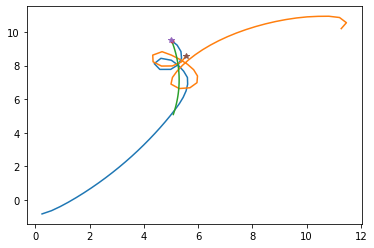

In [ ]:
ve = 0.3
dt = 0.4
rho = 0.3
te = np.pi/4
rho_e = 10.0
def policy(state, noise_object, model):
    
    sampled_actions = tf.squeeze(model(state))
    noise = noise_object()

    # Adding noise to action
    sampled_actions = sampled_actions.numpy() + 0

    # We make sure action is within bounds
    legal_action = np.clip(sampled_actions, -1.0, 1.0)

    return [np.squeeze(legal_action)]

import random
class environment:
  def __init__(self):
    self.p1_rx = random.uniform(0.0, -1.0)
    self.p1_ry = random.uniform(0.0, -1.0)
    self.p2_rx = random.uniform(10.0, 11.0)
    self.p2_ry = random.uniform(10.0, 11.0)
    self.p1_vx = 1.0
    self.p1_vy = 0.0
    self.p2_vx = 1.0
    self.p2_vy = 0.0
    self.e_rx = 5.0
    self.e_ry = 5.0
    self.e_vx = ve*np.cos(te)
    self.e_vy = ve*np.sin(te)
    '''
    self.state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_ry, self.e_rx,
                  self.e_ry]
    self.state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_ry, self.e_rx,
                  self.e_ry]
    self.state_p1_p2 = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_ry, self.p2_rx,
                   self.p1_ry]
    self.state_p2_p1 = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_ry, self.p1_rx,
                   self.p1_ry]
    '''

  def initial_state(self):
    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]
    state_p1_p2 = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                   self.p1_ry]
    state_p2_p1 = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                   self.p1_ry]
    return state_p1_e, state_p2_e
    

  def initial_obs(self):
    #state_p1_e, state_p2_e = self.initial_state()

    d_p1_e = L(self.p1_rx, self.p1_ry, self.e_rx, self.e_ry)
    d_p2_e = L(self.p2_rx, self.p2_ry, self.e_rx, self.e_ry)
    d_p1_p2 = L(self.p1_rx, self.p1_ry, self.p2_rx, self.p2_ry)
    d_p2_p1 = L(self.p2_rx, self.p2_ry, self.p1_rx, self.p1_ry)
    
    phi_p1_e  = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    phi_p1_p2 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                  self.p2_ry)
    phi_p2_e  = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    phi_p2_p1 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p1  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p2  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p2_rx,
                  self.p2_ry)
    
    obs = [d_p1_e/30.0, phi_p1_e/np.pi, d_p1_p2/30.0, phi_p1_p2/np.pi,
           d_p2_e/30.0, phi_p2_e/np.pi, d_p2_p1/30.0, phi_p2_p1/np.pi]
           #d_e_p1/30.0, phi_e_p1/np.pi, d_e_p2/30.0,  phi_e_p2/np.pi]

    return obs

  def state_step(self, actions, theta_v_e):
    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]
    theta_v_p1 = thetap(state_p1_e)
    theta_v_p2 = thetap(state_p2_e)

    

    del_rx_p1 = self.p1_vx * dt
    del_ry_p1 = self.p1_vy * dt
    del_rx_p2 = self.p2_vx * dt
    del_ry_p2 = self.p2_vy * dt
    del_rx_e  = self.e_vx  * dt
    del_ry_e  = self.e_vy  * dt

    del_theta_v_p1 = (1.0/rho)*actions[0]*dt
    del_theta_v_p2 = (1.0/rho)*actions[1]*dt
    del_theta_v_e  = (ve/rho_e)*1.0*dt

    theta_v_p1 = theta_v_p1 + del_theta_v_p1
    theta_v_p2 = theta_v_p2 + del_theta_v_p2
    theta_v_e  = theta_v_e  + del_theta_v_e

    self.p1_rx = self.p1_rx + del_rx_p1
    self.p1_ry = self.p1_ry + del_ry_p1
    self.p1_vx = 1.0 * np.cos(theta_v_p1)
    self.p1_vy = 1.0 * np.sin(theta_v_p1)

    self.p2_rx = self.p2_rx + del_rx_p2
    self.p2_ry = self.p2_ry + del_ry_p2
    self.p2_vx = 1.0 * np.cos(theta_v_p2)
    self.p2_vy = 1.0 * np.sin(theta_v_p2)

    self.e_rx = self.e_rx + del_rx_e
    self.e_ry = self.e_ry + del_ry_e
    self.e_vx = ve * np.cos(theta_v_e)
    self.e_vy = ve * np.sin(theta_v_e)

    state_p1_e = [self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry]
    state_p2_e = [self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry]

    return state_p1_e, state_p2_e, theta_v_e

  def step(self, actions, theta_v_e):

    old_phi_p1 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    old_phi_p2 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    
    state_p1_e, state_p2_e, theta_v_e = self.state_step(actions, theta_v_e)

    '''
    obs_p1 = [d_p1_e/30.0, phi_p1_e/np.pi, (new_phi_p1-old_phi_p1)/(dt)]
    obs_p2 = [d_p2_e/30.0, phi_p2_e/np.pi, (new_phi_p2-old_phi_p2)/(dt)]

    obs = [d_p1_e/30.0, phi_p1_e/np.pi, (new_phi_p1-old_phi_p1)/(dt),
           d_p2_e/30.0, phi_p2_e/np.pi, (new_phi_p2-old_phi_p2)/(dt)]
    '''
    d_p1_e = L(self.p1_rx, self.p1_ry, self.e_rx, self.e_ry)
    d_p2_e = L(self.p2_rx, self.p2_ry, self.e_rx, self.e_ry)
    d_p1_p2 = L(self.p1_rx, self.p1_ry, self.p2_rx, self.p2_ry)
    d_p2_p1 = L(self.p2_rx, self.p2_ry, self.p1_rx, self.p1_ry)
    
    phi_p1_e  = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.e_rx,
                  self.e_ry)
    phi_p1_p2 = phi(self.p1_rx, self.p1_ry, self.p1_vx, self.p1_vy, self.p2_rx,
                  self.p2_ry)
    phi_p2_e  = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.e_rx,
                  self.e_ry)
    phi_p2_p1 = phi(self.p2_rx, self.p2_ry, self.p2_vx, self.p2_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p1  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p1_rx,
                  self.p1_ry)
    phi_e_p2  = phi(self.e_rx, self.e_ry, self.e_vx, self.e_vy, self.p2_rx,
                  self.p2_ry)
    
    obs = [d_p1_e/30.0, phi_p1_e/np.pi, d_p1_p2/30.0, phi_p1_p2/np.pi,
           d_p2_e/30.0, phi_p2_e/np.pi, d_p2_p1/30.0, phi_p2_p1/np.pi]
           #d_e_p1/30.0, phi_e_p1/np.pi, d_e_p2/30.0,  phi_e_p2/np.pi]

    return obs, theta_v_e
  


ep_reward_list = []
# To store average reward history of last few episodes
avg_reward_list = []

ag1_reward_list = []
ag2_reward_list = []

# Takes about 20 min to train
for ep in range(1):

    env = environment()
    prev_state = env.initial_obs()

    '''
    sys_state = [0.0,0.0,1.0,0.0]
    ev_state = [5.0,5.0]

    ag_state = []

    for i in sys_state:
      ag_state.append(i)
    for i in ev_state:
      ag_state.append(i)
    
    prev_state = [L(ag_state)/30.0, phi(ag_state)/np.pi, 0.0]

    for i in range(1,num_agents):
      sys_state.append(sys_state[0])
      sys_state.append(sys_state[1]+i)
      sys_state.append(sys_state[2])
      sys_state.append(sys_state[3])

      ag_state = []

      for j in sys_state[i*4:]:
        ag_state.append(j)
      for j in ev_state:
        ag_state.append(j)

      prev_state.append(L(ag_state)/30.0)
      prev_state.append(phi(ag_state)/np.pi)
      prev_state.append(0.0)
    
    prev_state = np.array(prev_state)
    '''

    state_e_p1 = [env.e_rx, env.e_ry, env.e_vx, env.e_vy,
                  env.p1_rx, env.p1_ry]

    theta_v_e  = thetap(state_e_p1)


    episodic_reward = 0
    ag1_reward = 0
    ag2_reward = 0
    
    xp1 = []
    yp1 = []
    xp2 = []
    yp2 = []
    xce = []
    yce = []

    
    #while True:
    for i in range(200):
        
        tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)
        actions = []
        for j, model in enumerate(ac_models):
          action = policy(tf_prev_state[:,4*j:4*(j+1)], ou_noise, model)
          actions.append(float(action[0]))

        # Recieve state and reward from environment.
        #new_state, sys_state, ev_state = transition(prev_state, sys_state, actions, ev_state)
        new_state, theta_v_e = env.step(actions, theta_v_e)
        rewards = reward(new_state)

        #buffer.record((prev_state, actions, rewards, new_state))
        
        episodic_reward += sum(rewards)
        ag1_reward += rewards[0]
        ag2_reward += rewards[1]

        #buffer.learn(ac_models, cr_models, target_ac, target_cr)
        #update_target(tau, ac_models, cr_models, target_ac, target_cr)

        prev_state = new_state
        xp1.append(env.p1_rx)
        yp1.append(env.p1_ry)
        xp2.append(env.p2_rx)
        yp2.append(env.p2_ry)
        
        xce.append(env.e_rx)
        yce.append(env.e_ry)

        d_p1_e = L(env.p1_rx, env.p1_ry, env.e_rx, env.e_ry)
        d_p2_e = L(env.p2_rx, env.p2_ry, env.e_rx, env.e_ry)

        if d_p1_e < 0.1 or d_p2_e < 0.1:
          break
        
    xc1 = [env.e_rx]
    yc1 = [env.e_ry]

    ep_reward_list.append(episodic_reward)
    ag1_reward_list.append(ag1_reward)
    ag2_reward_list.append(ag2_reward)

    # Mean of last 40 episodes
    avg_reward = np.mean(ep_reward_list[-40:])
    print("Episode * {} * Avg Reward is ==> {} : Ag1 Reward ==> {} : Ag2 Reward ==> {} ".format(ep+1, avg_reward, ag1_reward, ag2_reward))
    avg_reward_list.append(avg_reward)
    plt.plot(xp1,yp1)
    plt.plot(xp2,yp2)
    plt.plot(xce,yce)
    plt.plot(xc1,yc1,'.') 
    plt.plot(xp1[-1],yp1[-1],'*')
    plt.plot(xp2[-1],yp2[-1],'*')
   
    plt.show()

# Plotting graph
